#**Practical Principles of Designing Fair Algorithms : Project Phase 3**

package installations

In [ ]:
pip install pixellib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 430.3/430.3 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 338.1/338.1 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

imports

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import itertools
from skimage.color import rgb2lab, lab2rgb
import numpy as np
import colorsys
import math

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import seaborn as sns

# 1. Introduction

# ***Question***
How accurately does Sephora's skin shade detection algorithm identify and match skin tones across a diverse set of skin shades compared to human experts?


# ***Hypothesis***
We believe that Sephora's skin shade detection algorithm demonstrates a lower accuracy rate in identifying and matching foundations for skin tones specially darker shades compared to lighter shades, indicating a potential bias in the algorithm. We also think that based on the foundations that are available in the market mixing two shades within the same brand will produce a better foundation match than choosing one specific foundation within a brand for an individual’s skin tone. Different representations of colors will produce different ratios when mixing foundations to match an individual’s skin tone as the representation of color associations are different.Generally, the algorithms attempt precise color picking from facial images but struggle with variations such as tattoos and pigmentation, which can skew the accuracy, especially under diverse lighting conditions. However, segmenting out the skin are of the face excluding features like the eyes, eyebrows, lips, hair and background would contribute to better average skin color calculation.

# ***Methods***
This discrepancy might be narrower or non-existent when compared to human experts' performance, suggesting that algorithmic interventions could potentially either amplify existing biases or mitigate them under certain conditions.
For the measurements, we will create a new model with less bias, that can predict the skin shades specifically the darker skin shades more accurately.  For developing this model we will use Computer Vision based segmentation model using dlib library in python where a contour of points is created around facial features which can be used to create a segment mask of only the skin on the face and then match to the closest match of mix of two foundations as customers with skin shades that are less accurately detected and matched by Sephora's skin shade detection algorithm report lower satisfaction levels with the product recommendations. This dissatisfaction may correlate with a perception of exclusion or bias, affecting the overall brand loyalty and trust among customers of diverse backgrounds.  

# ***Measurement***
The metrics that will be used to analyze the effectiveness of our two algorithms is a euclidean distance between the true skin tone and our matches in terms of hex values. We will describe this metric as the “error distance”, which is a standard metric used to evaluate accuracy of skin tone matches, as it is a spectrum rather than a category. We will evaluate the error distance across a range of skin tones, varying from lighter skin tones to darker skin tones.

# ***Why is it important?***
This project is both interesting and important for many reasons.  It has a societal and inclusivity impact because skin shade detection systems are used in industries where personalization is crucial like cosmetics, impacting user experience and satisfaction. Ensuring these systems accurately recognize and cater to a diverse range of skin tones is vital for inclusivity, reflecting the diversity of the global population. The question targets the heart of algorithmic bias disparities in how technology serves different groups of people. By focusing on fairness, this research aims to reduce systemic biases that might exclude or misrepresent underrepresented skin tones.

This question has technological advancement because addressing fairness in skin shade detection not only benefits users but also pushes the technology forward. It encourages the development of more sophisticated models that can handle a wider variety of inputs more accurately. Successfully enhancing fairness in one application area can serve as a blueprint for addressing algorithmic bias across other domains, inspiring broader improvements in AI and machine learning practices.  

This research question is a direct examination of algorithmic fairness, which concerns the development and deployment of AI systems that treat all individuals and groups equitably. By focusing on a practical application like skin shade detection, the question moves the conversation from abstract ethical considerations to concrete, measurable outcomes. It challenges researchers and practitioners to consider not just the performance of their algorithms but the impact of ensuring that advancements in AI benefit everyone equally, without exacerbating existing inequalities.

# ***What has been done?***
The paper “Gender Shades: Intersectional Accuracy Disparities in Commercial Gender Classification" by Joy Buolamwini and Timnit Gebru is a pivotal paper in the discussion of algorithmic fairness, particularly in the context of facial analysis technology.  This paper falls under the category of empirical research within the broader fields of algorithmic fairness and social computing. It specifically addresses bias in commercial AI systems used for gender classification, making a significant contribution to the discourse on ethical AI.
Buolamwini and Gebru provide a thorough analysis of commercial gender classification systems from IBM, Microsoft, and Face++, demonstrating significant disparities in accuracy across gender and skin color. The study shows that darker-skinned females are the most misclassified group, with much higher accuracy for lighter-skinned individuals.
Intersectional Approach: The paper introduces an intersectional methodology to AI fairness research, combining gender and skin color analysis to reveal compounded biases not visible through a single-axis analysis.
Public Resource: The creation of the Pilot Parliaments Benchmark (PPB) dataset for evaluating skin type classification fairness. This dataset is more demographically balanced across genders and skin types than previous datasets used in the field.
This paper relates to our topic because "Gender Shades" emerged at a time when concerns about algorithmic bias were gaining prominence but lacked substantial empirical evidence, especially from an intersectional perspective. By highlighting specific disparities in commercial systems, the paper catalyzed a broader recognition of and response to algorithmic bias, urging companies and researchers to prioritize fairness and inclusivity in AI development.
Strengths: One of the paper's main strengths is its clear demonstration that AI systems can perpetuate social biases, making a compelling case for the importance of diverse training data and rigorous bias auditing. The intersectional analysis approach also sets a new standard for fairness evaluations in AI.
Criticisms: Critics might argue that the paper focuses predominantly on binary gender classifications, which do not encompass the full spectrum of gender identities. Additionally, while the paper calls for more inclusive data, the practical challenges and ethical considerations of collecting and labeling such data are not deeply explored.
 This paper is directly relevant to our project on the fairness of algorithms in skin shade detection, as it provides a foundational example of how biases in AI can impact real-world applications. The methodologies and findings in "Gender Shades" can inform our approach to evaluating and improving the fairness of Sephora's skin shade detection system. By adopting an intersectional lens, we can more effectively identify and address biases that might affect the accuracy and inclusivity of the technology. This paper underscores the importance of considering diverse data and the potential impacts of biases on different demographic groups, which are crucial considerations for this project.


# 2. Datasheet

## Monk Skin Tone Examples (MST-E) Dataset Datasheet

### 1. Dataset Description

#### a. Observations (rows) and Attributes (columns)

- **Observations (rows)**: Each row represents a unique image of an individual's skin portion under controlled conditions, totaling over [insert number] images.
- **Attributes (columns)**: Detailed attributes include:
  - `Image_ID`: A unique identifier for each image.
  - `Skin_Tone`: Categorized based on the Fitzpatrick skin type scale or a similar dermatological standard.
  - `Lighting_Condition`: Description of the lighting setup (e.g., natural, artificial, mixed).
  - `Image_URL`: URL where the image is stored.
  - `Annotation_by`: Identifier of the expert who annotated the skin tone.
  - `Date_of_Capture`: The date on which the image was captured.
  - `Geographic_Origin`: The geographical origin of the subject to ensure diversity.
  - `Age_Group`: Age range of the subject.
  - `Gender`: Gender of the subject.
  - `Consent_Type`: Type of consent obtained (e.g., written, verbal).

### 2. Motivation

#### a. Why was this dataset created?

- **Purpose**: Developed to address the lack of diversity in skin tone representations in existing datasets, the MST-E dataset aims to improve the performance and fairness of facial recognition and other image processing algorithms by providing a balanced representation of different skin tones.

### 3. Funding

#### a. Who funded the creation of the dataset?

- **Funding Sources**: The creation of the MST-E dataset was primarily supported by Google. This includes funding, resource allocation, and infrastructural support, highlighting Google's commitment to fostering ethical AI practices and enhancing diversity in AI datasets.

### 4. Data Collection Process

#### a. What processes might have influenced what data was observed and recorded and what was not?

- **Influences on Data Collection**:
  - **Selection Bias**: Efforts were made to minimize selection bias by including a diverse demographic in terms of ethnicity, age, and gender.
  - **Geographic Limitations**: The dataset might underrepresent regions where access to the necessary technology is limited.
  - **Ethical Considerations**: Strict adherence to ethical guidelines influenced which data could be ethically collected and included.

### 5. Data Preprocessing

#### a. What preprocessing was done, and how did the data come to be in the form that you are using?

- **Preprocessing Steps**:
  - **Image Editing**: Images were cropped to focus on relevant skin areas and resized to standard dimensions to facilitate processing.
  - **Color Calibration**: Images underwent color calibration to reduce variances caused by different camera sensors and lighting conditions.
  - **Annotation Review**: Annotations by initial experts were reviewed in a second round by a panel of dermatologists to ensure accuracy.

### 6. Data Usage

#### a. If people are involved, were they aware of the data collection and if so, what purpose did they expect the data to be used for?

- **Awareness and Consent**:
  - **Informed Consent**: All subjects were informed about the purposes of data collection, which include academic research and commercial applications in AI. They were provided with detailed information regarding where and how the images and data might be used.
  - **Opt-out Provisions**: Subjects were given the ability to opt out of the study at any time, and mechanisms for withdrawal of data were clearly outlined and facilitated.


### 7. Data Storage

#### a. Where can your raw source data be found, if applicable?

https://skintone.google/mste-dataset





## Makeup Shades Dataset Datasheet

### 1. Dataset Description

#### a. Observations (rows) and Attributes (columns)

- **Observations (rows)**: Each row represents a specific makeup shade entry.
- **Attributes (columns)**: Attributes include `Brand`, `Price`, `Shade Name`, `Product Link`, `Image Link`, and other relevant makeup properties.

### 2. Motivation

#### a. Why was this dataset created?

- **Purpose**: The dataset was created to provide a comprehensive list of makeup shades across various brands for analysis and comparison, aiding in the development of applications aimed at color matching and personalization in beauty tech specially focusing on diversity and inclusivity in shades for people of colo(BIPOC)

### 3. Funding

#### a. Who funded the creation of the dataset?

- **Funding Sources**: There is no explicit funding source mentioned for the dataset; it appears to be a community-driven or individual project hosted on Kaggle.

### 4. Data Collection Process

#### a. What processes might have influenced what data was observed and recorded and what was not?

- **Influences on Data Collection**: The dataset likely focuses on commercially available products, influenced by market availability and popularity of certain brands or shades and colors including hex and h,s,v,l values were obtained by using adobe color picking softwares.

### 5. Data Preprocessing

#### a. What preprocessing was done, and how did the data come to be in the form that you are using?

- **Preprocessing Steps**: Data has been structured into a uniform format, with missing values handled appropriately.

### 6. Data Usage

#### a. If people are involved, were they aware of the data collection and if so, what purpose did they expect the data to be used for?

- **Awareness and Consent**: As the data pertains to commercially available products and not individual people, personal consent is not applicable. Data usage is intended for analysis and application development in beauty technology.



### 7. Data Storage

#### a. Where can your raw source data be found, if applicable?

https://www.kaggle.com/datasets/shivamb/makeup-shades-dataset/code


#3. Cleaned data imports


a. Directly import a cleaned data file (.csv). You should have a separate ipynb called
“datacleaning.ipynb” that otherwise takes the data and does all of the relevant
data merging from Phase 2, and/or any other cleaning you’ve iterated on since
then.


In [ ]:
faces = pd.read_csv('/content/drive/MyDrive/practical applications of fair algos/Codes/Phase3/cleaned_data.csv')
faces

,image_ID,pose,lighting,mask,subject_name,MST
0,PXL_20220922_183620053.PORTRAIT.jpg,facing_camera,well_lit,0,subject_18,1
1,PXL_20220922_183617300.PORTRAIT.jpg,frontal,well_lit,0,subject_18,1
2,PXL_20220922_183609632.PORTRAIT.jpg,facing_camera,well_lit,0,subject_18,1
3,PXL_20220922_183322816.jpg,facing_camera,well_lit,0,subject_18,1
4,PXL_20220922_183321028.jpg,frontal,well_lit,0,subject_18,1
...,...,...,...,...,...,...
319,PXL_20220922_134350655.PORTRAIT.jpg,frontal,well_lit,0,subject_0,3
320,PXL_20220922_134339364.PORTRAIT.jpg,facing_camera,well_lit,0,subject_0,3
321,PXL_20220922_133026236.PORTRAIT.jpg,frontal,well_lit,0,subject_0,3
322,PXL_20220922_132959831.PORTRAIT.jpg,facing_camera,well_lit,0,subject_0,3


b. In a markdown cell, describe the cleaning steps taken in the other ipynb

We cleaned the MTS - E Face Data by dropping files that were in .gif and .mp4 format beause those files could not be used for our computer vision image skin color detection algorithm. Later, we removed the files that had poor lighting, masks and pictures with poses that had side and bottom view because these images were a hinderence to our algorithm as they did not display the entire face and poor lightening would effect the skin color detection.

# 4. Summarize the Data

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/practical applications of fair algos/Codes/makeupShades/shades.csv')
df.head()

,brand,brand_short,product,product_short,hex,H,S,V,L,group
0,Maybelline,mb,Fit Me,fmf,f3cfb3,26.0,0.26,0.95,86,2
1,Maybelline,mb,Fit Me,fmf,ffe3c2,32.0,0.24,1.00,92,2
2,Maybelline,mb,Fit Me,fmf,ffe0cd,23.0,0.20,1.00,91,2
3,Maybelline,mb,Fit Me,fmf,ffd3be,19.0,0.25,1.00,88,2
4,Maybelline,mb,Fit Me,fmf,bd9584,18.0,0.30,0.74,65,2


We have considered the hexadecimal color code (hex), hue (H), saturation (S), value (V), lightness (L), and group (group) as sensitive features. The hexadecimal color code directly influences how makeup shades appear on different skin tones, while hue, saturation, value, and lightness affect color perception and suitability. These variations can impact the match and inclusivity of makeup shades across diverse demographics. Additionally, grouping shades by brand, country, or recommendations reflects underlying biases and preferences, influencing shade availability and suitability for different groups. Recognizing and addressing these sensitive features is crucial for ensuring fairness, inclusivity, and accuracy in makeup shade distribution and algorithmic matching across diverse skin tones.


In [ ]:
descriptive_stats = df.describe()

In [ ]:
styled_descriptive_stats = descriptive_stats.style.set_table_styles([
    {'selector': 'th',
      'props': [('border', '1px solid black'),
                ('background-color', 'salmon'),
                ('text-align', 'center')]},
     {'selector': 'td',
      'props': [('border', '1px solid black'),
                ('text-align', 'center')]}]
).set_properties(**{'background-color': lambda val: column_colors.get(val.name, 'white')})

styled_descriptive_stats = styled_descriptive_stats.set_caption("Descriptive Statistics")

styled_descriptive_stats = styled_descriptive_stats.set_caption("<b style='font-size: 14pt'>Overall Outcome Variable Statistics</b>")

styled_descriptive_stats


,H,S,V,L,group
count,613.000000,613.000000,613.000000,625.000000,625.000000
mean,25.314845,0.459494,0.779543,65.920000,3.472000
std,5.327852,0.154089,0.173955,17.512267,1.976529
min,4.000000,0.100000,0.200000,11.000000,0.000000
25%,23.000000,0.350000,0.690000,55.000000,2.000000
50%,26.000000,0.440000,0.840000,71.000000,3.000000
75%,29.000000,0.560000,0.910000,79.000000,5.000000
max,45.000000,1.000000,1.000000,95.000000,7.000000


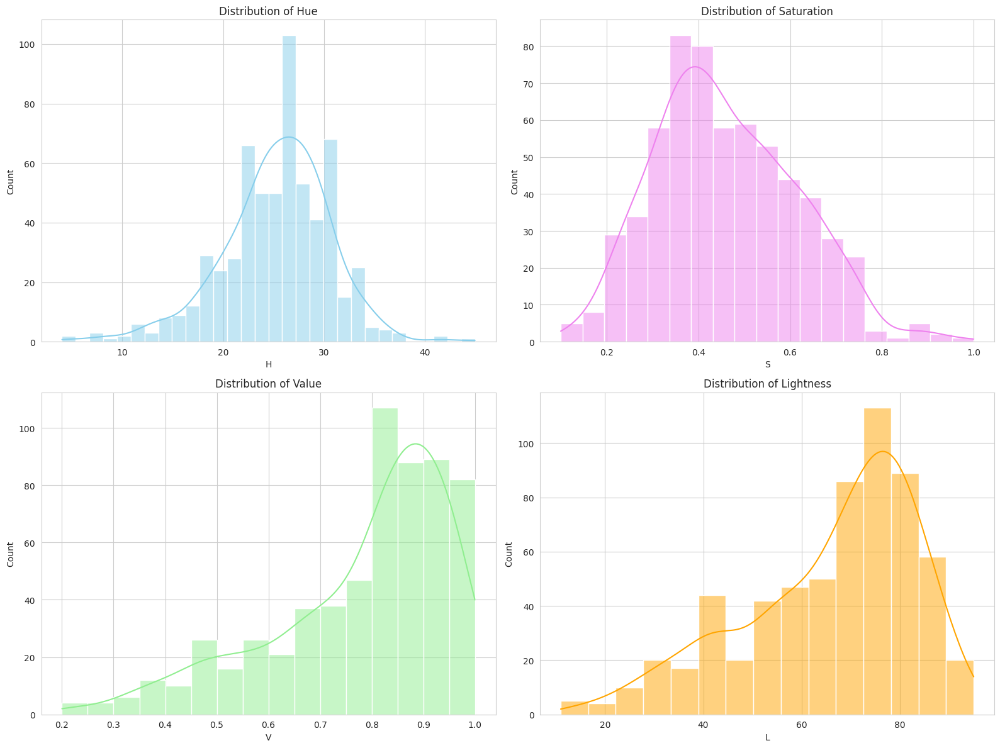

In [ ]:
sns.set_style('whitegrid')

fig, axs = plt.subplots(2, 2, figsize=(16, 12))

sns.histplot(data=df, x='H', kde=True, color='skyblue', ax=axs[0, 0])
axs[0, 0].set_title('Distribution of Hue')

sns.histplot(data=df, x='S', kde=True, color='violet', ax=axs[0, 1])
axs[0, 1].set_title('Distribution of Saturation')

sns.histplot(data=df, x='V', kde=True, color='lightgreen', ax=axs[1, 0])
axs[1, 0].set_title('Distribution of Value')

sns.histplot(data=df, x='L', kde=True, color='orange', ax=axs[1, 1])
axs[1, 1].set_title('Distribution of Lightness')

plt.tight_layout()
plt.show()

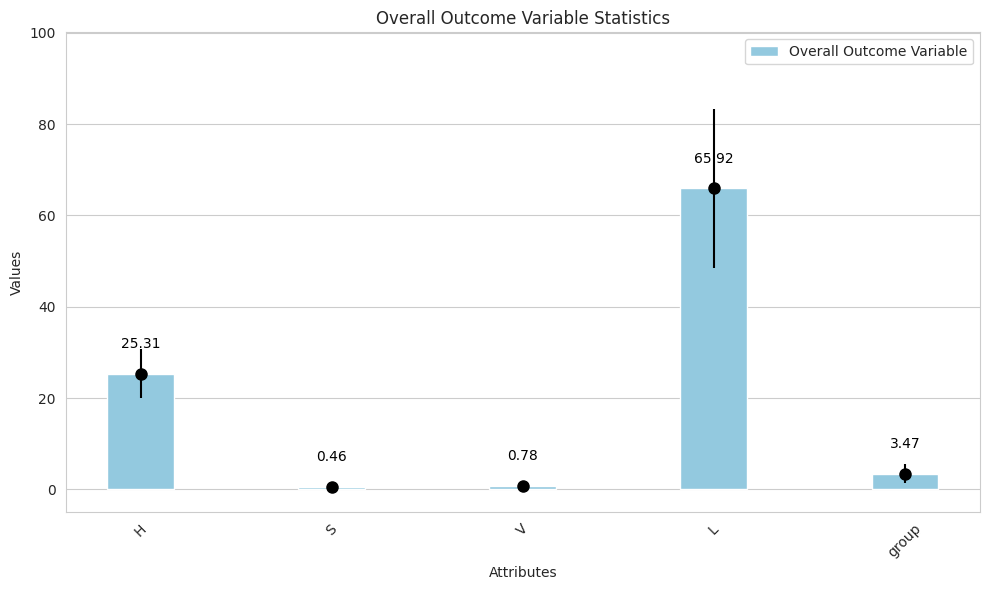

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

overall_means_df = descriptive_stats.loc['mean']

attributes = overall_means_df.index.tolist()
overall_means = overall_means_df.values
overall_std = descriptive_stats.loc['std'].values

plt.figure(figsize=(10, 6))

bar_width = 0.35

sns.barplot(x=attributes, y=overall_means, capsize=0.1, err_kws={'color': 'black', 'linewidth': 1.5},
            errorbar='sd', color='skyblue', label='Overall Outcome Variable', width=bar_width)

for i, (mean, std) in enumerate(zip(overall_means, overall_std)):
    plt.errorbar(x=i, y=mean, yerr=std, fmt='o', color='black', markersize=8)

offset = 5
for i, mean in enumerate(overall_means):
    plt.text(i, mean + offset, '{:.2f}'.format(mean), ha='center', va='bottom', fontsize=10, color='black')

plt.ylim(-5, max(overall_means + overall_std) * 1.2)

plt.title('Overall Outcome Variable Statistics')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
numeric_columns = ['H', 'S', 'V', 'L']
group_stats = df.groupby('group')[numeric_columns].agg(['mean', 'std', 'min', 'max', 'median'])

In [ ]:
styled_group_stats = group_stats.style.set_table_styles(
    [{'selector': 'th',
      'props': [('border', '1px solid black'),
                ('background-color', 'salmon'),
                ('text-align', 'center')]},
     {'selector': 'td',
      'props': [('border', '1px solid black'),
                ('text-align', 'center')]}]
).set_properties(**{'background-color': lambda val: column_colors.get(val.name, 'white')})

styled_group_stats = styled_group_stats.set_caption("Group Statistics")

styled_group_stats = styled_group_stats.set_caption("<b style='font-size: 14pt'>Outcome Variable Statistics within Relevant Sensitive Attribute Subgroups</b>")

styled_group_stats


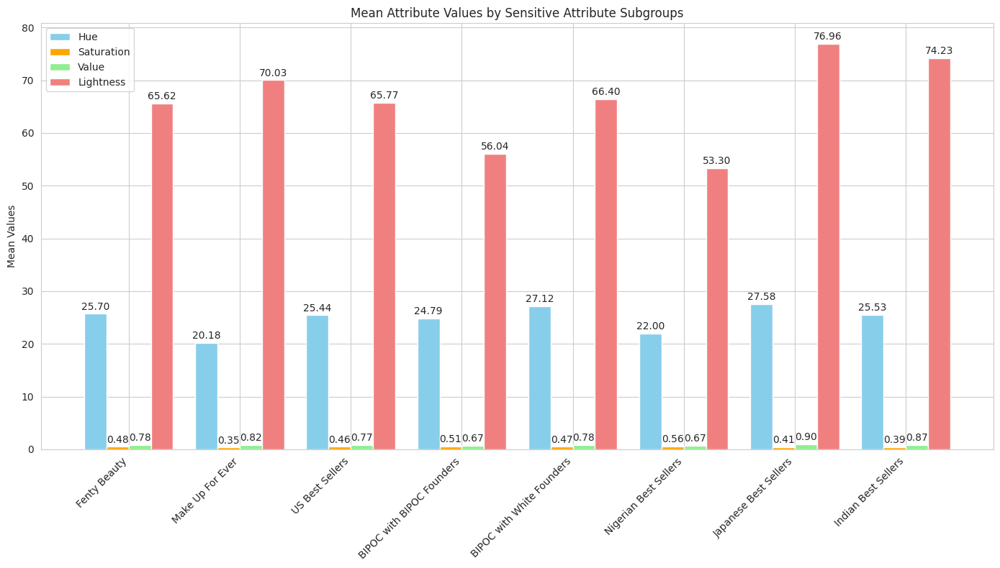

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

groups = ['Fenty Beauty', 'Make Up For Ever', 'US Best Sellers',
          'BIPOC with BIPOC Founders', 'BIPOC with White Founders',
          'Nigerian Best Sellers', 'Japanese Best Sellers', 'Indian Best Sellers']

x = np.arange(len(groups))

abbreviated_attributes = ['H', 'S', 'V', 'L']
full_attributes = ['Hue', 'Saturation', 'Value', 'Lightness']

colors = ['skyblue', 'orange', 'lightgreen', 'lightcoral']

attribute_map = dict(zip(abbreviated_attributes, full_attributes))

plt.figure(figsize=(14, 8))

width = 0.2

for i, attribute in enumerate(abbreviated_attributes):
    mean_values = group_stats[attribute]['mean']
    plt.bar(x + (i - 1.5) * width, mean_values, width, label=attribute_map[attribute], color=colors[i])

plt.ylabel('Mean Values')
plt.title('Mean Attribute Values by Sensitive Attribute Subgroups')
plt.xticks(x, groups, rotation=45, ha='right')
plt.legend()

def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate('{:.2f}'.format(height),
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 2),
                     textcoords="offset points",
                     ha='center', va='bottom')

for attribute_bars in plt.gca().containers:
    autolabel(attribute_bars)

plt.tight_layout()
plt.show()


The outcome variable statistics offer a snapshot of the makeup shades dataset, detailing the average color properties and their variability across the entire dataset. Analyzing these statistics within sensitive attribute subgroups reveals patterns and disparities in makeup shade offerings. For instance, groups associated with BIPOC-recommended brands display a broader range of hues and lower median lightness values, suggesting better representation of darker skin tones. Conversely, regional best sellers tend to focus more on lighter shades, as indicated by higher median lightness values. These insights illuminate potential biases in makeup shade availability across demographics and brands, facilitating efforts to enhance diversity and inclusivity in the beauty industry.


# 5. Modelling

## SECTION 1: Computer Vision Skin color detection

Ellaborating on Hypothesis in Introduction for each algorithm

Algorithm 1:

- For the computer vision algorithm we hypothesis that we can pick the color precisely based on the persons portrait image by considering a small area of the cheek.

- The face detection algorithm on averaging the shade based on pixel might not represent the best way to match for people with skin variations like tattoos and pigmentation.

- The face detecting algorithm takes into account features from the entire face so there will me bias in detecting the face shade of te person optimally because of this influence.

- Darker skin tones will produce a higher error rate than lighter skin tones in the foundation matching and pictures with low lighting will show detection bias.

Algorithm 2:

- The Algorithm will produce results better than algorithm 1 because this algorith segments out areas like the eyes, eyebrows, lips, hair and background, which can contribute to average color calculation

- more control over the region of skin and uniformity over all images unlike algorithm 1 where a region is fixed for all images

- Images of participant's with facial hair/ tattoos and irregularities in skin will cause miscalculation in skin shade

- Images with side pose might miscalulate the face segments because the 68 fac landmarks will not be accurate


Analysis:

This sophisticated analysis leverages computer vision and colorimetry to match facial skin tones to makeup shades with enhanced precision. The process begins with the use of OpenCV's "Cascade Classifier" to detect faces within a dataset through bounding boxes, ensuring the area with the maximum visibility of skin is captured eg cheek. The bounding box is then scaled and positioned to encapsulate this region accurately another algorithm is explored where 68 face landmarks is used to detect the face and create a segment mask without eyes, mouth, hair and eyebrows regions to build on top of the previous algorithm. Following this, the algorithm calculates the average pixel color of the skin within the bounding box, extracting a quantifiable representation of the skin tone. These skin tones are then converted into both hex and Lab values using functions from the skimage and colorsys libraries, with hex providing a standard color representation and Lab values offering a metric closer to human color perception.
The core of the analysis involves comparing these skin tone values against a database of makeup shades using Euclidean distance to find the closest or perfect match, thereby aiming to minimize error rates in makeup selection which is our hypothesis. Furthermore, the process includes a visualization of the matching results to assess accuracy and identify any potential bias across different races, ensuring the algorithm performs equitably for all skin tones.
Moreover, the study proposes exploring different color representations by converting foundation colors into Lab values via HSV, hypothesizing that this approach might align more closely with human color perception than traditional computer light-based methodologies. This comprehensive approach not only aims to improve the precision of makeup shade matching but also focuses on inclusivity and the nuances of human skin tones, leveraging advanced techniques in computer vision and color science.

Algorithm 1: CV Based Skin color detection and matching using OpenCV Cascade Classifer


In [ ]:
face_data = "/content/drive/MyDrive/practical applications of fair algos/Codes/faceData"

In [ ]:
shades_df = pd.read_csv("/content/drive/MyDrive/practical applications of fair algos/Codes/makeupShades/shades.csv")

In [ ]:
shades_df.head()

,brand,brand_short,product,product_short,hex,H,S,V,L,group
0,Maybelline,mb,Fit Me,fmf,f3cfb3,26.0,0.26,0.95,86,2
1,Maybelline,mb,Fit Me,fmf,ffe3c2,32.0,0.24,1.00,92,2
2,Maybelline,mb,Fit Me,fmf,ffe0cd,23.0,0.20,1.00,91,2
3,Maybelline,mb,Fit Me,fmf,ffd3be,19.0,0.25,1.00,88,2
4,Maybelline,mb,Fit Me,fmf,bd9584,18.0,0.30,0.74,65,2


In [ ]:
import cv2
import numpy as np
import os
import colorsys

def rgb_to_hex(rgb_color):
    return "#{:02x}{:02x}{:02x}".format(int(rgb_color[0]), int(rgb_color[1]), int(rgb_color[2]))

def rgb_to_lab_correctly(rgb_color):
    # Convert RGB to BGR since OpenCV expects BGR format
    bgr_color = np.array(rgb_color[::-1]).reshape(1, 1, 3).astype(np.uint8)
    # Convert BGR to LAB
    lab_color = cv2.cvtColor(bgr_color, cv2.COLOR_BGR2Lab)[0][0]
    # Convert L* from 0-255 to 0-100 range, and adjust a* and b* from 0-255 to -128 to 127 range
    L = lab_color[0] * (100.0 / 255.0)
    a = lab_color[1] - 128
    b = lab_color[2] - 128
    return (L, a, b)

def adjust_rgb_values(rgb):
    return tuple(int(val * 255) for val in rgb)

def find_average_skin_tone(image_path, output_path, use_hsv=False):
    image = cv2.imread(image_path)
    if image is None:
        return None, None, None

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray_image, 1.1, 4)

    if len(faces) == 0:
        return None, None, None

    x, y, w, h = faces[0]
    scale_factor = 0.15
    shift_left = 400
    new_w = int(w * scale_factor)
    new_h = int(h * scale_factor)
    new_x = x + (w - new_w) // 2 - shift_left
    new_y = y + (h - new_h) // 2

    cv2.rectangle(image, (new_x, new_y), (new_x + new_w, new_y + new_h), (255, 0, 0), 2)

    face_rgb = image[new_y:new_y+new_h, new_x:new_x+new_w]
    face_rgb = cv2.cvtColor(face_rgb, cv2.COLOR_BGR2RGB)
    average_color_per_row = np.average(face_rgb, axis=0)
    average_color = np.average(average_color_per_row, axis=0)

    hex_color = rgb_to_hex(average_color)
    lab_color = rgb_to_lab_correctly(average_color)

    cv2.imwrite(output_path, image)
    return hex_color, lab_color, (new_x, new_y, new_w, new_h)

def process_folder(input_folder, output_folder):
    results = []
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, f'detected_{filename}')
            hex_value, lab_value, face_bbox = find_average_skin_tone(image_path, output_path)
            if hex_value:
                results.append((filename, hex_value, lab_value, face_bbox))
            else:
                print(f"No face detected in {filename}.")
    return results

input_folder = '/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/shadematch'
output_folder = '/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/detected'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

results = process_folder(input_folder, output_folder)

for result in results:
    print(result)


('Copy of PXL_20220922_134346135.PORTRAIT.jpg', '#c39c95', (67.84313725490196, 13, 9), (1485, 1665, 270, 270))
('Copy of PXL_20220922_174521457.jpg', '#b27265', (54.509803921568626, 24, 18), (1043, 1584, 240, 240))
('Copy of PXL_20220922_173459363.jpg', '#221923', (10.588235294117647, 6, -5), (1047, 2600, 163, 163))
('Copy of PXL_20220922_193521063.jpg', '#8b594f', (43.13725490196078, 19, 14), (946, 2040, 340, 340))
('Copy of PXL_20220922_162359800.jpg', '#784e46', (37.64705882352941, 17, 12), (948, 1528, 191, 191))
('Copy of PXL_20220922_143230097.jpg', '#1f2783', (21.56862745098039, 31, -52), (1747, 621, 15, 15))
('Copy of PXL_20220922_142254164.PORTRAIT.jpg', '#ac817f', (58.03921568627451, 16, 8), (826, 2178, 207, 207))
('Copy of PXL_20220922_200610155.jpg', '#887689', (51.76470588235294, 11, -8), (1034, 1383, 245, 245))
('Copy of PXL_20220922_144614653.PORTRAIT.jpg', '#b08b8e', (61.568627450980394, 14, 4), (903, 1532, 236, 236))
('Copy of PXL_20220922_140335749.PORTRAIT.jpg', '#666

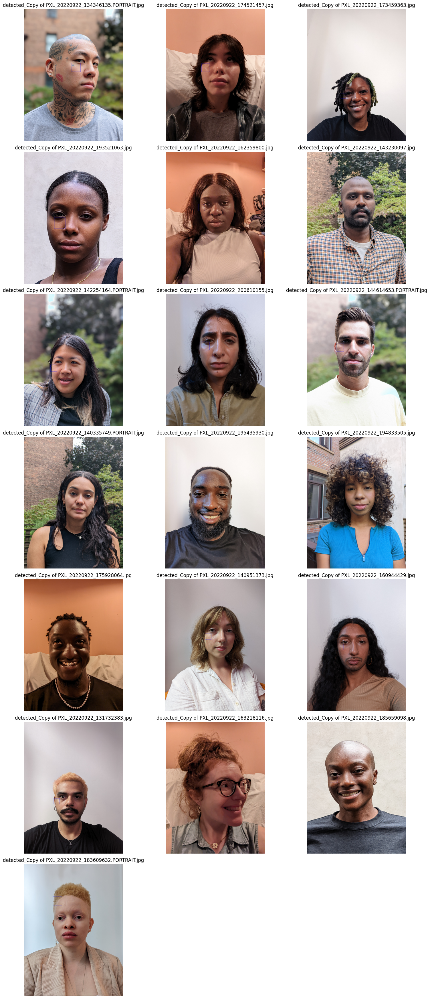

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

image_folder = '/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/detected'
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

num_images = len(image_files)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, rows * 5))
axs = axs.ravel()

for i, img_file in enumerate(image_files):

    img_path = os.path.join(image_folder , img_file)

    if not os.path.isfile(img_path):
        print(f"Error: '{img_path}' is not a file.")
        continue

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i].imshow(img)
    axs[i].set_title(img_file)
    axs[i].axis('off')

for i in range(num_images, len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()

**Evaluation Metrics**

In [ ]:
match_results = [
    ('Copy of PXL_20220922_134346135.PORTRAIT.jpg', '#c39c95', 'b7a597', 3.426233312962394, {'Lotus Herbals'}, (70.98039215686275, 15, 13), 1.4597385807117484, {"L'Oréal"}),
('Copy of PXL_20220922_174521457.jpg', '#b27265', 'b17862', 1.5356000162706838, {'Make Up For Ever'}, (55.68627450980392, 20, 21), 1.3725540198137445, {'Make Up For Ever'}),
('Copy of PXL_20220922_173459363.jpg', '#221923', '352315', 5.8033916027249965, {'Black Up'}, (16.470588235294116, 11, 11), 4.7470998766041745, {'Black Up'}),
('Copy of PXL_20220922_193521063.jpg', '#8b594f', '895852', 0.8471556468507005, {'Make Up For Ever'}, (42.745098039215684, 20, 12), 0.6066269166416458, {'Make Up For Ever'}),
('Copy of PXL_20220922_162359800.jpg', '#784e46', '774c43', 0.8471556468507005, {'Elsas Pro'}, (36.86274509803921, 17, 13), 0.3395975966760383, {'Elsas Pro'}),
('Copy of PXL_20220922_143230097.jpg', '#1f2783', '5e4638', 23.260996236581025, {'Maybelline'}, (16.470588235294116, 13, 11), 17.561012129368603, {'Maybelline'}),
('Copy of PXL_20220922_142254164.PORTRAIT.jpg', '#ac817f', 'b2856f', 3.9735121970119387, {'Maybelline'}, (63.13725490196078, 14, 15), 2.3748955345547733, {'Laws of Nature'}),
('Copy of PXL_20220922_200610155.jpg', '#887689', 'b2856f', 11.688204428965655, {'Maybelline'}, (46.666666666666664, 15, 14), 6.128401197576987, {'Revlon'}),
('Copy of PXL_20220922_144614653.PORTRAIT.jpg', '#b08b8e', 'bb8f7f', 4.307779621773616, {'Laws of Nature'}, (63.13725490196078, 14, 15), 2.969084933025561, {'Laws of Nature'}),
('Copy of PXL_20220922_140335749.PORTRAIT.jpg', '#666663', '7d5c4d', 7.553474621277734, {'Maybelline'}, (36.470588235294116, 9, 13), 4.353567311517278, {'Maybelline'}),
('Copy of PXL_20220922_195435930.jpg', '#776474', '8e6558', 8.207235112335823, {'Revlon'}, (42.745098039215684, 13, 13), 5.131923838049391, {'Elsas Pro'}),
('Copy of PXL_20220922_194833505.jpg', '#1b18da', '5e4638', 41.035550957602005, {'Maybelline'}, (42.35294117647059, 26, 14), 30.378399060605403, {'Hegai and Ester'}),
('Copy of PXL_20220922_175928064.jpg', '#0100ef', '5e4638', 49.104762637649095, {'Maybelline'}, (42.35294117647059, 26, 14), 34.15401757085311, {'Hegai and Ester'}),
('Copy of PXL_20220922_140951373.jpg', '#c1a394', 'b7a597', 2.406791194708754, {'Lotus Herbals'}, (69.01960784313725, 4, 10), 1.4427993290692689, {'Lotus Herbals'}),
('Copy of PXL_20220922_160944429.jpg', '#7d595d', '815d51', 3.0036928870787074, {'Elsas Pro'}, (42.745098039215684, 13, 13), 2.4835637211934634, {'Elsas Pro'}),
('Copy of PXL_20220922_131732383.jpg', '#bd988b', 'bd9584', 1.7243014324539765, {'Maybelline'}, (65.09803921568627, 12, 15), 0.8285837859410082, {'Maybelline'}),
('Copy of PXL_20220922_163218116.jpg', '#5439c7', '815d51', 29.732456458623624, {'Elsas Pro'}, (42.745098039215684, 20, 12), 23.317847823201628, {'Make Up For Ever'}),
('Copy of PXL_20220922_185659098.jpg', '#644541', '5e4638', 2.4594624473499054, {'Maybelline'}, (31.372549019607842, 14, 13), 1.3983231413514163, {'Make Up For Ever'}),
('Copy of PXL_20220922_183609632.PORTRAIT.jpg', '#a79388', 'b19277', 4.471276176859364, {'Laws of Nature'}, (69.01960784313725, 4, 10), 1.878958526470058, {'Lotus Herbals'})
]

filtered_results_hex = [result for result in match_results if result[3]]
filtered_results_lab = [result for result in match_results if result[6]]

# Calculate overall error rates
overall_error_rate_hex = sum(result[3] for result in filtered_results_hex) / len(filtered_results_hex) if filtered_results_hex else 0
overall_error_rate_lab = sum(result[6] for result in filtered_results_lab) / len(filtered_results_lab) if filtered_results_lab else 0

# Calculate accuracy based on the error rates
accuracy_hex = 100 - overall_error_rate_hex
accuracy_lab = 100 - overall_error_rate_lab

print("Overall HEX Error Rate:", overall_error_rate_hex)
print("HEX Accuracy:", accuracy_hex)
print("Overall LAB Error Rate:", overall_error_rate_lab)
print("LAB Accuracy:", accuracy_lab)

Overall HEX Error Rate: 10.809949086101614
HEX Accuracy: 89.19005091389839
Overall LAB Error Rate: 7.52247341543291
LAB Accuracy: 92.47752658456709


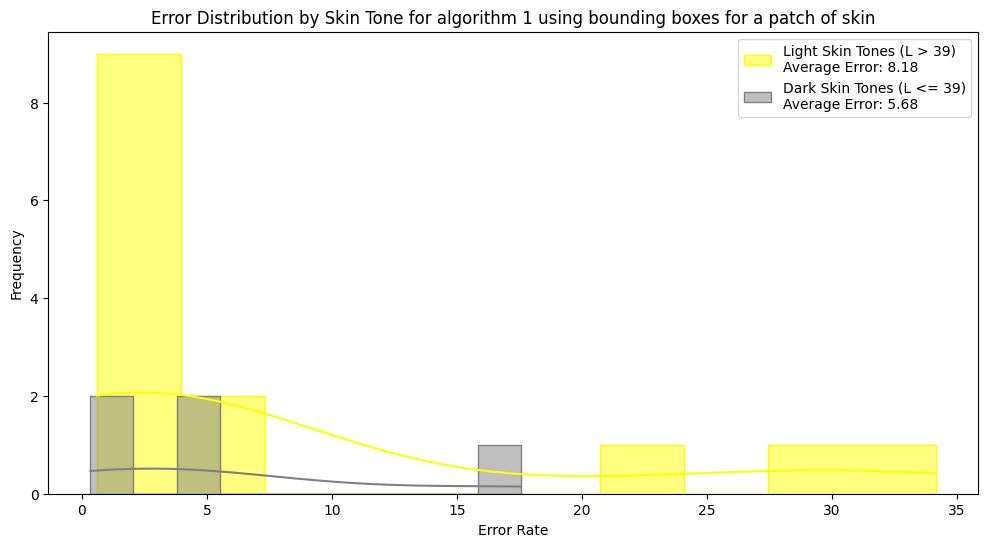

In [ ]:
# Data setup
skin_results = [
    (70.98039215686275, 1.4597385807117484),
    (55.68627450980392, 1.3725540198137445),
    (16.470588235294116, 4.7470998766041745),
    (42.745098039215684, 0.6066269166416458),
    (36.86274509803921, 0.3395975966760383),
    (16.470588235294116, 17.561012129368603),
    (63.13725490196078, 2.3748955345547733),
    (46.666666666666664, 6.128401197576987),
    (63.13725490196078, 2.969084933025561),
    (36.470588235294116, 4.353567311517278),
    (42.745098039215684, 5.131923838049391),
    (42.35294117647059, 30.378399060605403),
    (42.35294117647059, 34.15401757085311),
    (69.01960784313725, 1.4427993290692689),
    (42.745098039215684, 2.4835637211934634),
    (65.09803921568627, 0.8285837859410082),
    (42.745098039215684, 23.317847823201628),
    (31.372549019607842, 1.3983231413514163),
    (69.01960784313725, 1.878958526470058)
]

# Initialize lists to hold error rates for each category
light_errors = []
dark_errors = []

# Define a threshold to categorize light and dark skin tones
threshold = 39 # Adjust this threshold based on your needs

# Process each entry in match_results
for l_value, error_rate in skin_results:
    # Classify based on the L value and collect corresponding errors
    if l_value > threshold:
        light_errors.append(error_rate)
    else:
        dark_errors.append(error_rate)

# Calculate average errors for each skin tone category
average_light_errors = sum(light_errors) / len(light_errors) if light_errors else 0
average_dark_errors = sum(dark_errors) / len(dark_errors) if dark_errors else 0
plt.figure(figsize=(12, 6))
sns.histplot(light_errors, color='yellow', kde=True, label=f'Light Skin Tones (L > 39)\nAverage Error: {average_light_errors:.2f}', bins=10, element="step")
sns.histplot(dark_errors, color='gray', kde=True, label=f'Dark Skin Tones (L <= 39)\nAverage Error: {average_dark_errors:.2f}', bins=10, element="step")
plt.title('Error Distribution by Skin Tone for algorithm 1 using bounding boxes for a patch of skin')
plt.xlabel('Error Rate')
plt.ylabel('Frequency')
plt.legend()
plt.show()

<ipython-input-19-9213e3d49077>:49: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


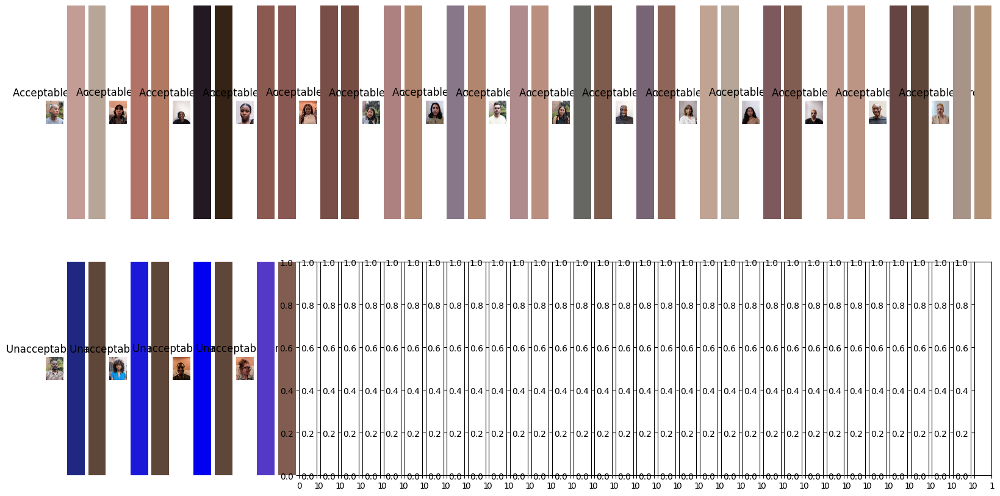

In [ ]:
error_threshold = 12


def hex_to_rgb(hex_color):
    """Convert HEX color to an RGB tuple."""
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

acceptable_results = [result for result in match_results if result[3] <= error_threshold]
unacceptable_results = [result for result in match_results if result[3] > error_threshold]


cols = 3
max_rows = max(len(acceptable_results), len(unacceptable_results))
fig, axs = plt.subplots(2, max_rows * cols, figsize=(20, 10))
def plot_color_patch(ax, hex_color):
    """Plot a color patch based on HEX color."""
    rgb_color = hex_to_rgb(hex_color)
    ax.add_patch(patches.Rectangle((0, 0), 1, 1, color=np.array(rgb_color)/255))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')


def plot_result(ax, result, title):
    img_filename = "detected_" + result[0]
    img_path = os.path.join(image_folder, img_filename)
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    else:
        ax.set_title("Image not found")
        ax.axis('off')


for i, result in enumerate(acceptable_results):
    plot_result(axs[0, i * cols + 0], result, "Acceptable Error")
    plot_color_patch(axs[0, i * cols + 1], result[1])
    plot_color_patch(axs[0, i * cols + 2], result[2])

for i, result in enumerate(unacceptable_results):
    plot_result(axs[1, i * cols + 0], result, "Unacceptable Error")
    plot_color_patch(axs[1, i * cols + 1], result[1])
    plot_color_patch(axs[1, i * cols + 2], result[2])

plt.tight_layout()
plt.show()

Algorithm 2: CV based skin color detection using dlib face point landmark detection

This algorithm is an imrovement to Algorithm1 where we are creating a segment mask of the skin region on the face exclusing areas of the eyes, eyebrows, lips and hair using the 68 face landmark shape dectector such that we get a better area of the entire skin on the face thus being a better way to average skin tone of individual instead of using a patch on the check of the individual

In [ ]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

# Load the predictor and detector
predictor_path = '/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/shape_predictor_68_face_landmarks.dat'
predictor = dlib.shape_predictor(predictor_path)
detector = dlib.get_frontal_face_detector()

def process_image(source_image_path):
    # Read the image
    image = cv2.imread(source_image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = detector(gray)

    for face in faces:
        landmarks = predictor(gray, face)

        # Define the full outline of the face including the forehead
        outline_points = []
        for n in range(0, 17):  # Jawline
            outline_points.append((landmarks.part(n).x, landmarks.part(n).y))
        for n in range(26, 16, -1):  # Upper part of the face, reverse order
            outline_points.append((landmarks.part(n).x, landmarks.part(n).y))

        outline_points = np.array(outline_points, dtype=np.int32)
        mask = np.zeros_like(gray)  # Create a black mask

        # Fill the mask with white where the face outline is
        cv2.fillPoly(mask, [outline_points], 255)

        # Exclude the eyes and mouth from the mask
        eyes_array = np.concatenate([[(landmarks.part(n).x, landmarks.part(n).y) for n in range(36, 42)],  # Left eye
                                     [(landmarks.part(n).x, landmarks.part(n).y) for n in range(42, 48)]])  # Right eye
        lips_array = [(landmarks.part(n).x, landmarks.part(n).y) for n in range(48, 68)]  # Lips

        cv2.fillPoly(mask, [np.array(eyes_array, dtype=np.int32)], 0)
        cv2.fillPoly(mask, [np.array(lips_array, dtype=np.int32)], 0)

        # Apply the mask to the image
        segmented_face = cv2.bitwise_and(image, image, mask=mask)

        # Show the segmented face
        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(cv2.cvtColor(segmented_face, cv2.COLOR_BGR2RGB))
        plt.show()

        return segmented_face


#segmented_face = process_image('/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/mst-e_data/subject_0/PXL_20220922_132845778.PORTRAIT.jpg')


Processing Copy of PXL_20220922_134346135.PORTRAIT.jpg...


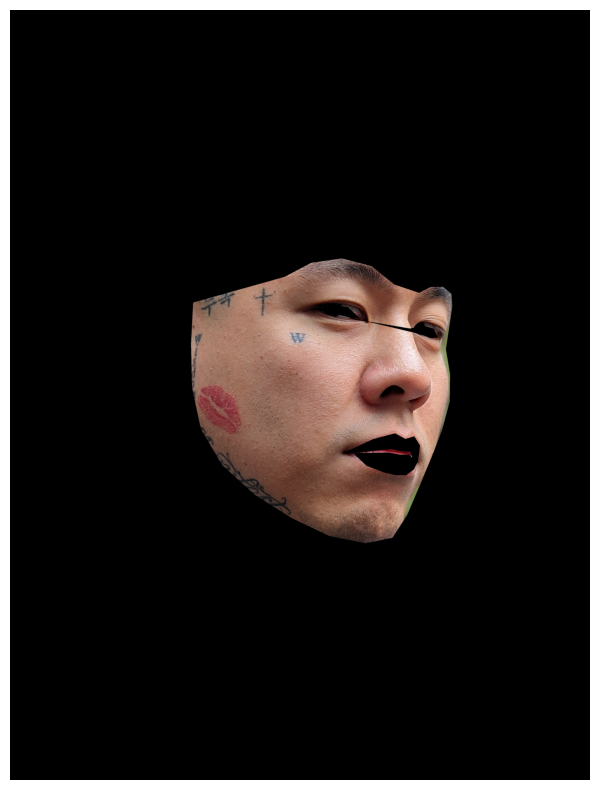

Processing Copy of PXL_20220922_174521457.jpg...


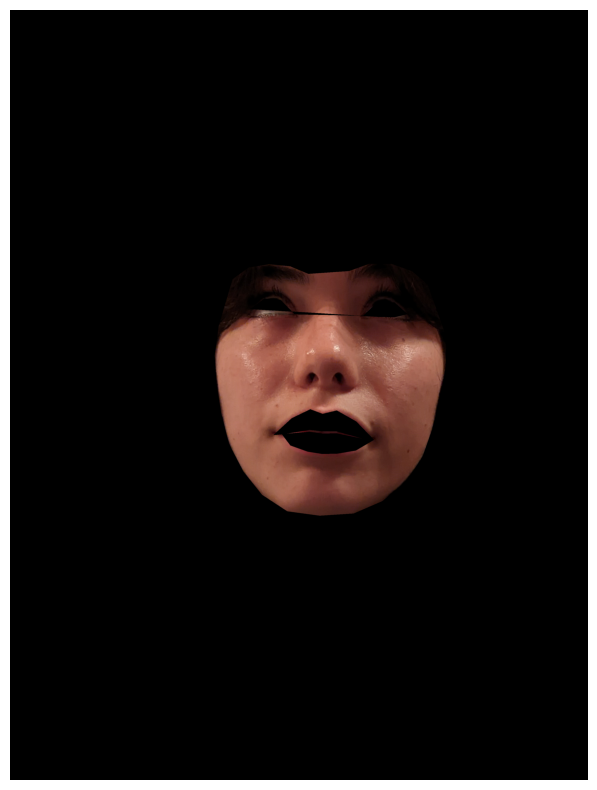

Processing Copy of PXL_20220922_173459363.jpg...


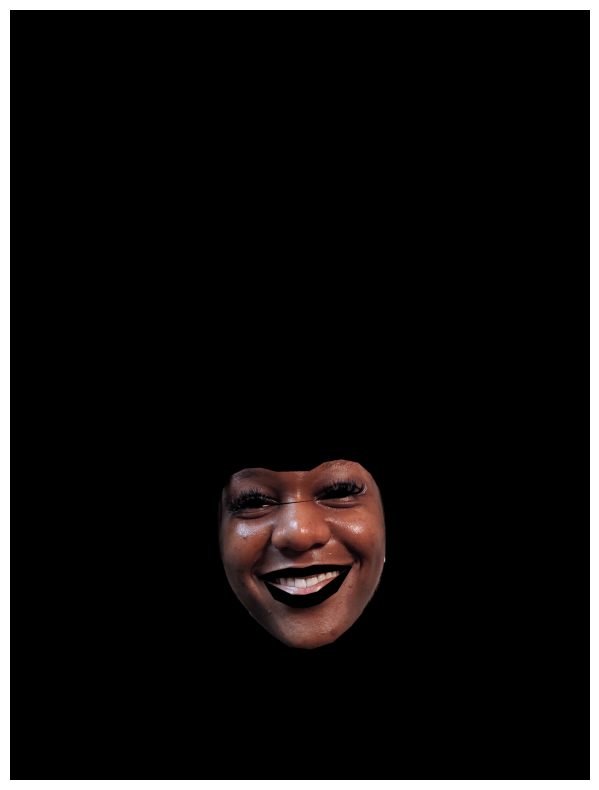

Processing Copy of PXL_20220922_193521063.jpg...


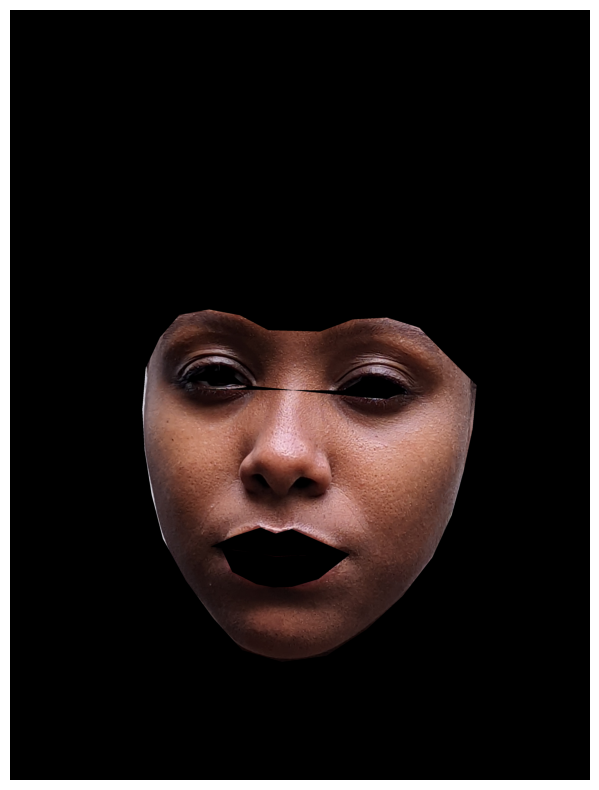

Processing Copy of PXL_20220922_162359800.jpg...


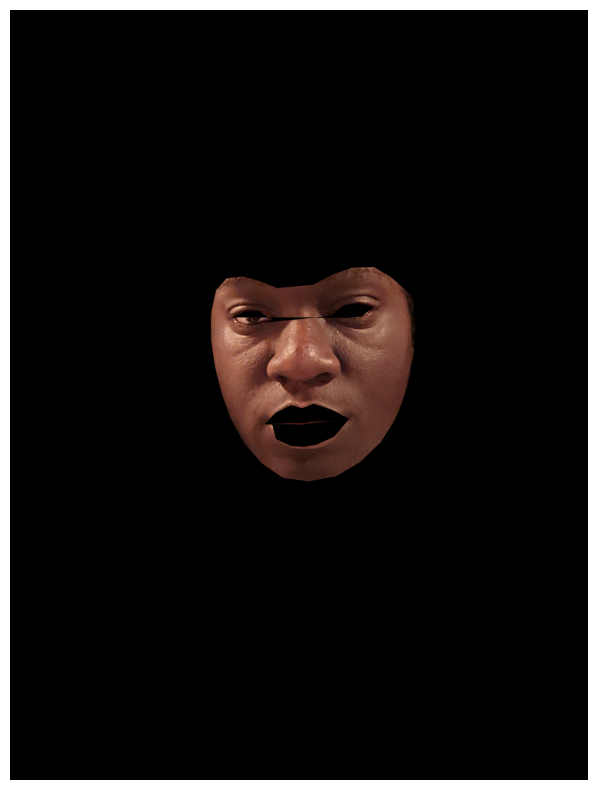

Processing Copy of PXL_20220922_143230097.jpg...


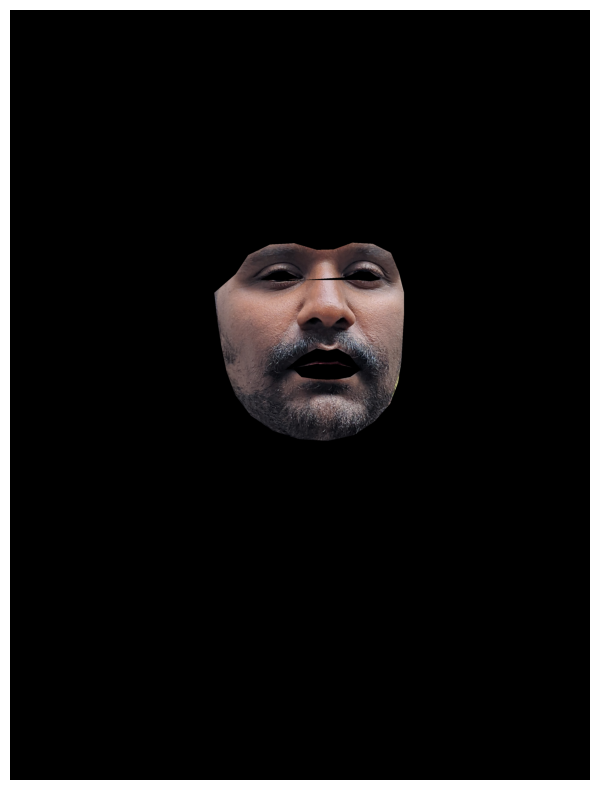

Processing Copy of PXL_20220922_142254164.PORTRAIT.jpg...


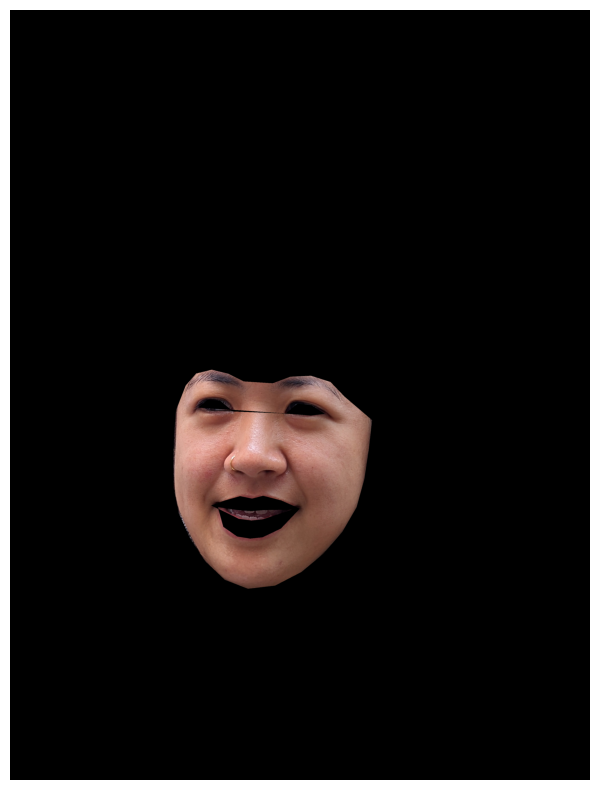

Processing Copy of PXL_20220922_200610155.jpg...


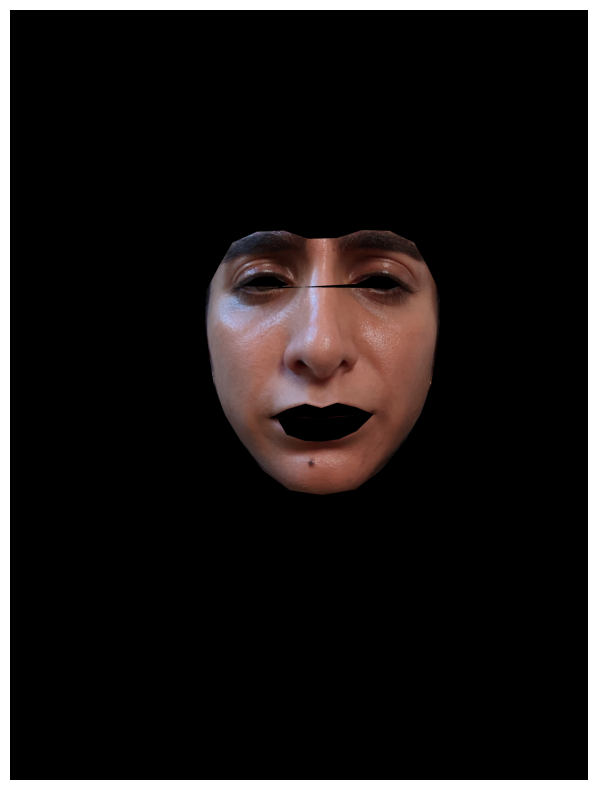

Processing Copy of PXL_20220922_144614653.PORTRAIT.jpg...


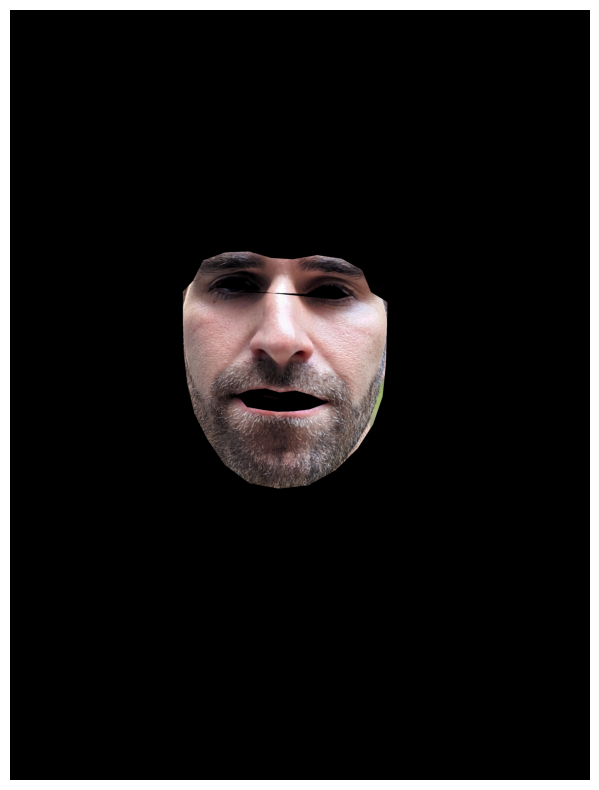

Processing Copy of PXL_20220922_140335749.PORTRAIT.jpg...


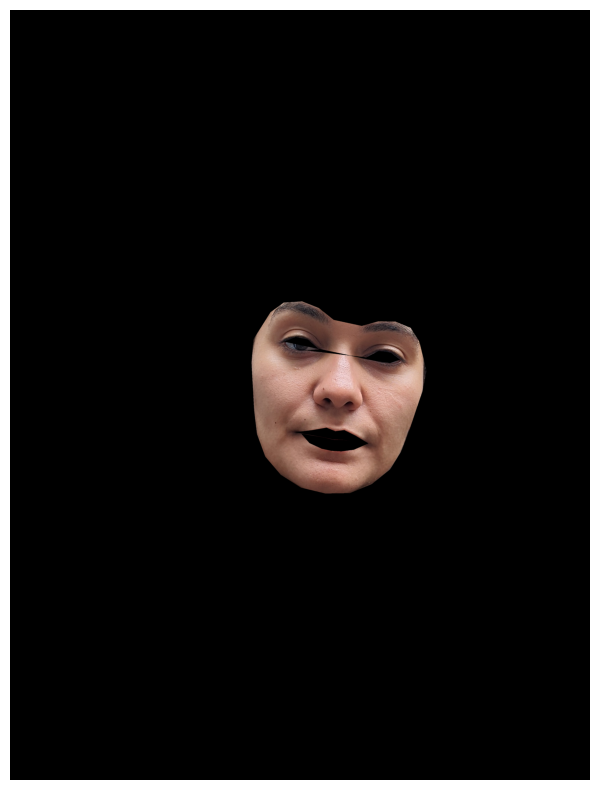

Processing Copy of PXL_20220922_195435930.jpg...


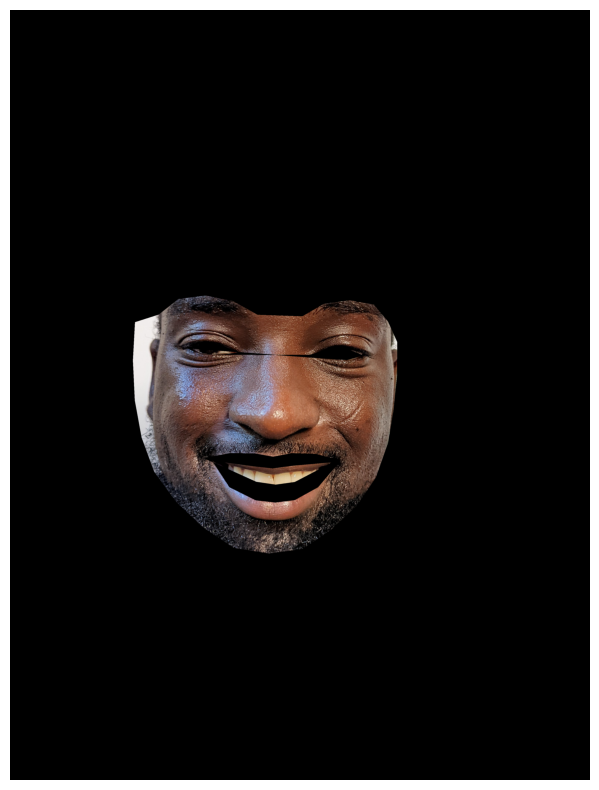

Processing Copy of PXL_20220922_194833505.jpg...


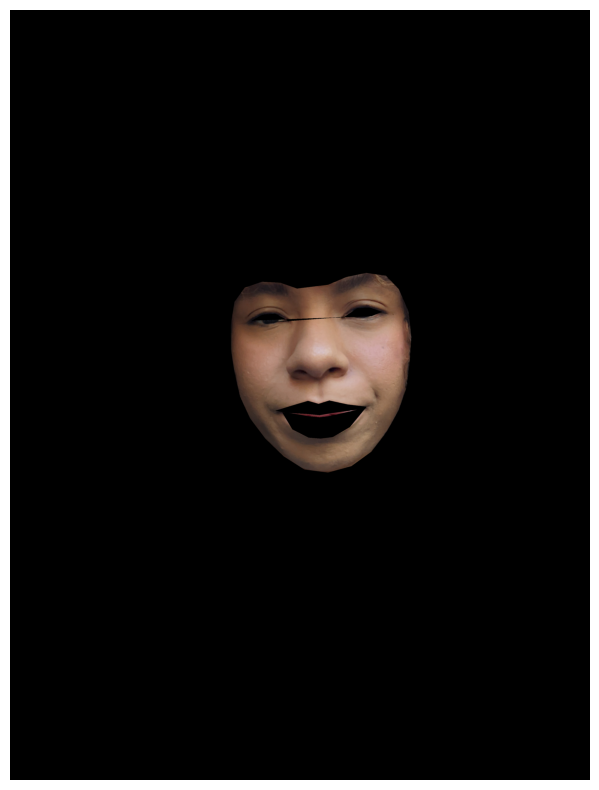

Processing Copy of PXL_20220922_175928064.jpg...


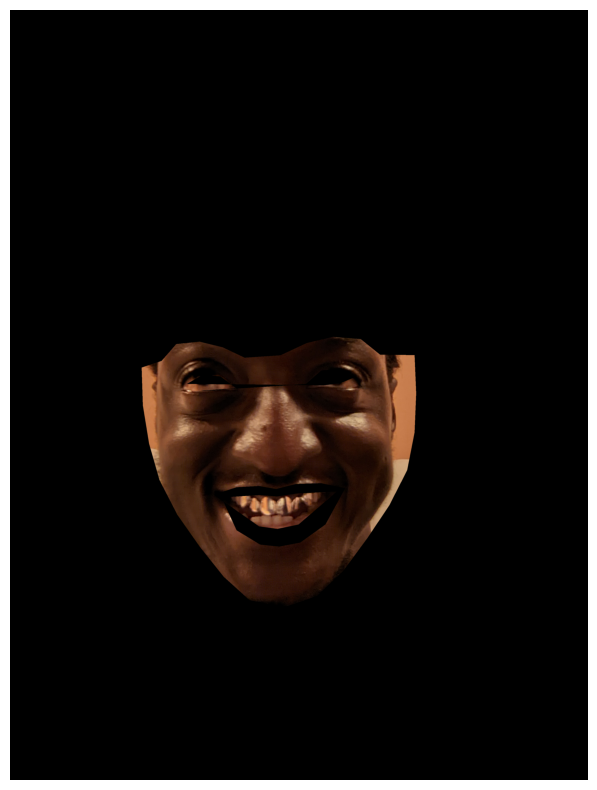

Processing Copy of PXL_20220922_140951373.jpg...


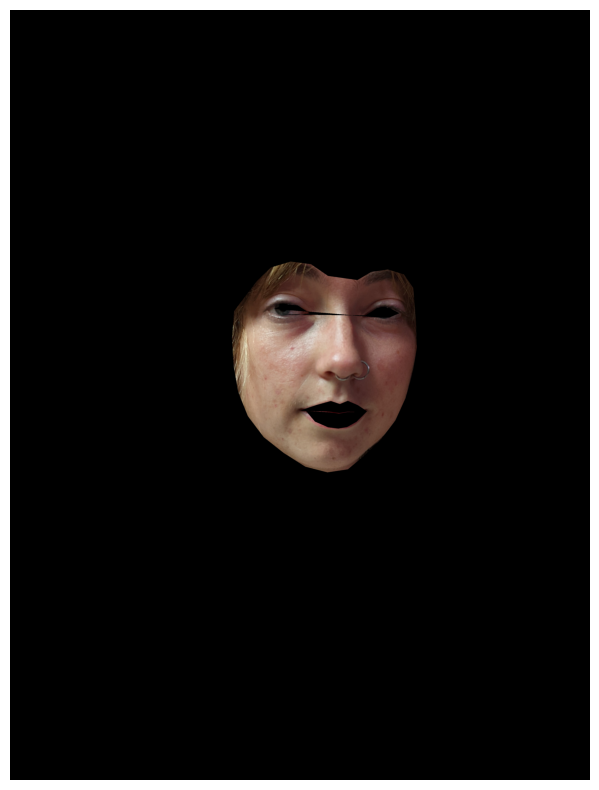

Processing Copy of PXL_20220922_160944429.jpg...


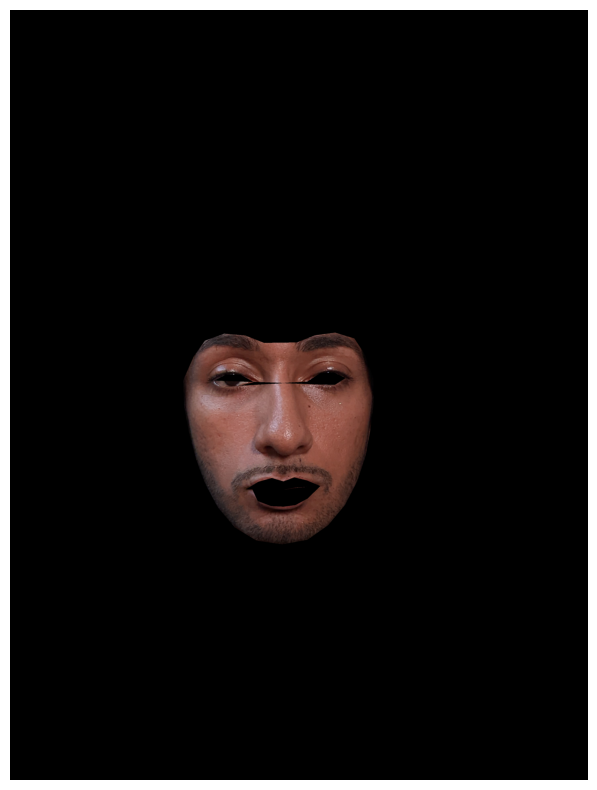

Processing Copy of PXL_20220922_131732383.jpg...


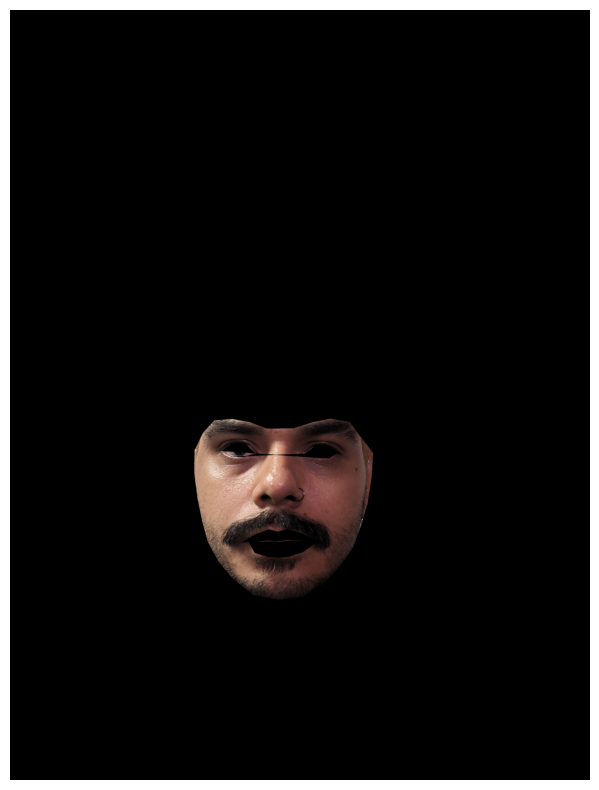

Processing Copy of PXL_20220922_163218116.jpg...


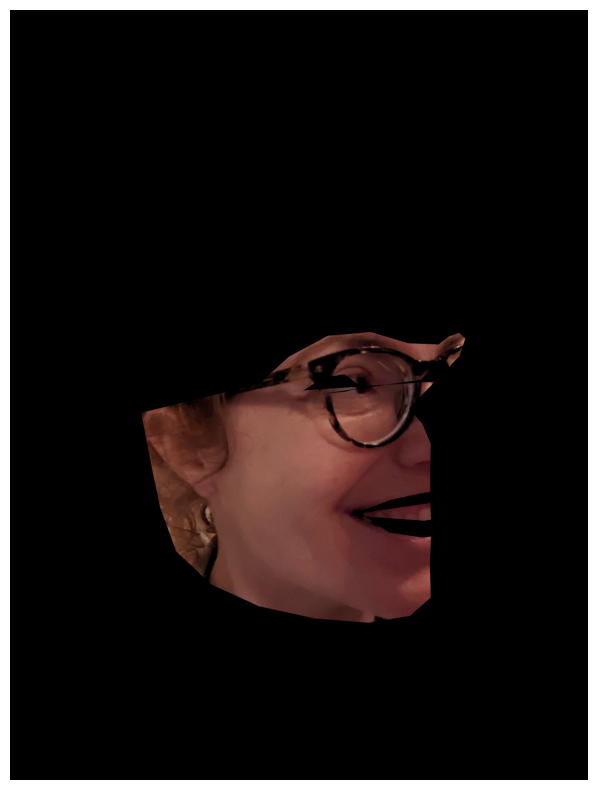

Processing Copy of PXL_20220922_185659098.jpg...


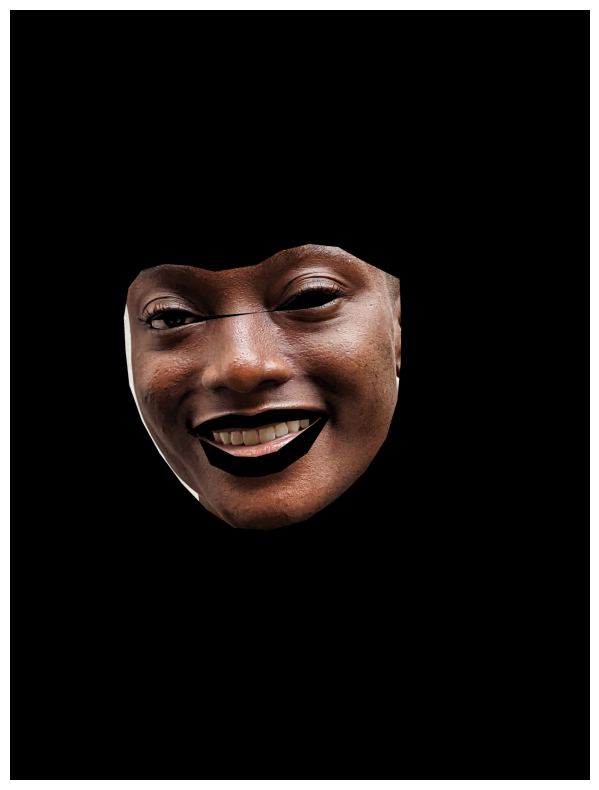

Processing Copy of PXL_20220922_183609632.PORTRAIT.jpg...


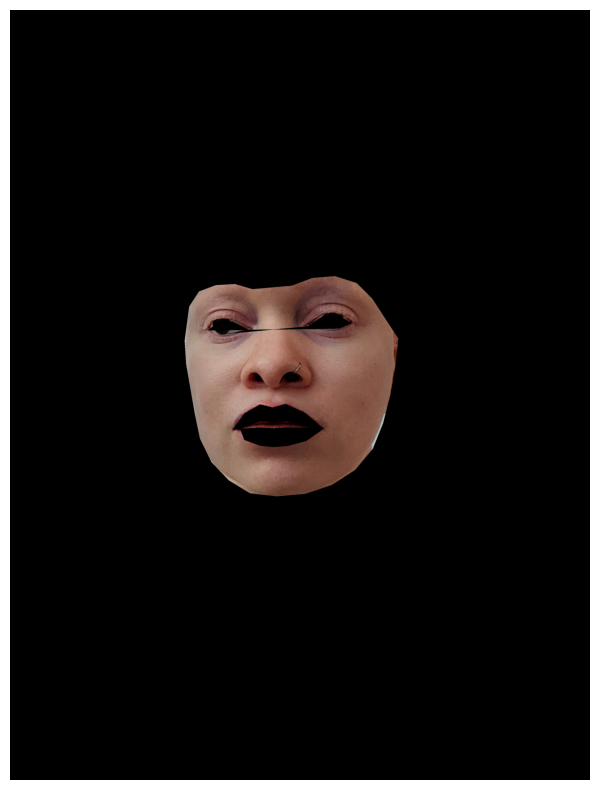

In [ ]:

def process_directory(directory_path):

    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for filename in image_files:
        file_path = os.path.join(directory_path, filename)
        print(f"Processing {filename}...")
        try:
            segmented_face = process_image(file_path)

        except Exception as e:
            print(f"An error occurred while processing {filename}: {e}")


process_directory('/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/shadematch')

In [ ]:
import cv2
import numpy as np
import os
import colorsys
import matplotlib.patches as patches
from scipy.spatial.distance import euclidean


def rgb_to_hex(rgb_color):
    return "#{:02x}{:02x}{:02x}".format(int(rgb_color[0]), int(rgb_color[1]), int(rgb_color[2]))

def rgb_to_lab_correctly(rgb_color):
    # Convert RGB to BGR since OpenCV expects BGR format
    bgr_color = np.array(rgb_color[::-1]).reshape(1, 1, 3).astype(np.uint8)
    # Convert BGR to LAB
    lab_color = cv2.cvtColor(bgr_color, cv2.COLOR_BGR2Lab)[0][0]
    # Convert L* from 0-255 to 0-100 range, and adjust a* and b* from 0-255 to -128 to 127 range
    L = lab_color[0] * (100.0 / 255.0)
    a = lab_color[1] - 128
    b = lab_color[2] - 128
    return (L, a, b)

def adjust_rgb_values(rgb):
    return tuple(int(val * 255) for val in rgb)

import cv2
import numpy as np
from scipy.spatial.distance import cdist

def hex_to_lab(hex_color):

    h = hex_color.strip('#')
    rgb = tuple(int(h[i:i+2], 16) for i in (0, 2, 4))

    bgr_color = np.array([[rgb[::-1]]], dtype=np.uint8)  # RGB to BGR
    lab_color = cv2.cvtColor(bgr_color, cv2.COLOR_BGR2Lab)[0][0]
    L = lab_color[0] * (100.0 / 255.0)
    a = lab_color[1] - 128
    b = lab_color[2] - 128
    return (L, a, b)

shades_df['LAB'] = shades_df['hex'].apply(hex_to_lab)

def find_closest_shade(shade_lab, shades_df):

    shades_lab = np.array(shades_df['LAB'].tolist())

    distances = cdist([shade_lab], shades_lab, metric='euclidean')


    closest_index = np.argmin(distances)
    closest_shade = shades_df.iloc[closest_index]

    return closest_shade


def lab_to_rgb(lab_color):
    """Convert LAB color to RGB for display purposes."""
    lab = np.array([[[lab_color[0] * 255 / 100, lab_color[1] + 128, lab_color[2] + 128]]], dtype=np.uint8)
    rgb = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)
    return rgb[0][0]

def find_average_skin_tone_on_mask(segmented_face, shades_df):

    face_rgb = cv2.cvtColor(segmented_face, cv2.COLOR_BGR2RGB)


    mask = np.all(face_rgb == [0, 0, 0], axis=-1)
    non_masked_pixels = face_rgb[~mask]

    if non_masked_pixels.size == 0:

        return None, None

    average_color = np.mean(non_masked_pixels, axis=0).astype(np.uint8)
    hex_color = rgb_to_hex(average_color)
    lab_color = rgb_to_lab_correctly(average_color)

    closest_shade = find_closest_shade(lab_color, shades_df)
    error_distance = euclidean(lab_color, closest_shade['LAB'])

    print(f"The closest shade in LAB is: {closest_shade}, Error Rate of shade match : {error_distance}")



    plt.figure(figsize=(10, 4))


    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.title(f'RGB: {average_color}')
    plt.imshow(face_rgb)


    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.title(f'HEX: {hex_color}')
    hex_patch = patches.Rectangle((0, 0), 1, 1, color=hex_color)
    plt.gca().add_patch(hex_patch)
    plt.gca().set_xlim([0, 1])
    plt.gca().set_ylim([0, 1])

    rgb_closest_shade = lab_to_rgb(closest_shade['LAB'])
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.title(f'Closest Shade RGB: {rgb_closest_shade}')
    shade_patch = patches.Rectangle((0, 0), 1, 1, color=rgb_closest_shade / 255)  # Normalize RGB
    plt.gca().add_patch(shade_patch)
    plt.gca().set_xlim([0, 1])
    plt.gca().set_ylim([0, 1])

    plt.show()

    return hex_color, lab_color, closest_shade, error_distance


Processing Copy of PXL_20220922_134346135.PORTRAIT.jpg...


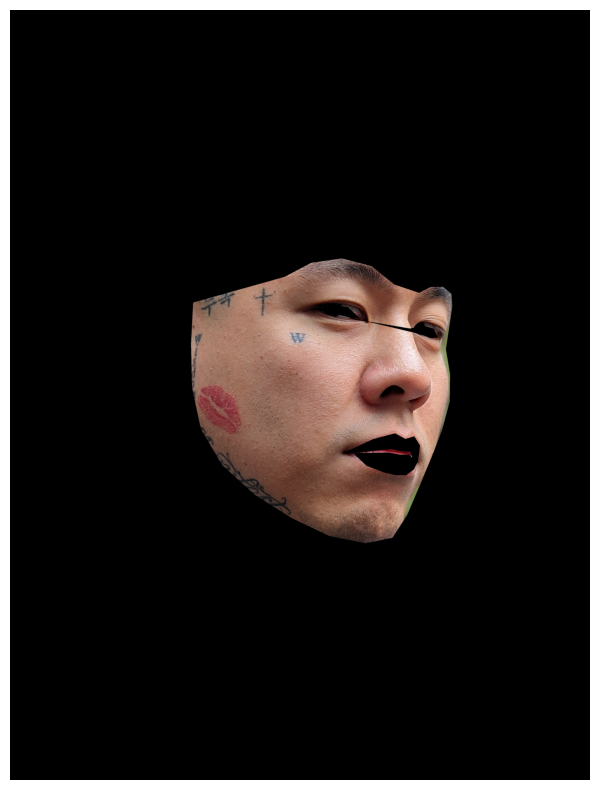

The closest shade in LAB is: brand                              Elsas Pro
brand_short                               ep
product                        Full Coverage
product_short                            fcf
hex                                   906656
H                                       17.0
S                                        0.4
V                                       0.56
L                                         47
group                                      5
LAB              (47.05882352941176, 15, 16)
Name: 481, dtype: object, Error Rate of shade match : 4.047060723513766


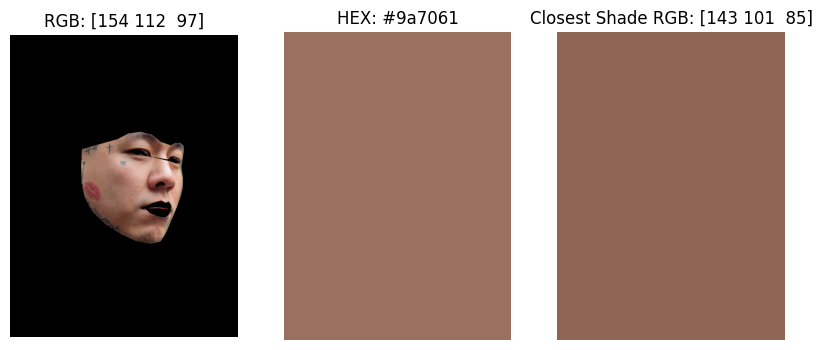

An error occurred while processing Copy of PXL_20220922_134346135.PORTRAIT.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_174521457.jpg...


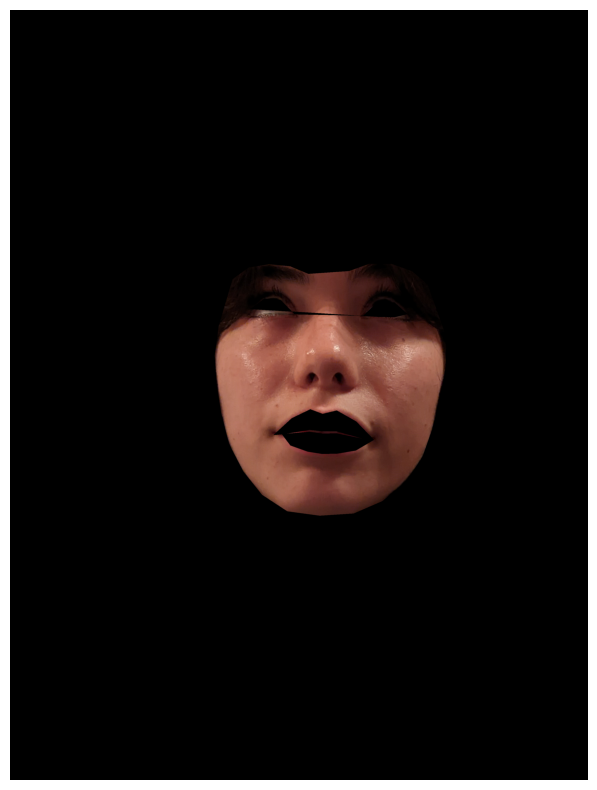

The closest shade in LAB is: brand                        Make Up For Ever
brand_short                                mu
product                              Ultra HD
product_short                             uhd
hex                                    784a42
H                                         9.0
S                                        0.45
V                                        0.47
L                                          37
group                                       1
LAB              (36.470588235294116, 18, 13)
Name: 441, dtype: object, Error Rate of shade match : 5.015355122521044


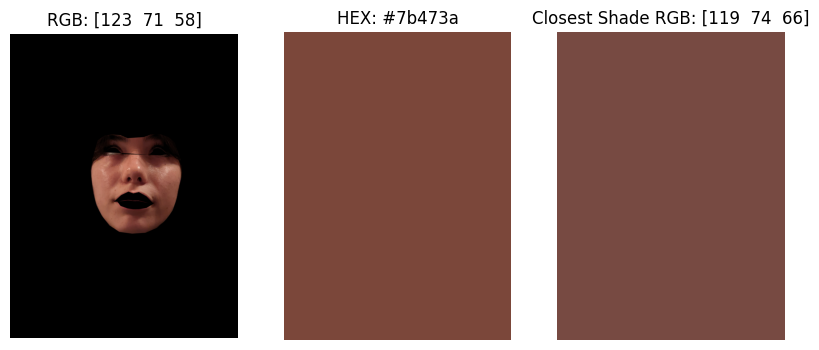

An error occurred while processing Copy of PXL_20220922_174521457.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_173459363.jpg...


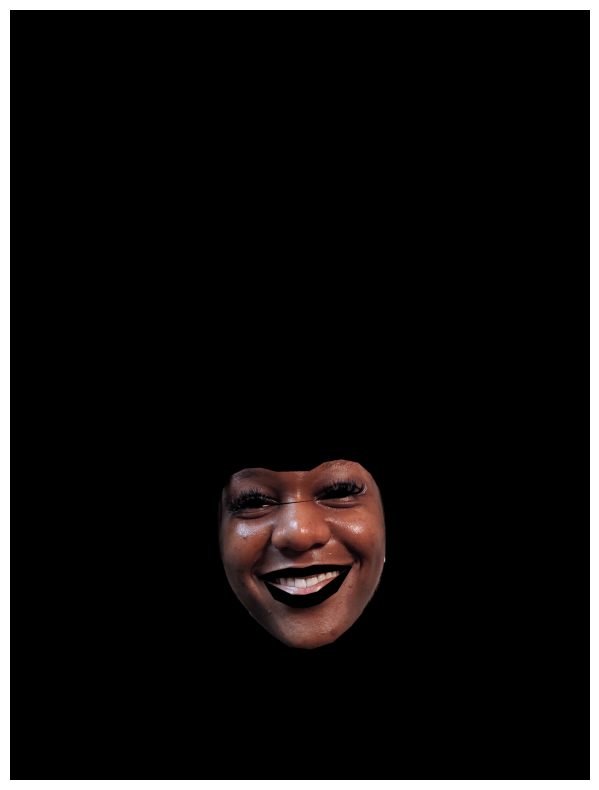

The closest shade in LAB is: brand                        Make Up For Ever
brand_short                                mu
product                              Ultra HD
product_short                             uhd
hex                                    644136
H                                        14.0
S                                        0.46
V                                        0.39
L                                          31
group                                       1
LAB              (31.372549019607842, 14, 13)
Name: 443, dtype: object, Error Rate of shade match : 3.626814994592098


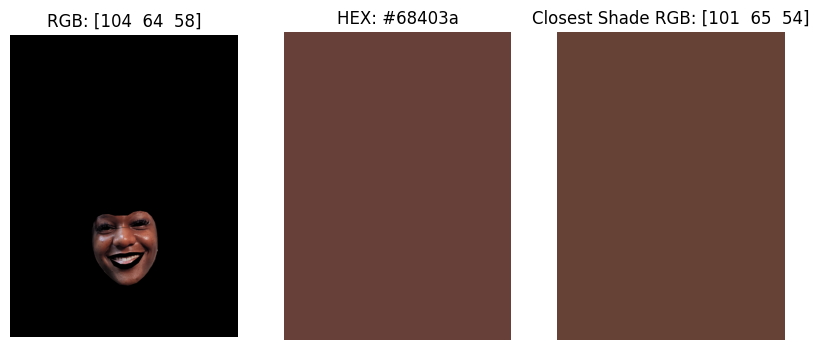

An error occurred while processing Copy of PXL_20220922_173459363.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_193521063.jpg...


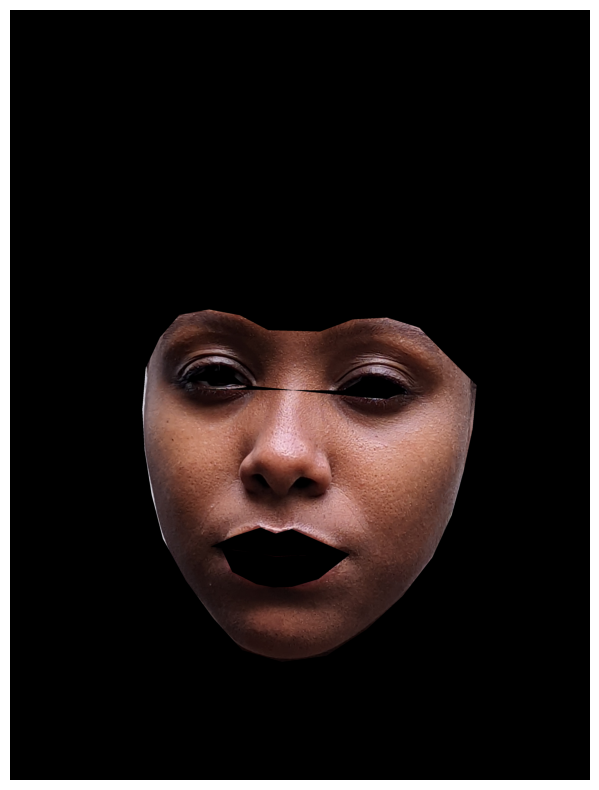

The closest shade in LAB is: brand                              Elsas Pro
brand_short                               ep
product                        Full Coverage
product_short                            fcf
hex                                   734b41
H                                       12.0
S                                       0.43
V                                       0.45
L                                         36
group                                      5
LAB              (36.07843137254902, 16, 13)
Name: 483, dtype: object, Error Rate of shade match : 2.5417694781331464


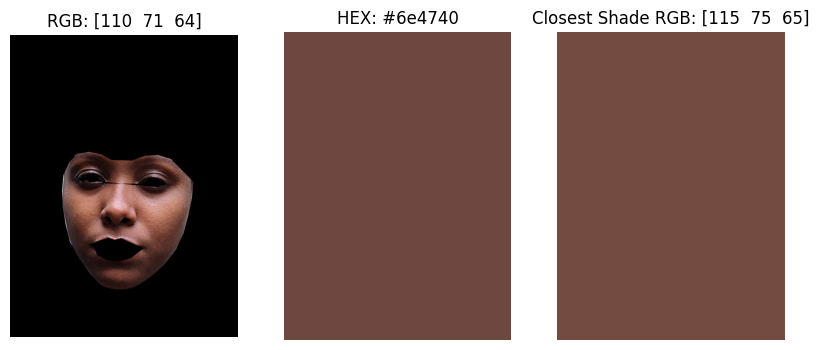

An error occurred while processing Copy of PXL_20220922_193521063.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_162359800.jpg...


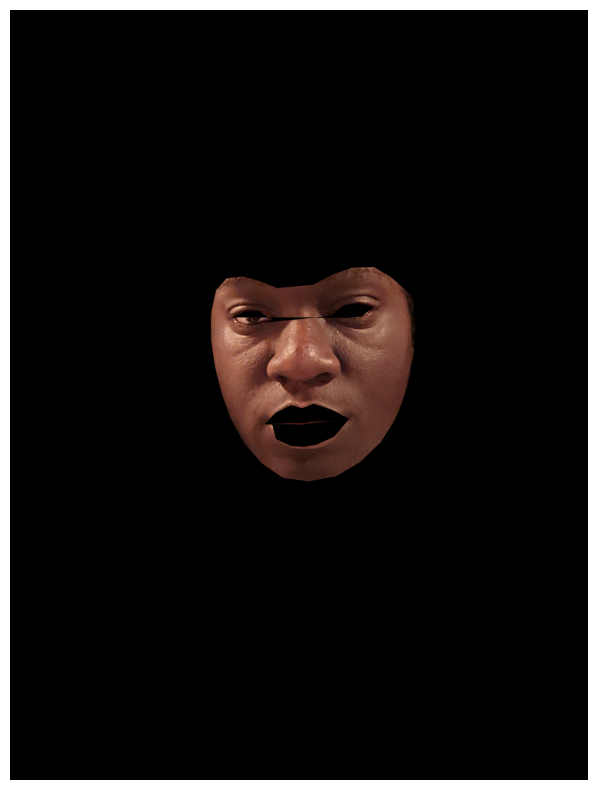

The closest shade in LAB is: brand                             Black Opal
brand_short                               bo
product                           True Color
product_short                             tc
hex                                   71412d
H                                       18.0
S                                        0.6
V                                       0.44
L                                         33
group                                      3
LAB              (32.94117647058823, 19, 21)
Name: 269, dtype: object, Error Rate of shade match : 4.0


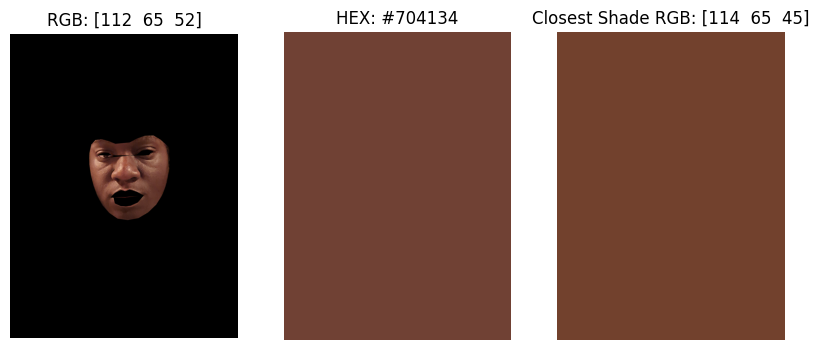

An error occurred while processing Copy of PXL_20220922_162359800.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_143230097.jpg...


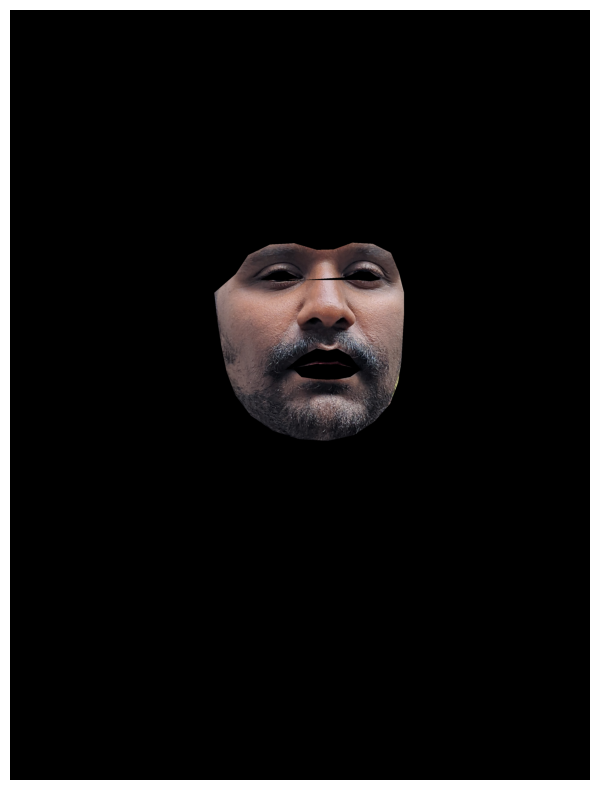

The closest shade in LAB is: brand                             Maybelline
brand_short                               mb
product                               Fit Me
product_short                            fmf
hex                                   6b5041
H                                       21.0
S                                       0.39
V                                       0.42
L                                         37
group                                      2
LAB              (36.470588235294116, 9, 13)
Name: 34, dtype: object, Error Rate of shade match : 9.131488544864014


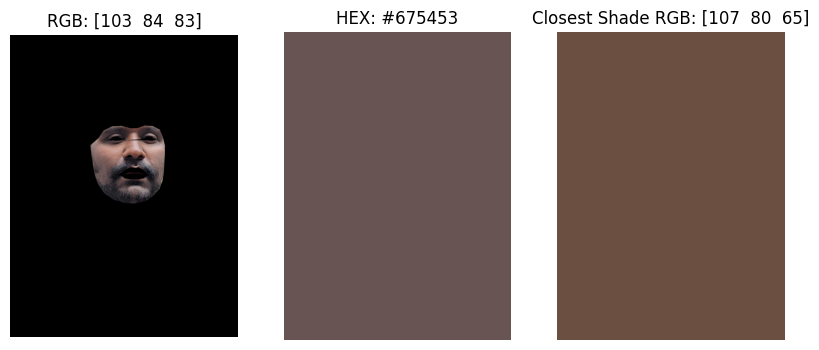

An error occurred while processing Copy of PXL_20220922_143230097.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_142254164.PORTRAIT.jpg...


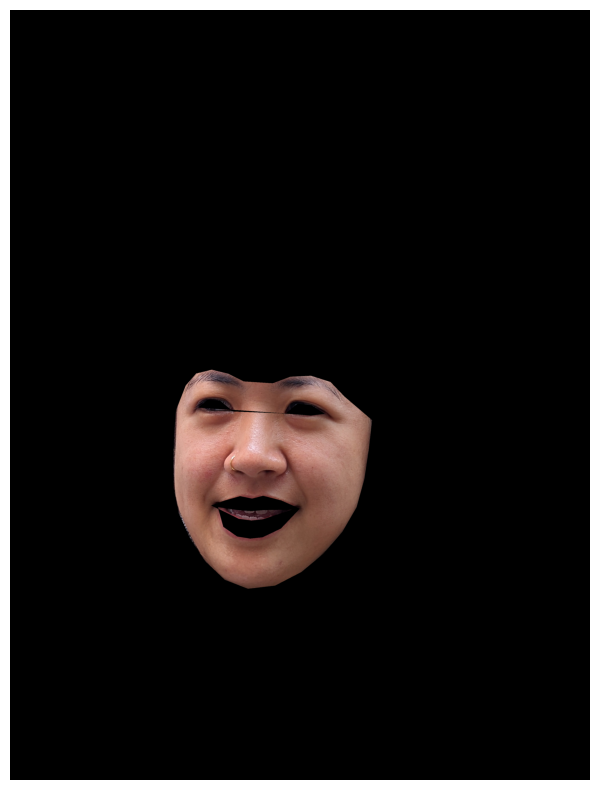

The closest shade in LAB is: brand                              Elsas Pro
brand_short                               ep
product                        Full Coverage
product_short                            fcf
hex                                   906656
H                                       17.0
S                                        0.4
V                                       0.56
L                                         47
group                                      5
LAB              (47.05882352941176, 15, 16)
Name: 481, dtype: object, Error Rate of shade match : 3.94161542770611


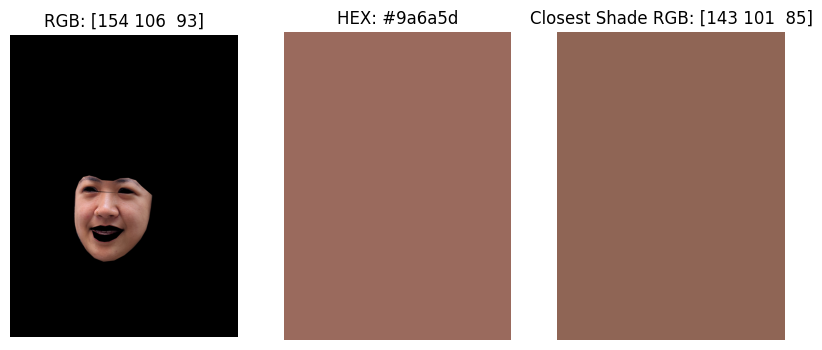

An error occurred while processing Copy of PXL_20220922_142254164.PORTRAIT.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_200610155.jpg...


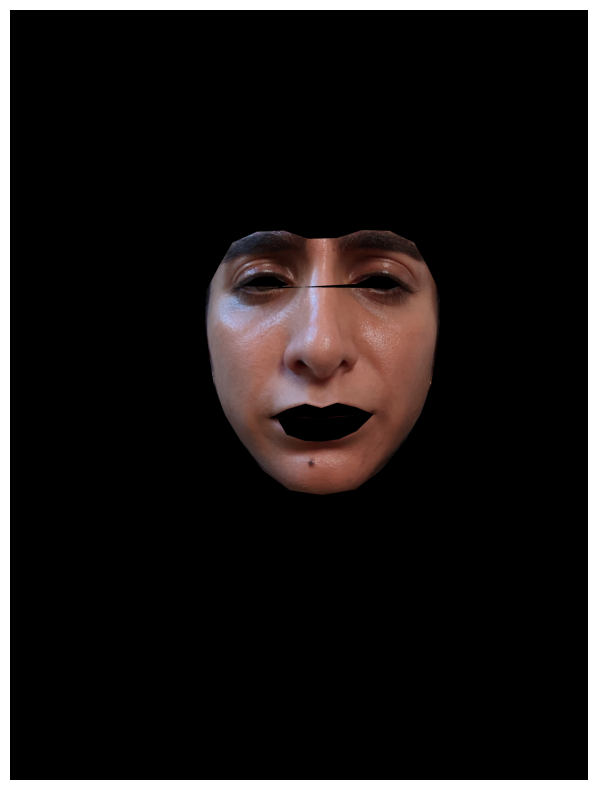

The closest shade in LAB is: brand                              Elsas Pro
brand_short                               ep
product                        Full Coverage
product_short                            fcf
hex                                   774c43
H                                       10.0
S                                       0.44
V                                       0.47
L                                         37
group                                      5
LAB              (36.86274509803921, 17, 13)
Name: 482, dtype: object, Error Rate of shade match : 4.104226495327949


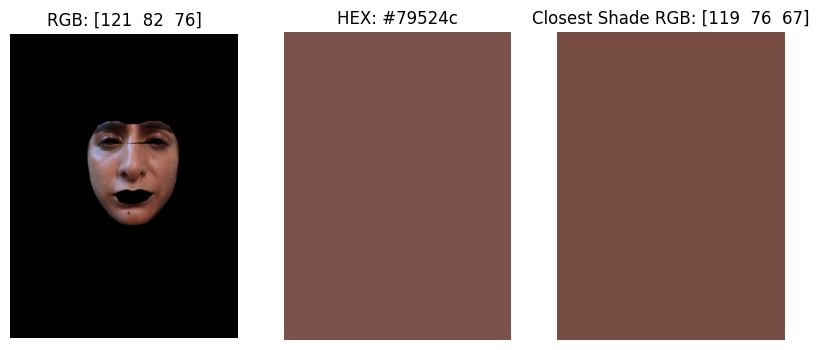

An error occurred while processing Copy of PXL_20220922_200610155.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_144614653.PORTRAIT.jpg...


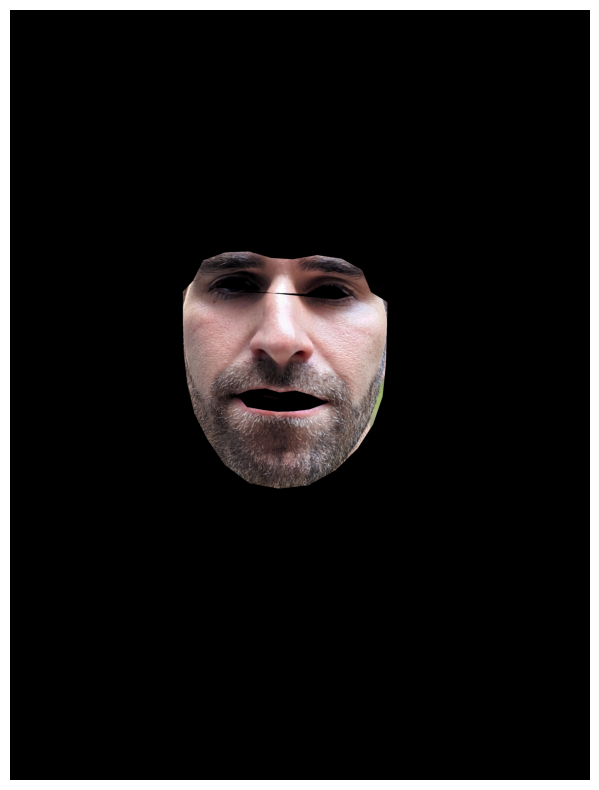

The closest shade in LAB is: brand                               Elsas Pro
brand_short                                ep
product                         Full Coverage
product_short                             fcf
hex                                    815d51
H                                        15.0
S                                        0.37
V                                        0.51
L                                          43
group                                       5
LAB              (42.745098039215684, 13, 13)
Name: 478, dtype: object, Error Rate of shade match : 11.155467020454344


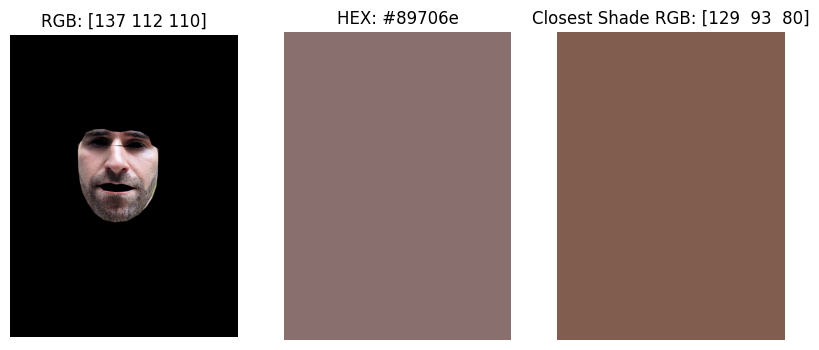

An error occurred while processing Copy of PXL_20220922_144614653.PORTRAIT.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_140335749.PORTRAIT.jpg...


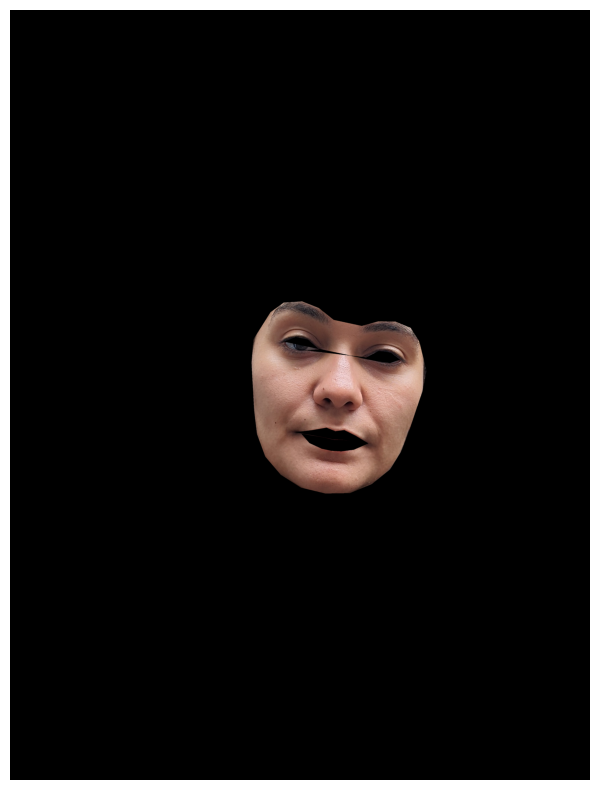

The closest shade in LAB is: brand                                  Revlon
brand_short                                rv
product                             ColorStay
product_short                              cs
hex                                    8e6558
H                                        14.0
S                                        0.38
V                                        0.56
L                                          47
group                                       2
LAB              (46.666666666666664, 15, 14)
Name: 130, dtype: object, Error Rate of shade match : 5.098039215686278


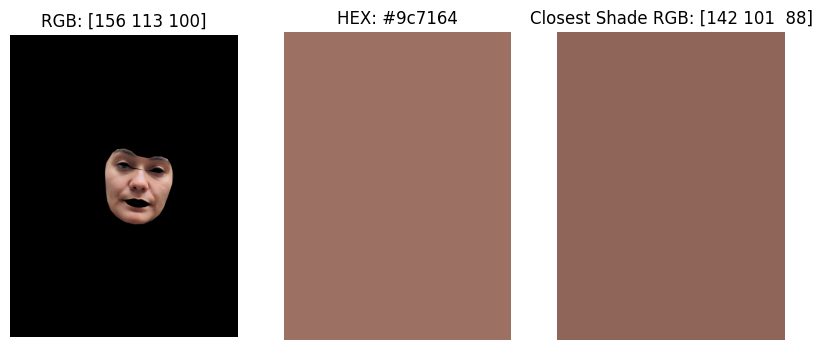

An error occurred while processing Copy of PXL_20220922_140335749.PORTRAIT.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_195435930.jpg...


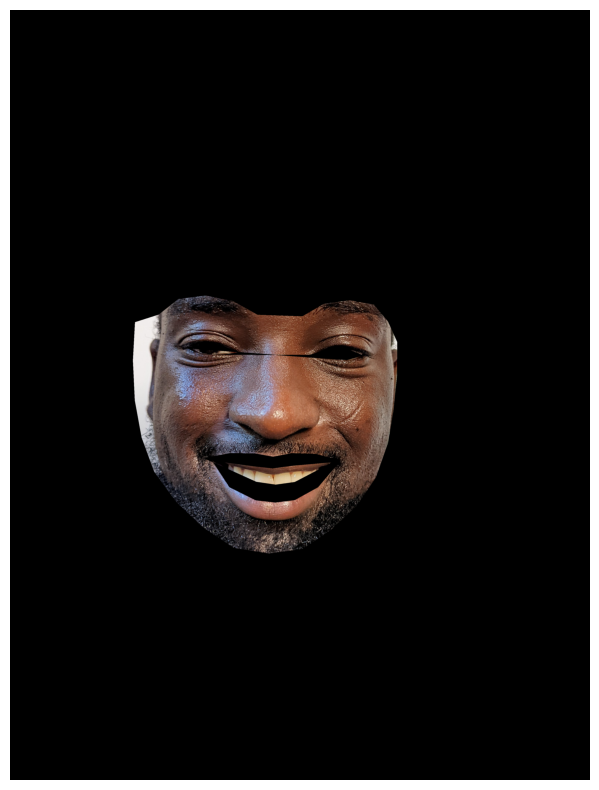

The closest shade in LAB is: brand                             Maybelline
brand_short                               mb
product                               Fit Me
product_short                            fmf
hex                                   6b5041
H                                       21.0
S                                       0.39
V                                       0.42
L                                         37
group                                      2
LAB              (36.470588235294116, 9, 13)
Name: 34, dtype: object, Error Rate of shade match : 4.95333859582664


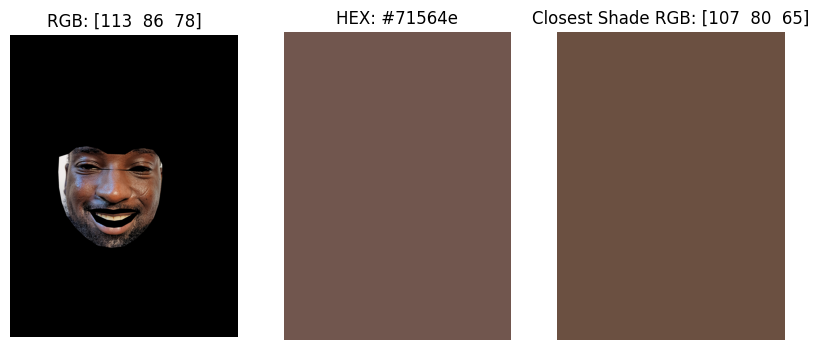

An error occurred while processing Copy of PXL_20220922_195435930.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_194833505.jpg...


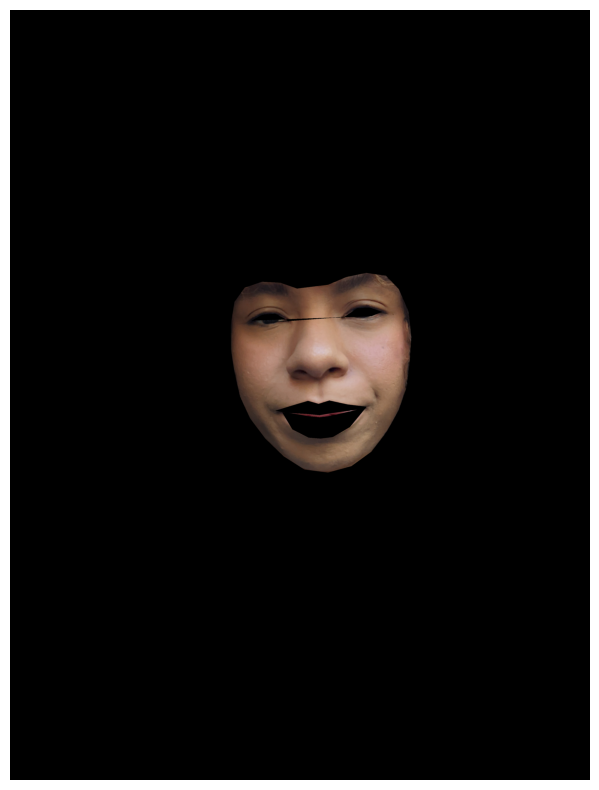

The closest shade in LAB is: brand                             Maybelline
brand_short                               mb
product                               Fit Me
product_short                            fmf
hex                                   7d5c4d
H                                       19.0
S                                       0.38
V                                       0.49
L                                         42
group                                      2
LAB              (41.96078431372549, 11, 14)
Name: 35, dtype: object, Error Rate of shade match : 3.2927751699557235


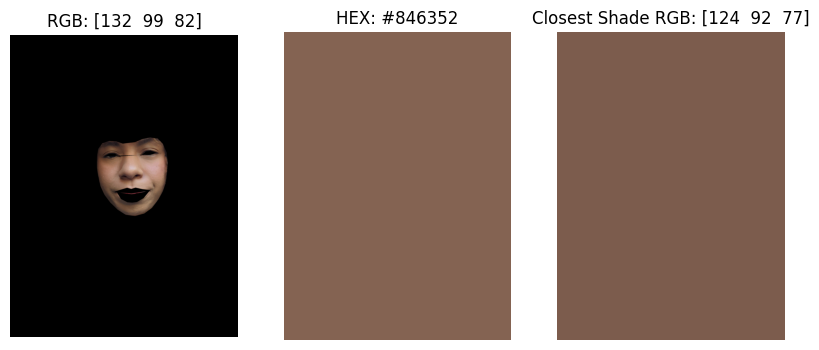

An error occurred while processing Copy of PXL_20220922_194833505.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_175928064.jpg...


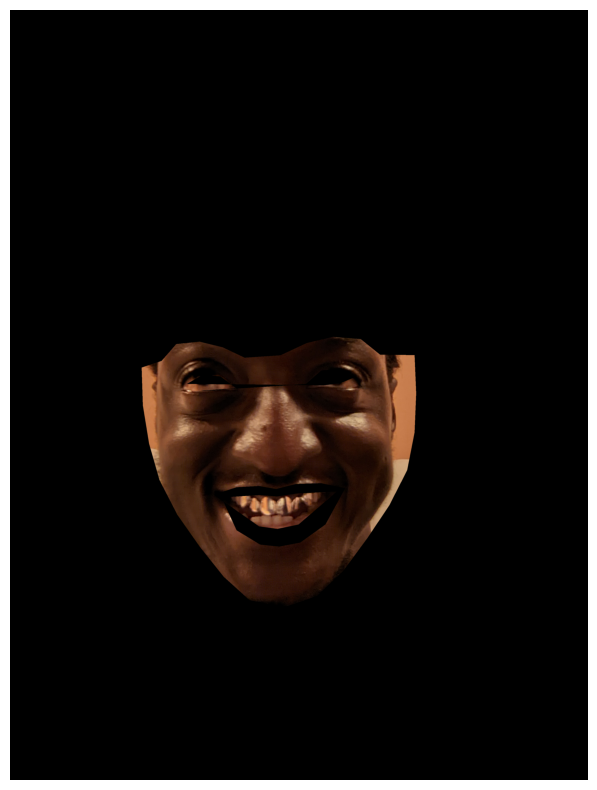

The closest shade in LAB is: brand                          Beauty Bakerie
brand_short                                bb
product                           #1 CAKE MIX
product_short                              cm
hex                                    532e1e
H                                        18.0
S                                        0.64
V                                        0.33
L                                          24
group                                       3
LAB              (23.137254901960784, 15, 18)
Name: 215, dtype: object, Error Rate of shade match : 0.7843137254901968


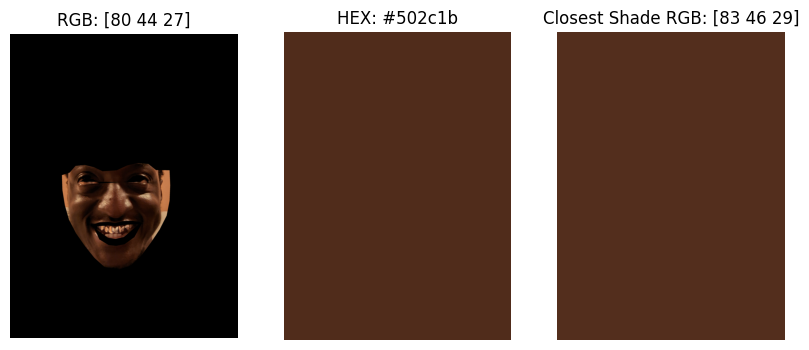

An error occurred while processing Copy of PXL_20220922_175928064.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_140951373.jpg...


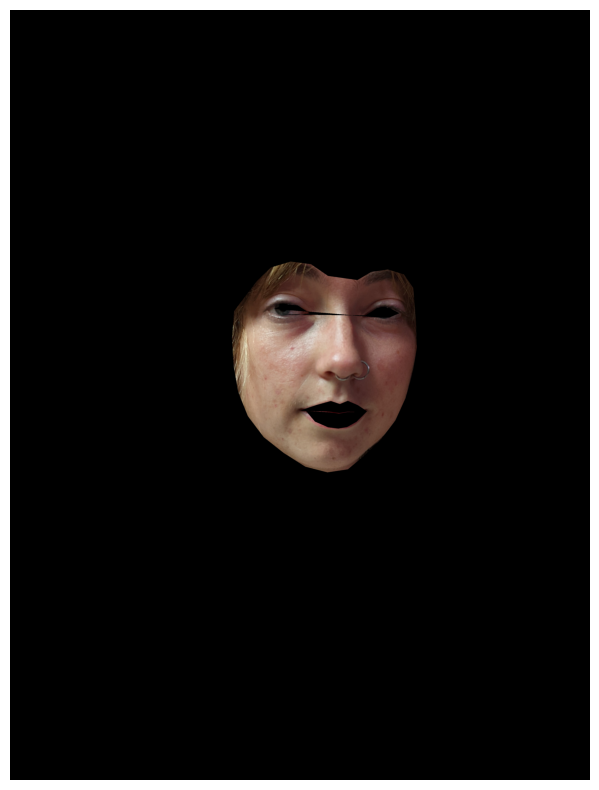

The closest shade in LAB is: brand                             Maybelline
brand_short                               mb
product                               Fit Me
product_short                            fmf
hex                                   7d5c4d
H                                       19.0
S                                       0.38
V                                       0.49
L                                         42
group                                      2
LAB              (41.96078431372549, 11, 14)
Name: 35, dtype: object, Error Rate of shade match : 1.5440476174596072


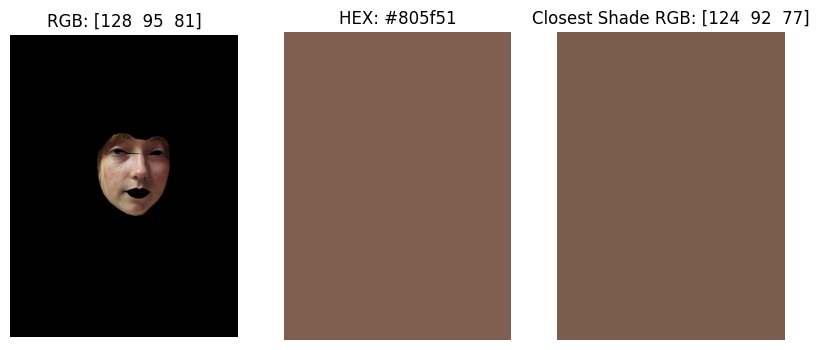

An error occurred while processing Copy of PXL_20220922_140951373.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_160944429.jpg...


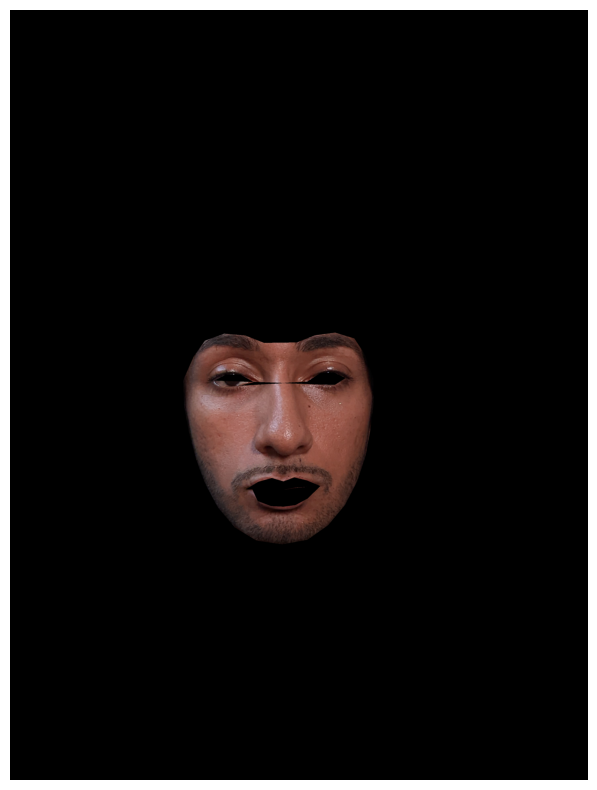

The closest shade in LAB is: brand                        Make Up For Ever
brand_short                                mu
product                              Ultra HD
product_short                             uhd
hex                                    784a42
H                                         9.0
S                                        0.45
V                                        0.47
L                                          37
group                                       1
LAB              (36.470588235294116, 18, 13)
Name: 441, dtype: object, Error Rate of shade match : 1.5686274509803937


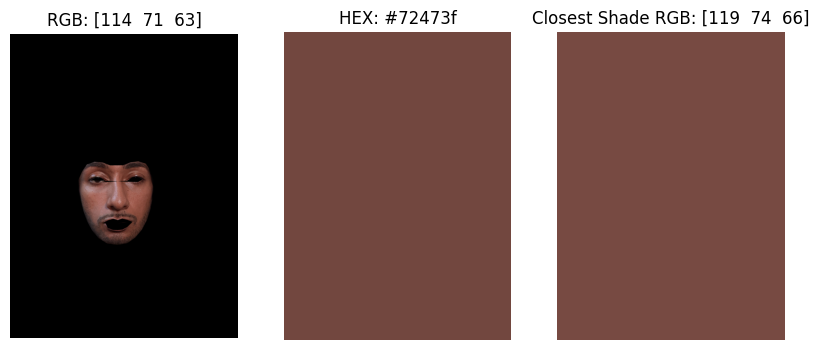

An error occurred while processing Copy of PXL_20220922_160944429.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_131732383.jpg...


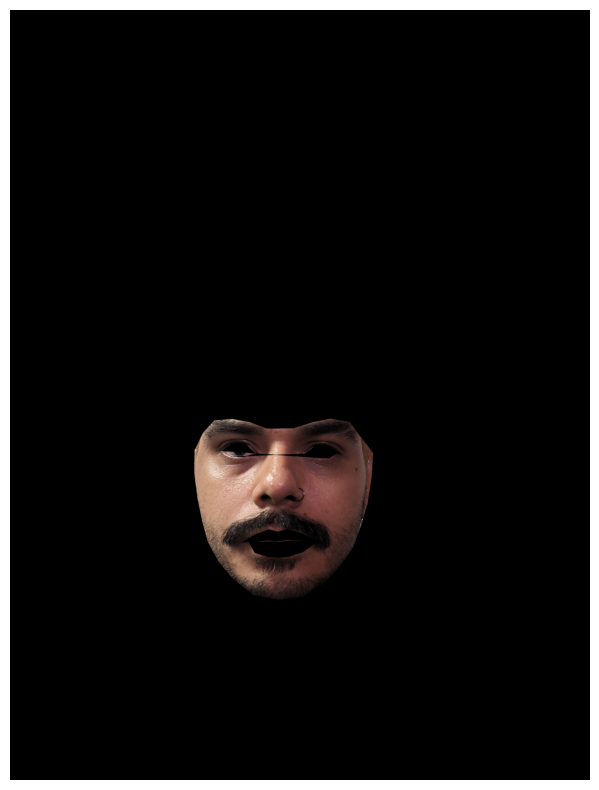

The closest shade in LAB is: brand                             Maybelline
brand_short                               mb
product                               Fit Me
product_short                            fmf
hex                                   6b5041
H                                       21.0
S                                       0.39
V                                       0.42
L                                         37
group                                      2
LAB              (36.470588235294116, 9, 13)
Name: 34, dtype: object, Error Rate of shade match : 3.3740306822823483


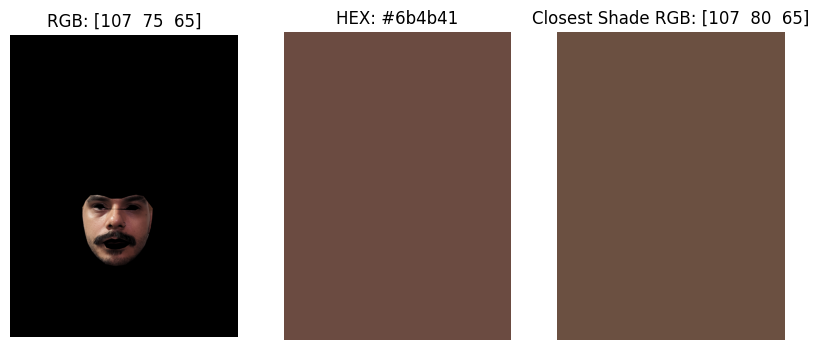

An error occurred while processing Copy of PXL_20220922_131732383.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_163218116.jpg...


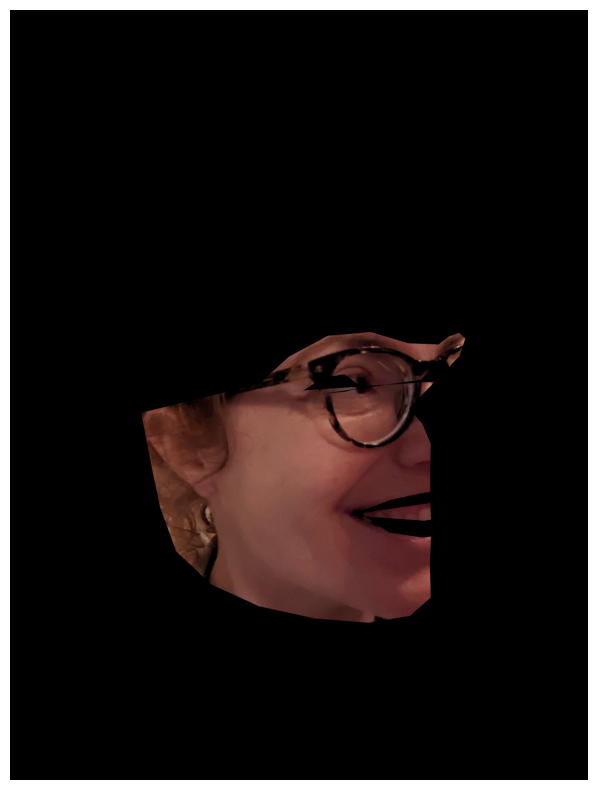

The closest shade in LAB is: brand                                Black Up
brand_short                                bu
product                       Matifying Fluid
product_short                              mf
hex                                    653129
H                                         8.0
S                                        0.59
V                                         0.4
L                                          27
group                                       3
LAB              (27.058823529411764, 22, 16)
Name: 260, dtype: object, Error Rate of shade match : 2.973999852883645


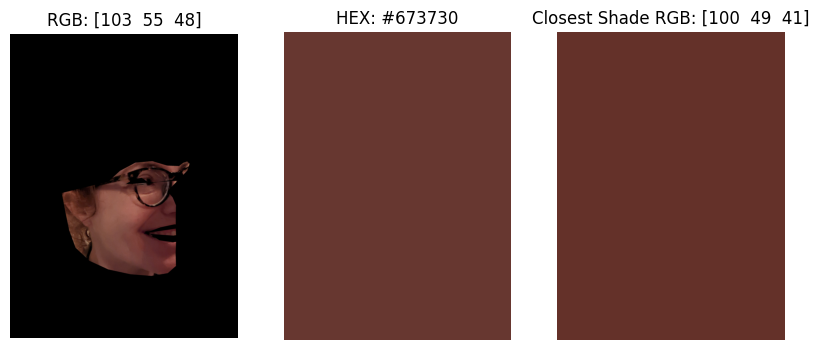

An error occurred while processing Copy of PXL_20220922_163218116.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_185659098.jpg...


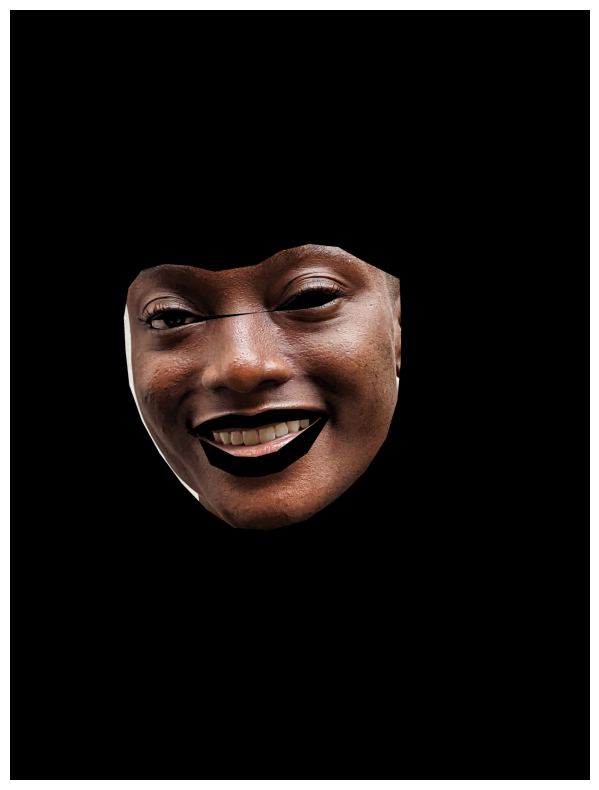

The closest shade in LAB is: brand                              Elsas Pro
brand_short                               ep
product                        Full Coverage
product_short                            fcf
hex                                   734b41
H                                       12.0
S                                       0.43
V                                       0.45
L                                         36
group                                      5
LAB              (36.07843137254902, 16, 13)
Name: 483, dtype: object, Error Rate of shade match : 3.22243433524761


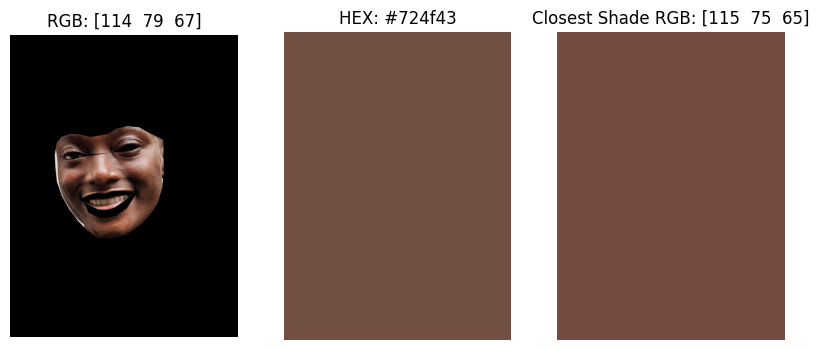

An error occurred while processing Copy of PXL_20220922_185659098.jpg: too many values to unpack (expected 2)
Processing Copy of PXL_20220922_183609632.PORTRAIT.jpg...


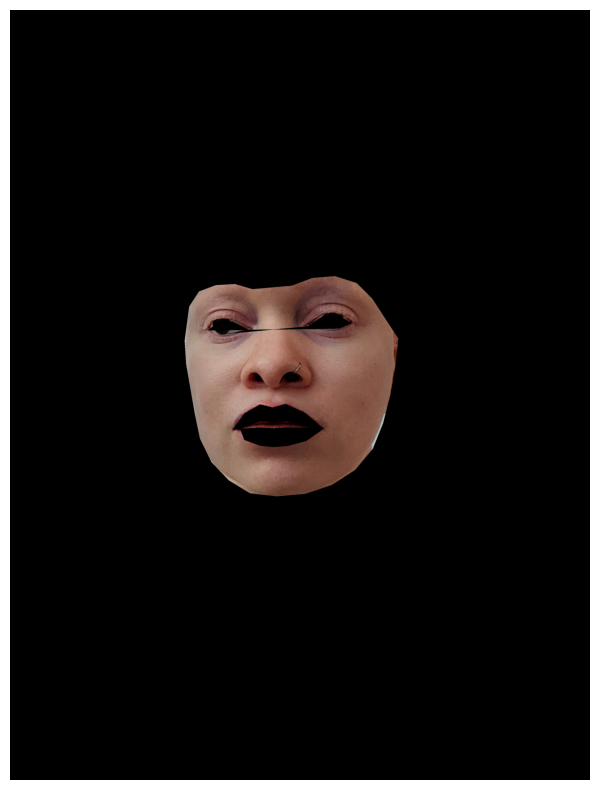

The closest shade in LAB is: brand                                  Revlon
brand_short                                rv
product                             ColorStay
product_short                              cs
hex                                    8e6558
H                                        14.0
S                                        0.38
V                                        0.56
L                                          47
group                                       2
LAB              (46.666666666666664, 15, 14)
Name: 130, dtype: object, Error Rate of shade match : 0.39215686274509665


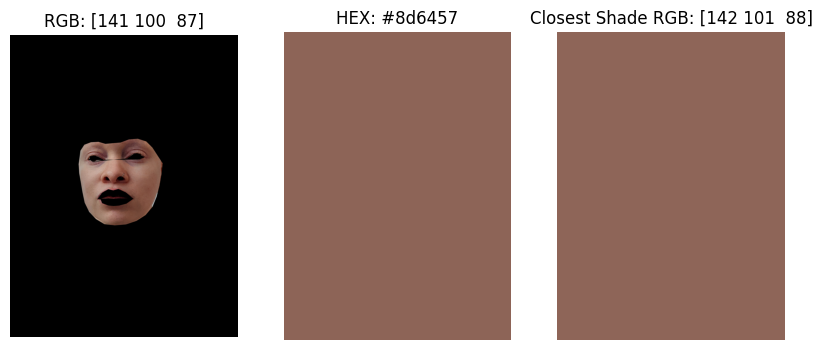

An error occurred while processing Copy of PXL_20220922_183609632.PORTRAIT.jpg: too many values to unpack (expected 2)


In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def process_directory(directory_path,shades_df):

    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for filename in image_files:
        file_path = os.path.join(directory_path, filename)
        print(f"Processing {filename}...")

        try:
            segmented_face = process_image(file_path)
            if segmented_face is not None:

                hex_color, lab_color = find_average_skin_tone_on_mask(segmented_face, shades_df)
                print(f"Processed {filename}: Hex Color - {hex_color}, LAB Color - {lab_color}")



        except Exception as e:
            print(f"An error occurred while processing {filename}: {e}")


process_directory('/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/shadematch',shades_df)


**Evaluation metrics**

In [ ]:
def calculate_error_distance(segmented_face, shades_df):
    face_rgb = cv2.cvtColor(segmented_face, cv2.COLOR_BGR2RGB)
    mask = np.all(face_rgb == [0, 0, 0], axis=-1)
    non_masked_pixels = face_rgb[~mask]

    if non_masked_pixels.size == 0:
        return None

    average_color = np.mean(non_masked_pixels, axis=0).astype(np.uint8)
    lab_color = rgb_to_lab_correctly(average_color)

    closest_shade = find_closest_shade(lab_color, shades_df)
    error_distance = euclidean(lab_color, closest_shade['LAB'])

    return error_distance

Processing Copy of PXL_20220922_134346135.PORTRAIT.jpg...


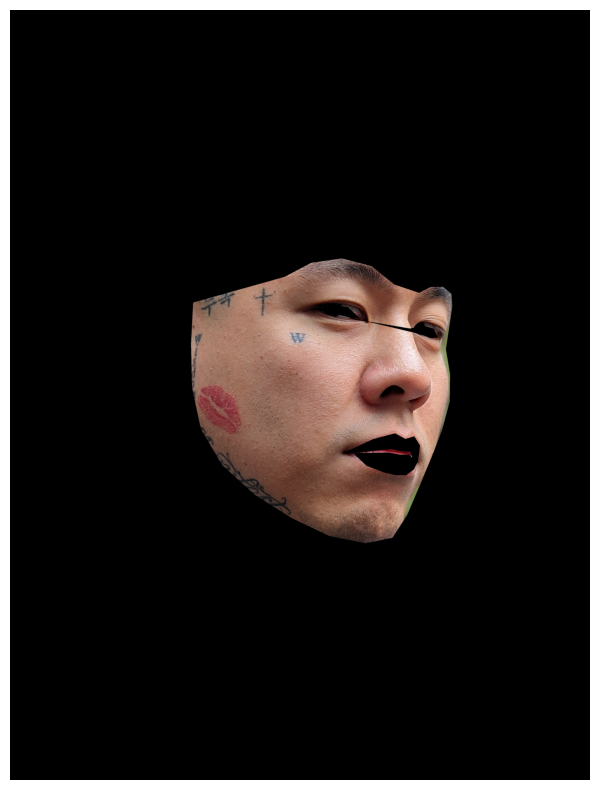

Processing Copy of PXL_20220922_174521457.jpg...


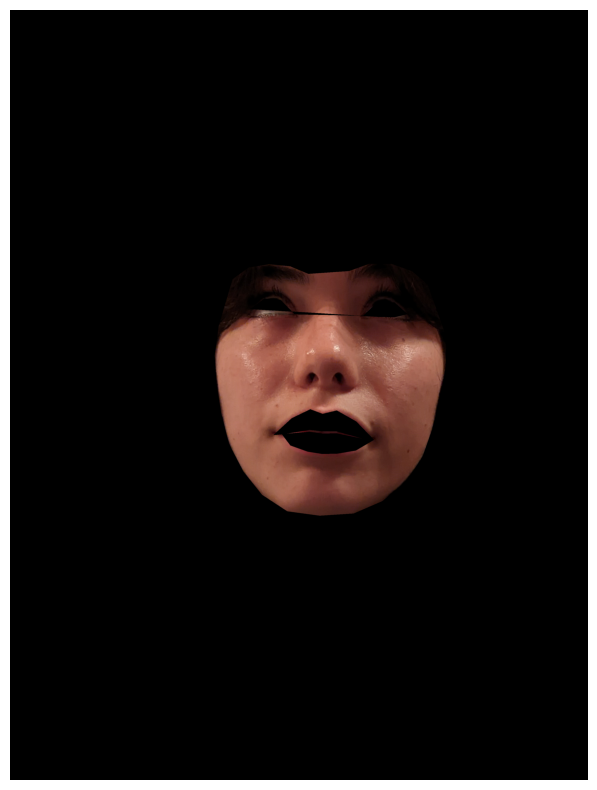

Processing Copy of PXL_20220922_173459363.jpg...


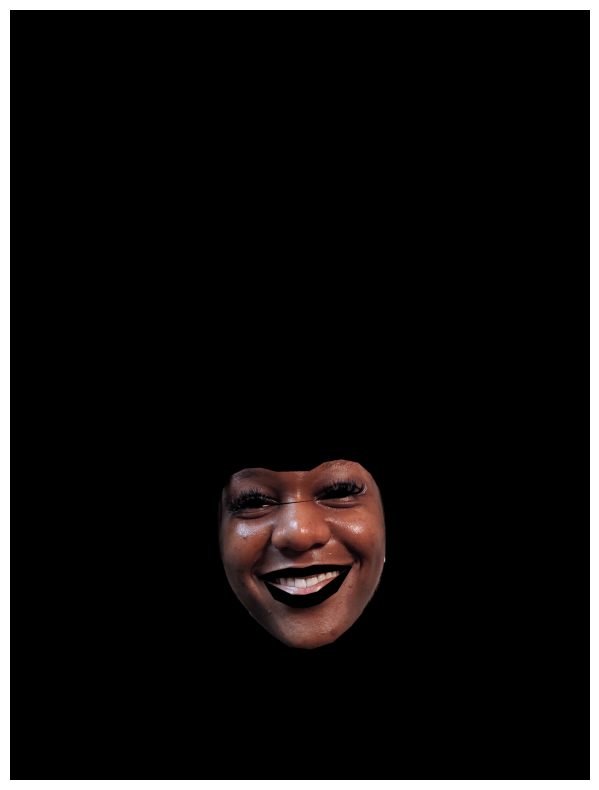

Processing Copy of PXL_20220922_193521063.jpg...


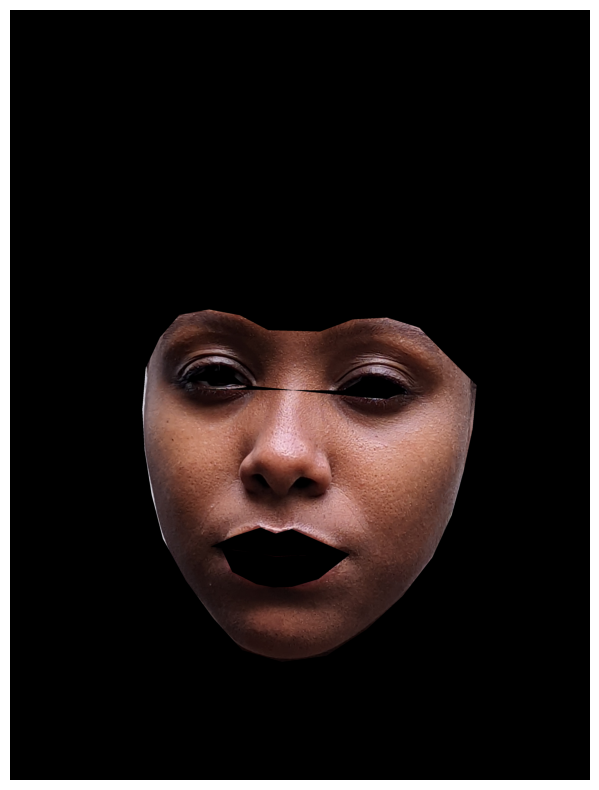

Processing Copy of PXL_20220922_162359800.jpg...


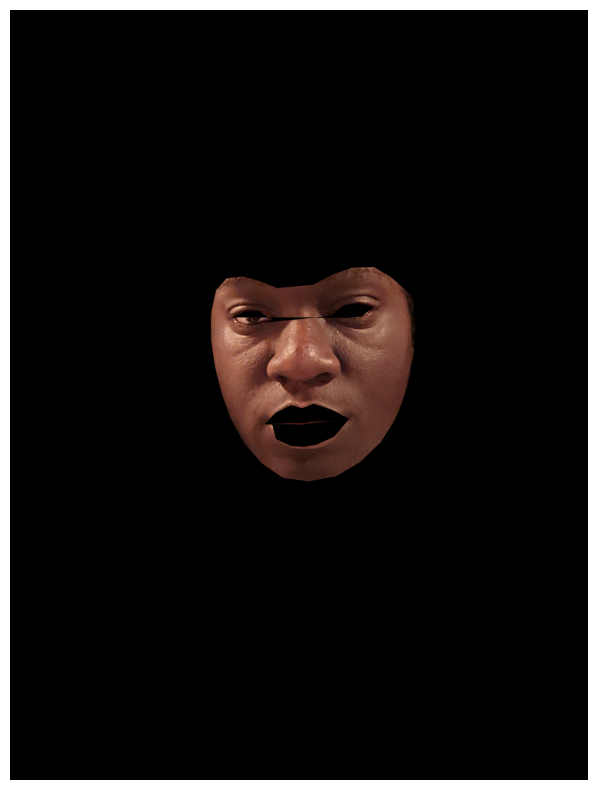

Processing Copy of PXL_20220922_143230097.jpg...


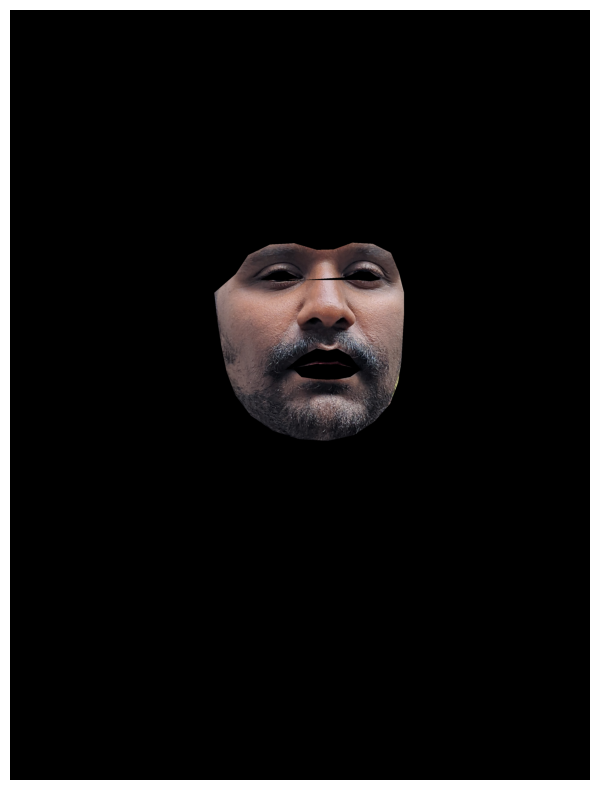

Processing Copy of PXL_20220922_142254164.PORTRAIT.jpg...


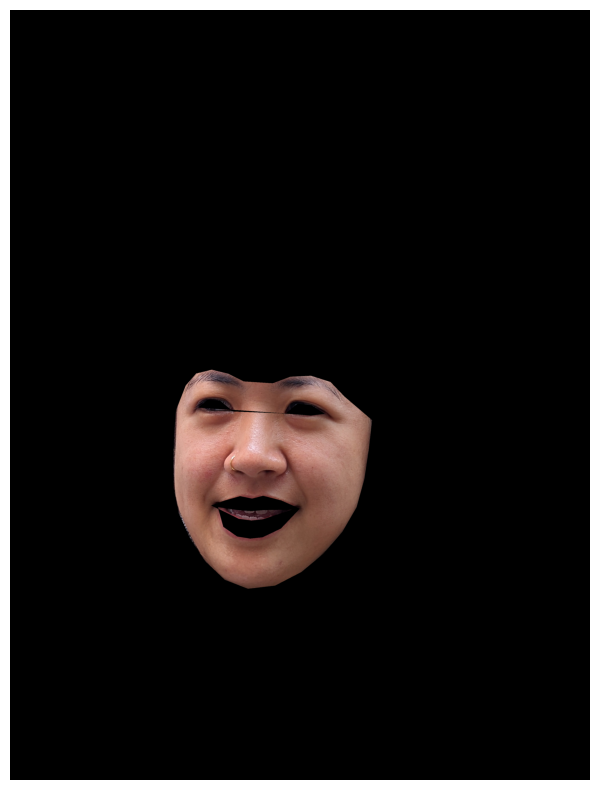

Processing Copy of PXL_20220922_200610155.jpg...


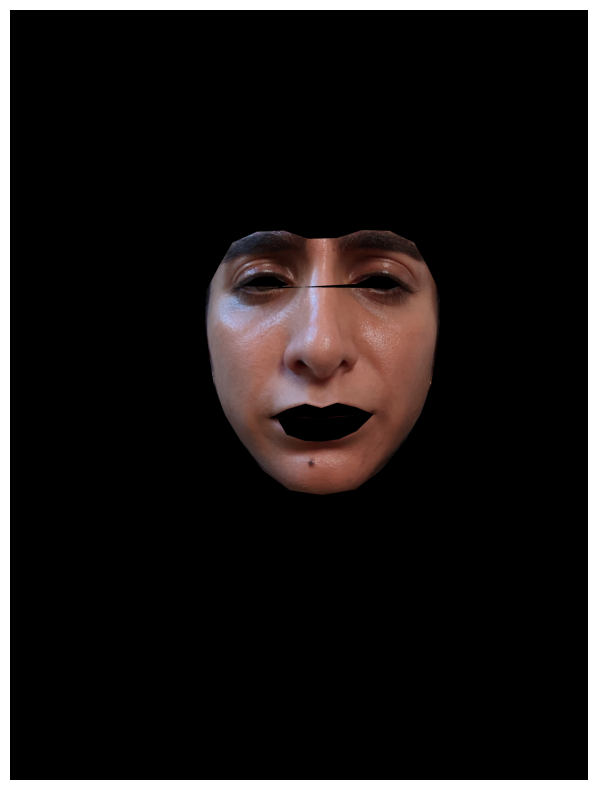

Processing Copy of PXL_20220922_144614653.PORTRAIT.jpg...


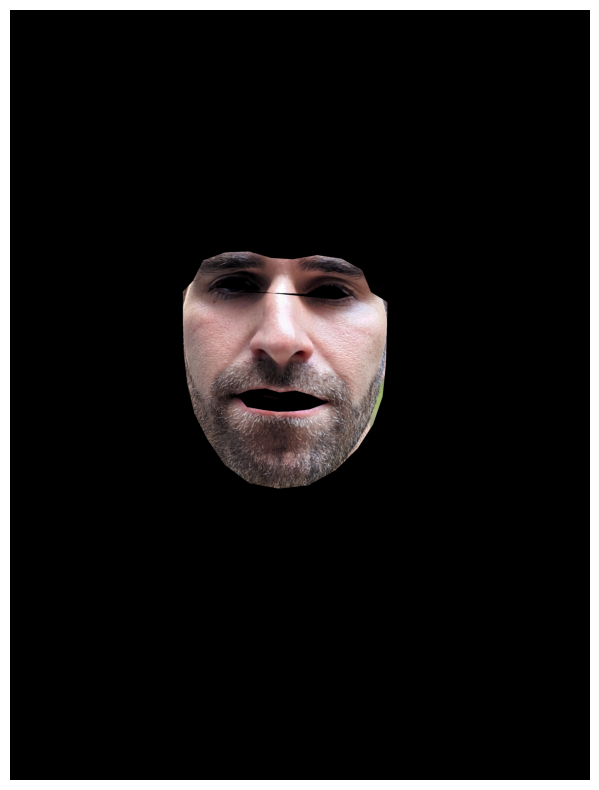

Processing Copy of PXL_20220922_140335749.PORTRAIT.jpg...


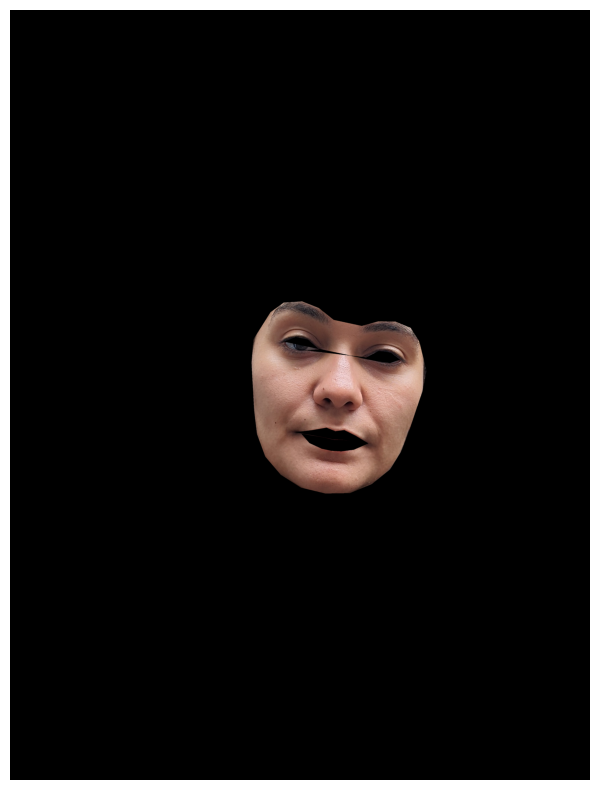

Processing Copy of PXL_20220922_195435930.jpg...


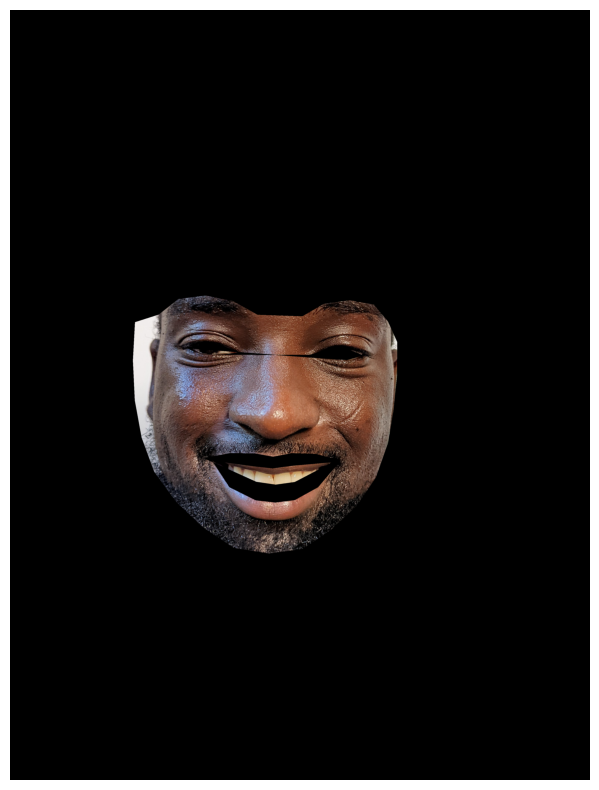

Processing Copy of PXL_20220922_194833505.jpg...


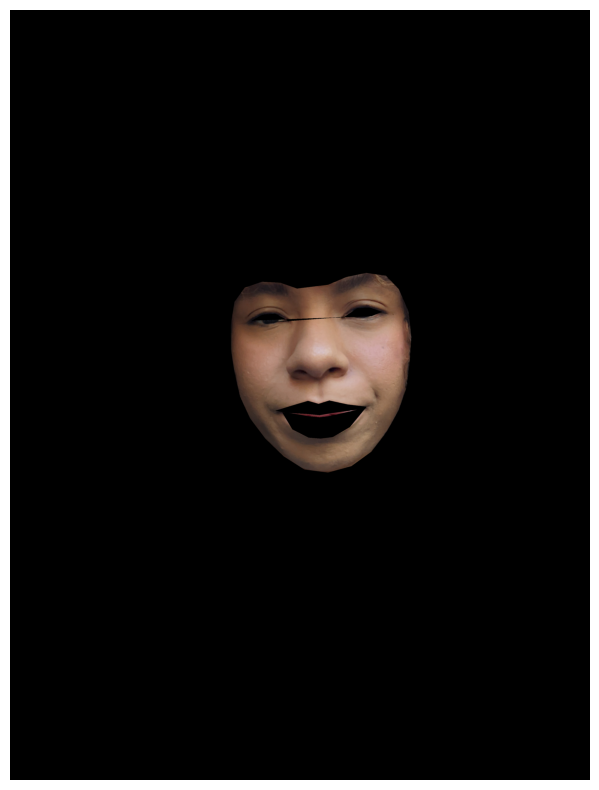

Processing Copy of PXL_20220922_175928064.jpg...


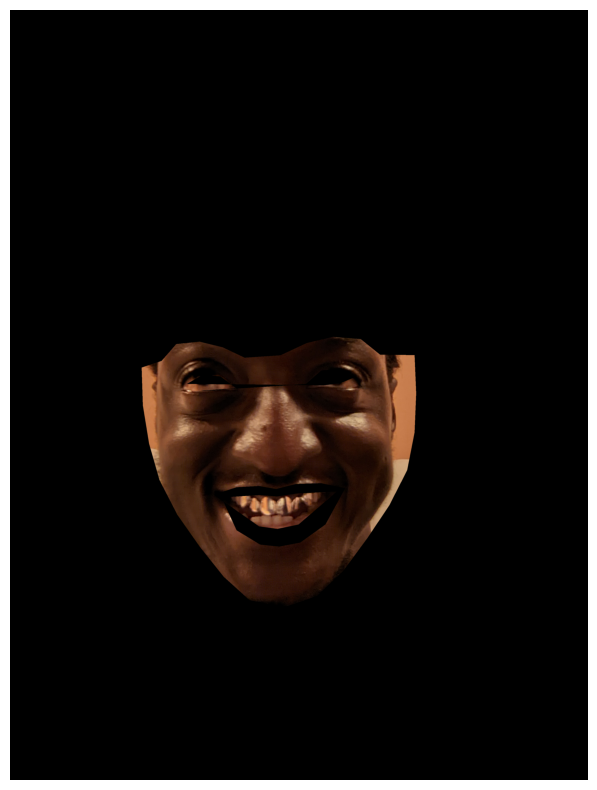

Processing Copy of PXL_20220922_140951373.jpg...


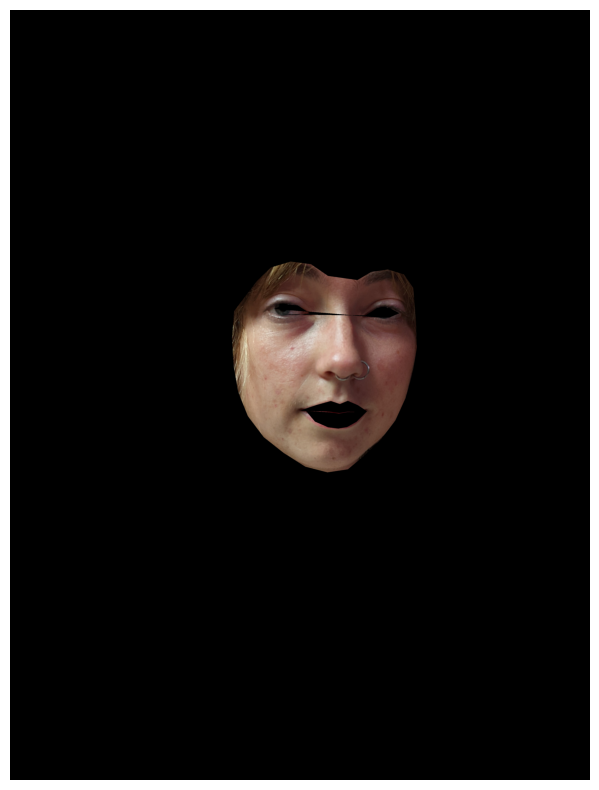

Processing Copy of PXL_20220922_160944429.jpg...


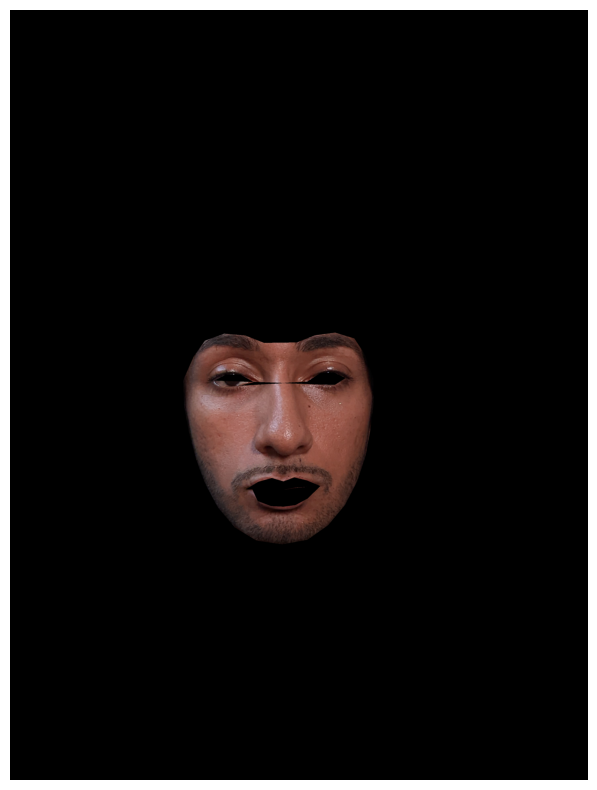

Processing Copy of PXL_20220922_131732383.jpg...


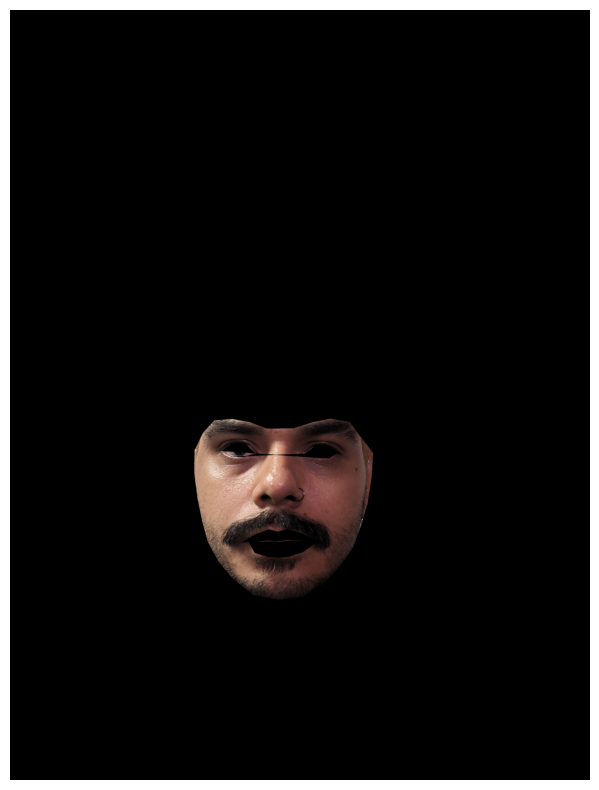

Processing Copy of PXL_20220922_163218116.jpg...


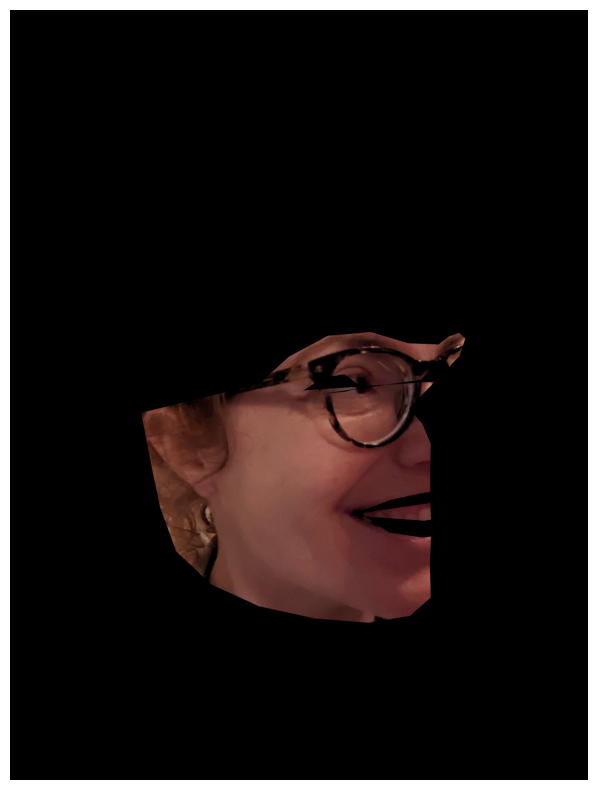

Processing Copy of PXL_20220922_185659098.jpg...


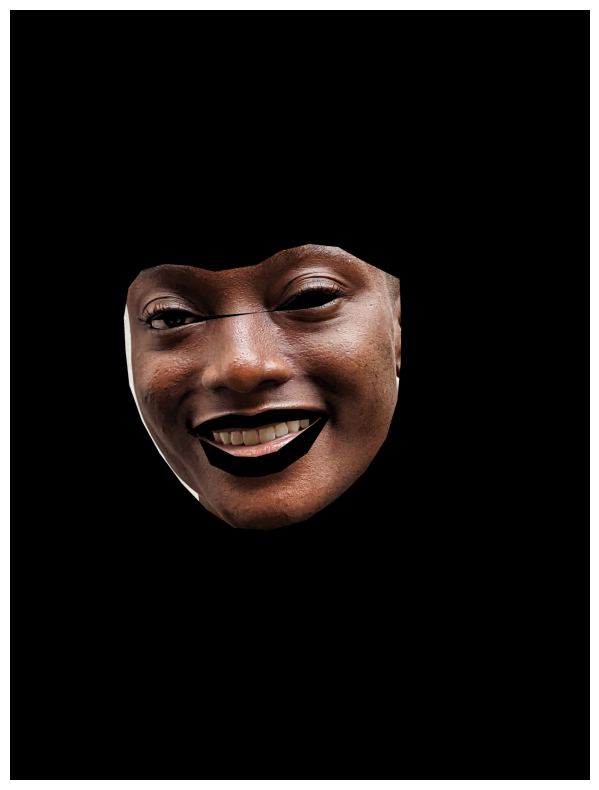

Processing Copy of PXL_20220922_183609632.PORTRAIT.jpg...


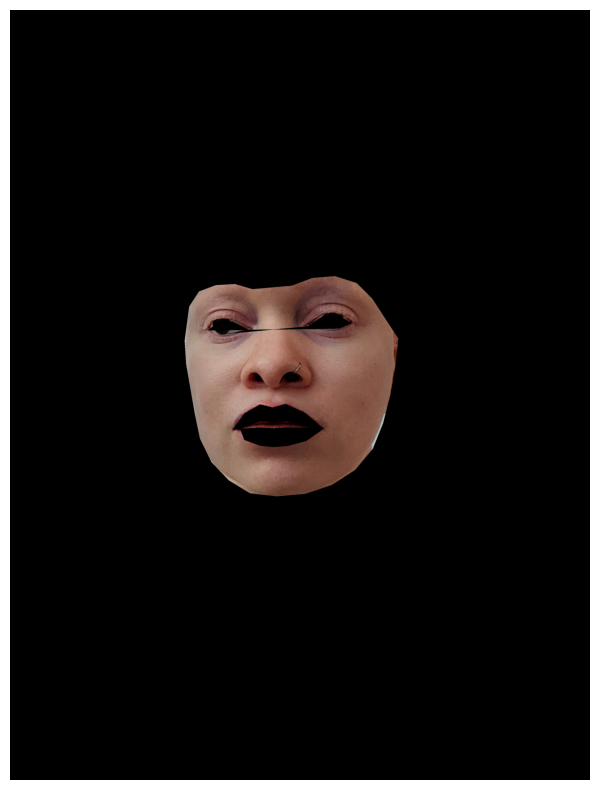

Average Error Rate: 3.935134806087896


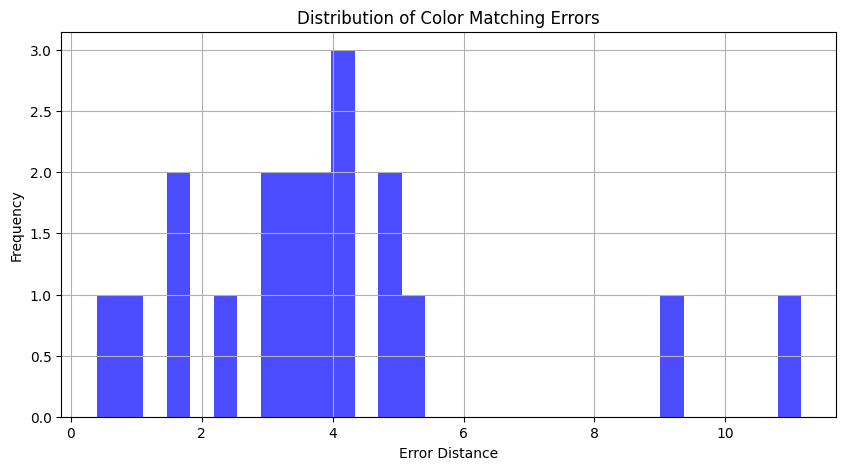

In [ ]:
import os
import cv2
import numpy as np
from scipy.spatial.distance import cdist

def process_directory(directory_path, shades_df):
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    error_distances = []


    for filename in image_files:
        file_path = os.path.join(directory_path, filename)
        print(f"Processing {filename}...")
        try:
            segmented_face = process_image(file_path)
            if segmented_face is not None:
                error_distance = calculate_error_distance(segmented_face, shades_df)
                if error_distance is not None:
                    error_distances.append(error_distance)

                else:
                    print(f"Processed {filename}, but no valid skin tone was found.")
            else:
                print(f"No face was segmented in {filename}.")
        except Exception as e:
            print(f"An error occurred while processing {filename}: {e}")

    # Calculate the average error distance if possible
    if error_distances:
        average_error = sum(error_distances) / len(error_distances)
        print(f"Average Error Rate: {average_error}")


        plt.figure(figsize=(10, 5))
        plt.hist(error_distances, bins=30, color='blue', alpha=0.7)
        plt.title('Distribution of Color Matching Errors')
        plt.xlabel('Error Distance')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()


shades_df = pd.read_csv('/content/drive/MyDrive/practical applications of fair algos/Codes/makeupShades/shades.csv')
shades_df['LAB'] = shades_df['hex'].apply(hex_to_lab)


process_directory('/content/drive/MyDrive/practical applications of fair algos/Codes/faceData/shadematch', shades_df)

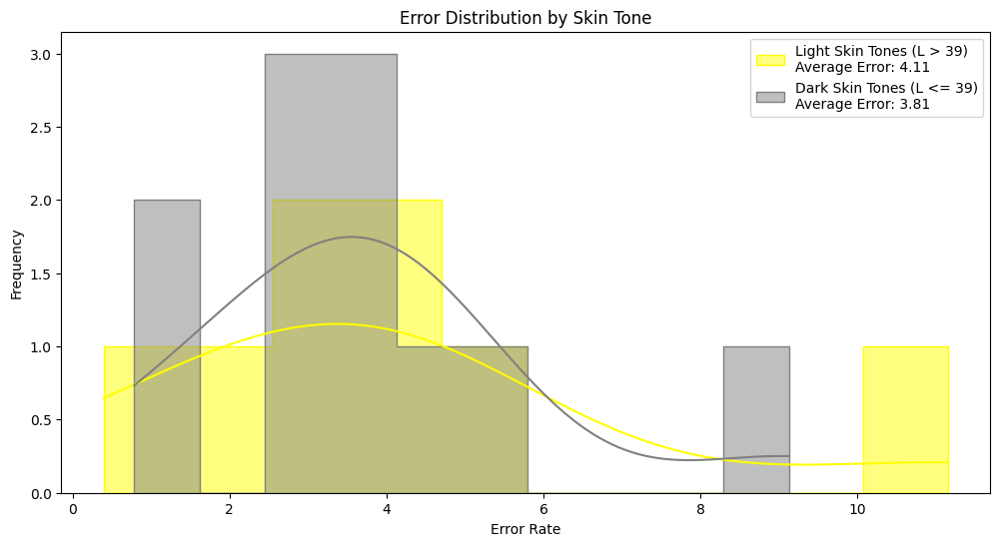

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

data = {
    'L_values': [47.05882352941176, 36.470588235294116, 31.372549019607842, 36.07843137254902,
                 32.94117647058823, 36.470588235294116, 47.05882352941176, 36.86274509803921,
                 42.745098039215684, 46.666666666666664, 36.470588235294116, 41.96078431372549,
                 23.137254901960784, 41.96078431372549, 36.470588235294116, 39.470588235294116,
                 27.058823529411764, 36.07843137254902, 46.666666666666664],
    'errors': [4.047060723513766, 5.015355122521044, 3.626814994592098, 2.5417694781331464, 4.0,
               9.131488544864014, 3.94161542770611, 4.104226495327949, 11.155467020454344, 5.098039215686278,
               4.95333859582664, 3.2927751699557235, 0.7843137254901968, 1.5440476174596072, 1.5686274509803937,
               3.3740306822823483, 2.973999852883645, 3.22243433524761, 0.39215686274509665]
}

# Threshold to categorize skin tones
threshold = 39
light_errors = []
dark_errors = []

# Categorize the errors based on L values
for l_value, error in zip(data['L_values'], data['errors']):
    if l_value > threshold:
        light_errors.append(error)
    else:
        dark_errors.append(error)

average_light_errors = np.mean(light_errors)
average_dark_errors = np.mean(dark_errors)

# Visualizing the results
plt.figure(figsize=(12, 6))
sns.histplot(light_errors, color='yellow', kde=True, label=f'Light Skin Tones (L > 39)\nAverage Error: {average_light_errors:.2f}', bins=10, element="step")
sns.histplot(dark_errors, color='gray', kde=True, label=f'Dark Skin Tones (L <= 39)\nAverage Error: {average_dark_errors:.2f}', bins=10, element="step")
plt.title('Error Distribution by Skin Tone')
plt.xlabel('Error Rate')
plt.ylabel('Frequency')
plt.legend()
plt.show()


## Section 2: Hex Value Matching

### Data Preprocessing

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Designing Fair Algorithms/practical applications of fair algos/Codes/makeupShades/shades.csv")

In [ ]:
# of one particular product line for Maybelline
mb_data = df.loc[(df['brand_short'] == "mb") & (df['product'] == "Fit Me")]

hex_list = list(mb_data["hex"])
hex_list = ["#" + i for i in hex_list]
# display(hex_list)

hsv_list = []
for i in range(len(mb_data)):
  hsv_list.append((mb_data["H"][i], mb_data["S"][i], mb_data["V"][i]))
# print(hsv_list)

In [ ]:
def visualize_colors(colors):
    """Visualize a list of colors."""
    fig, ax = plt.subplots(figsize=(len(colors), 2))
    for i, color in enumerate(colors):
        patch = patches.Rectangle((i, 0), 1, 2, linewidth=1, edgecolor='r', facecolor=color)
        ax.add_patch(patch)
    plt.axis('off')
    plt.xlim(0, len(colors))
    plt.ylim(0, 2)
    plt.show()

### Hex -> RGB Color Space Mixing to Match

In [ ]:
""" Convert hex to its rbg representation """
def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

""" Convert rbg back to hexrepresentation """
def rgb_to_hex(rgb_color):
    return '#%02x%02x%02x' % rgb_color

""" Takes in two hex values and outputs the hex value of the mixed rbg at given ratios"""
def mix_colors(color1, color2, mix_ratio):
    rgb1 = hex_to_rgb(color1)
    rgb2 = hex_to_rgb(color2)
    mixed_rgb = tuple(int((1 - mix_ratio) * rgb1[i] + mix_ratio * rgb2[i]) for i in range(3))
    return rgb_to_hex(mixed_rgb)

In [ ]:
""" Find the euclidean distances between two colors"""
def color_distance(rgb1, rgb2):
    return sum((c1 - c2) ** 2 for c1, c2 in zip(rgb1, rgb2)) ** 0.5

""" Give ratios defined at 0.1... """
def find_best_mixHEX(colors, target, mix_ratios):
    target_rgb = hex_to_rgb(target)
    best_match = None
    best_distance = float('inf')
    best_ratio = None
    for color1, color2 in itertools.combinations(colors, 2):
        for ratio in mix_ratios:
            mixed = mix_colors(color1, color2, ratio)
            distance = color_distance(hex_to_rgb(mixed), target_rgb)
            if distance < best_distance:
                best_distance = distance
                best_match = (color1, color2)
                best_ratio = ratio
    return best_match, best_ratio, rgb_to_hex(hex_to_rgb(mix_colors(*best_match, best_ratio))), best_distance

In [ ]:
# Showing example of color mixing using rgbs
target_hex = '#9b653c'
mix_ratios = [i * 0.1 for i in range(11)]  # Example mix ratios from 0.0 to 1.0 in increments of 0.1

best_match, best_ratio, mixed_color, best_distance = find_best_mixHEX(hex_list, target_hex, mix_ratios)
print(f"Best mix: {best_match} at ratio {best_ratio} to get {mixed_color}")

print("distance away from target color:", best_distance)

Best mix: ('#d99358', '#5e3a23') at ratio 0.5 to get #9b663d
distance away from target color: 1.4142135623730951


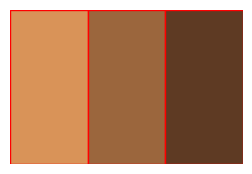

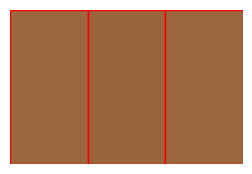

In [ ]:
visualize_colors([best_match[0], mixed_color, best_match[1]])
visualize_colors([mixed_color,target_hex, mixed_color])

### HSV -> LAB Color space


In [ ]:
def hsv_to_rgb(hsv):
    """Convert an HSV color to RGB. Input: (H, S, V) with H in [0, 360] and S, V in [0, 100]."""
    # Normalize H, S, V values
    h, s, v = hsv
    h /= 360.0
    # s /= 100.0
    # v /= 100.0
    return colorsys.hsv_to_rgb(h, s, v)

def rgb_to_lab(rgb):
    """Converts an RGB color to LAB. Input: (R, G, B) with values in [0, 1]."""
    # Reshape for processing
    rgb_reshaped = np.array(rgb).reshape(1, 1, 3)
    # Convert to LAB
    lab = rgb2lab(rgb_reshaped)
    return lab[0, 0, :]

def lab_to_rgb_displayable(lab_color):
    lab_color = np.array([lab_color], dtype=np.float64)

    # Reshape the color to make it compatible with lab2rgb, which expects a 3D array
    # The new shape is (1, 1, 3) to represent a single pixel
    lab_color_reshaped = lab_color.reshape((1, 1, 3))
    # Convert the LAB color to RGB
    rgb_color = lab2rgb(lab_color_reshaped)
    # The result is a 3D array. Extract the RGB color as a 1D array
    rgb_color_1d = rgb_color.reshape((3,))

    # Print the RGB color
    # print(rgb_color_1d)

    # The resulting RGB values will be normalized between 0 and 1.
    # If you need values in the 0 to 255 range, you can convert them like this:
    # rgb_255 = np.clip(rgb_color_1d * 255, 0, 255).astype(np.uint8)
    return rgb_color_1d

def lab_distance(lab1, lab2):
    delta_l_squared = (lab1[0] - lab2[0]) ** 2
    delta_a_squared = (lab1[1] - lab2[1]) ** 2
    delta_b_squared = (lab1[2] - lab2[2]) ** 2

    # Sum the squared differences and take the square root
    distance = math.sqrt(delta_l_squared + delta_a_squared + delta_b_squared)

    return distance


# def hsl_to_rgb(hsl):
#     """Convert an HSL color to RGB. Input: (H, S, L) with H in [0, 360] and S, L in [0, 100]."""
#     # Normalize H, S, L values
#     h, s, l = hsl
#     # h /= 360.0
#     # s /= 100.0
#     # l /= 100.0
#     return colorsys.hls_to_rgb(h, l, s)  # Note: colorsys uses HLS, not HSL

In [ ]:
def mix_lab_colors(lab1, lab2, ratio):
    """
    Mixes two LAB colors based on the given ratio.

    :param lab1: The first LAB color as a tuple or list (L, a, b)
    :param lab2: The second LAB color as a tuple or list (L, a, b)
    :param ratio: The mix ratio, ranging from 0.0 (all lab1) to 1.0 (all lab2)
    :return: The mixed LAB color as a tuple (L, a, b)
    """
    # Ensure the ratio is within the bounds [0.0, 1.0]
    ratio = max(0.0, min(1.0, ratio))

    # Linearly interpolate between the two colors
    mixed_lab = (1 - ratio) * np.array(lab1) + ratio * np.array(lab2)

    return tuple(mixed_lab)

In [ ]:
""" Give ratios defined at 0.1... """
def find_best_mixLAB(colors, target, mix_ratios):
    target_lab = hsv_to_rgb(target)
    target_lab = rgb_to_lab(target_lab)
    best_match = None
    best_distance = float('inf')
    best_ratio = None
    for color1, color2 in itertools.combinations(colors, 2):
        lab_color1 = hsv_to_rgb(color1)
        lab_color1 = rgb_to_lab(lab_color1)

        lab_color2 = hsv_to_rgb(color2)
        lab_color2 = rgb_to_lab(lab_color2)

        for ratio in mix_ratios:
            # print("HERE")
            mixedLab = mix_lab_colors(lab_color1, lab_color2, ratio)
            distance = lab_distance(mixedLab, target_lab)
            if distance < best_distance:
                best_distance = distance
                best_match = (lab_color1, lab_color2)
                best_ratio = ratio

    return best_match, best_ratio, mix_lab_colors(*best_match, best_ratio), best_distance

In [ ]:
# hsv_list, target_hsv
target_hsv = (26, .61, .61)


mix_ratios = [i * 0.1 for i in range(11)]  # Example mix ratios from 0.0 to 1.0 in increments of 0.1
# target_lab = hsv_to_rgb(target_hsv)
# target_lab = rgb_to_lab(target_lab)

best_match, best_ratio, mixed_color, best_distance = find_best_mixLAB(hsv_list, target_hsv, mix_ratios)
print(f"Best mix: {best_match} at ratio {best_ratio} to get {mixed_color}")
# print(f"TARGET IS: {target_lab}")
print(f"Distance from Target is {best_distance}")

Best mix: (array([39.85497524, 12.10418105, 27.76036205]), array([51.49993834, 18.92594843, 34.56371766])) at ratio 0.7000000000000001 to get (48.0064494101422, 16.879418217706572, 32.522710977890604)
Distance from Target is 0.8277387359167776


In [ ]:
color1RGB = lab_to_rgb_displayable(best_match[0])
color2RGB = lab_to_rgb_displayable(best_match[1])
targetRGB = hsv_to_rgb(target_hsv)
# print(targetRGB)
mixedRGB = lab_to_rgb_displayable(mixed_color)



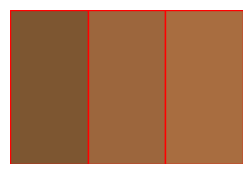

color1 targetColor color2


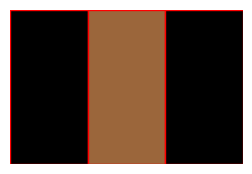

       outputColor       


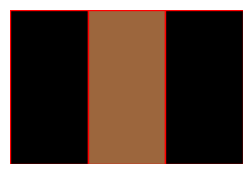

       targetColor       


In [ ]:
visualize_colors([color1RGB,targetRGB, color2RGB])
print("color1", "targetColor", "color2")
visualize_colors([(0,0,0), mixedRGB, (0,0,0)])
print("      ", "outputColor", "      ")

visualize_colors([(0,0,0), targetRGB, (0,0,0)])
print("      ", "targetColor", "      ")


### One-One RGB Match

In [ ]:
""" Give ratios defined at 0.1... """
def find_best_matchSING(colors, target):
    target_rgb = hex_to_rgb(target)
    best_match = None
    best_distance = float('inf')
    for color1 in colors:
        color1_rgb = hex_to_rgb(color1)
        distance = color_distance(color1_rgb, target_rgb)
        if distance < best_distance:
            best_distance = distance
            best_match = color1
    return best_match, best_distance

Best Match: #9d6f48 at distance 15.748015748023622 to get #9b653c


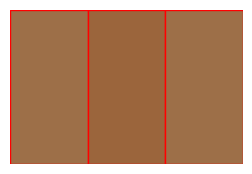

In [ ]:
target_hex = '#9b653c'
best_match, best_distance = find_best_matchSING(hex_list, target_hex)
print(f"Best Match: {best_match} at distance {best_distance} to get {target_hex}")

# target_rgb = hex_to_rgb(target_hex)
# match_rgb = hex_to_rgb(best_match)

visualize_colors([best_match, target_hex, best_match])


Distance 15.74 vs Distance (Hex) 1.04 and Distance (LAB) of 0.94 is an amazing new way to match foundation for a particular brand!
Simple to do, just has not been done :)

### Adding white and black to skin tone mixes

In [ ]:
def get_All_Matches(hex_list, hsv_vals, target_hex, target_hsv, df_results):
  mix_ratios = [i * 0.1 for i in range(11)]  # Example mix ratios from 0.0 to 1.0 in increments of 0.1

  # Matching with HEX
  best_matchHEX, best_ratioHEX, mixed_colorHEX, best_distanceHEX = find_best_mixHEX(hex_list, target_hex, mix_ratios)

  # print("Color Visualization for HEX Mixing Colors")
  # visualize_colors([best_matchHEX[0], mixed_colorHEX, best_matchHEX[1]])
  # visualize_colors([mixed_colorHEX,target_hex, mixed_colorHEX])

  print(f"Best mix HEX: {best_matchHEX} at ratio {best_ratioHEX} to get {mixed_colorHEX}")
  print("distance away from target color:", best_distanceHEX)
  print()


  # Matching with LAB
  best_matchLAB, best_ratioLAB, mixed_colorLAB, best_distanceLAB = find_best_mixLAB(hsv_list, target_hsv, mix_ratios)
  target_lab = hsv_to_rgb(target_hsv)
  target_lab = rgb_to_lab(target_lab)
  print(f"Best mix LAB: {best_matchLAB} at ratio {best_ratioLAB} to get {target_lab}")
  print(f"distance from target color is {best_distanceLAB}")
  print()

  color1RGB = lab_to_rgb_displayable(best_matchLAB[0])
  color2RGB = lab_to_rgb_displayable(best_matchLAB[1])
  targetRGB = hsv_to_rgb(target_hsv)
  mixedRGB = lab_to_rgb_displayable(mixed_colorLAB)

  # print(color1RGB, color2RGB)
  color1HSV = colorsys.rgb_to_hsv(*color1RGB)
  color1HSV = (round(color1HSV[0] * 360), round(color1HSV[1], 2), round(color1HSV[2], 2))
  color2HSV = colorsys.rgb_to_hsv(*color2RGB)
  color2HSV = (round(color2HSV[0] * 360), round(color2HSV[1], 2), round(color2HSV[2], 2))
  mixedHSV = colorsys.rgb_to_hsv(*mixedRGB)
  mixedHSV = (round(mixedHSV[0] * 360), round(mixedHSV[1], 2), round(mixedHSV[2], 2))

  print(color1HSV, color2HSV, mixedHSV)

  # visualize_colors([color1RGB,targetRGB, color2RGB])
  # print("color1", "targetColor", "color2")
  # visualize_colors([(0,0,0), mixedRGB, (0,0,0)])
  # print("      ", "outputColor", "      ")

  # visualize_colors([(0,0,0), targetRGB, (0,0,0)])
  # print("      ", "targetColor", "      ")
  # print()

  # SINGLE MATCH RGB
  best_matchSING, best_distanceSING = find_best_matchSING(hex_list, target_hex)
  print(f"Best Single Match: {best_matchSING} at distance {best_distanceSING} to get {target_hex}")

  # add to df
  # Example data for adding a row to the DataFrame
  row_data = {
      "target_hex": target_hex,
      "target_hsv": target_hsv,
      "1-1HexMatch": best_matchSING,
      "1-1HexMatch_Distance": best_distanceSING,
      "1-2HexMatch_Color1": best_matchHEX[0],
      "1-2HexMatch_Color2": best_matchHEX[1],
      "1-2Hex_Distance": best_distanceHEX,
      "1-2HexMatch_OutputColor": mixed_colorHEX,
      "1-2HexMatch_Ratio": best_ratioHEX,
      "1-2LabMatch_Color1": color1HSV,
      "1-2LabMatch_Color2": color2HSV,
      "1-2Lab_Distance": best_distanceLAB,
      "1-2LabMatch_OutputColor": mixedHSV,
      "1-2LabMatch_Ratio": best_ratioLAB
  }

  return row_data


In [ ]:
def runForTarget(target_hex, target_hsv, hex_list, hsv_list, df_results):
  row_data = get_All_Matches(hex_list, hsv_list, target_hex, target_hsv, df_results)
  row_data = pd.DataFrame([row_data])
  df_results = pd.concat([df_results, row_data], ignore_index=True)

  return df_results

In [ ]:
df_results = pd.DataFrame(columns=[
    "target_hex", "target_hsv",
    "1-1HexMatch", "1-1HexMatch_Distance",
    "1-2HexMatch_Color1", "1-2HexMatch_Color2", "1-2Hex_Distance", "1-2HexMatch_OutputColor", "1-2HexMatch_Ratio",
    "1-2LabMatch_Color1", "1-2LabMatch_Color2", "1-2Lab_Distance", "1-2LabMatch_OutputColor", "1-2LabMatch_Ratio"
])

In [ ]:
# create the dataset of 5 skin tones:
skintones = []

skintone1a = ("#f0d2b9", (28, 0.23, 0.94))
skintone2a = ("#f2d1b8", (26, 0.24, 0.95))
skintone3a = ("#9b653c",	(26, 0.611, 0.606))
skintone4a = ("#5c391f",	(26, 0.66, 0.36))
skintone5a = ("#2b1710",	(15, 0.64, 0.17))

skintones.append(skintone1a)
skintones.append(skintone2a)
skintones.append(skintone3a)
skintones.append(skintone4a)
skintones.append(skintone5a)

In [ ]:
print(skintones)

[('#f0d2b9', (28, 0.23, 0.94)), ('#f2d1b8', (26, 0.24, 0.95)), ('#9b653c', (26, 0.611, 0.606)), ('#5c391f', (26, 0.66, 0.36)), ('#2b1710', (15, 0.64, 0.17))]


In [ ]:
current_hex = hex_list
current_hsv = hsv_list

print(current_hex)
print(current_hsv)
# we will add black and white to each
# current_hex.append('#000000')
# current_hex.append('#FFFFFF')
# current_hsv.append((0.0,0.0,0.0))
# current_hsv.append((0.0,0.0,1.0))

# print(current_hex)
# print(current_hsv)

['#f3cfb3', '#ffe3c2', '#ffe0cd', '#ffd3be', '#bd9584', '#eabda6', '#fbd2ad', '#e2b597', '#e4b38e', '#b2856f', '#e8ba8c', '#f3b584', '#f0b996', '#e3b082', '#eab181', '#9d7359', '#e2aa7b', '#d99358', '#9c744f', '#b18b65', '#84583f', '#7d5631', '#c07746', '#643c27', '#edcfb9', '#e1bba7', '#c1a07e', '#d09e7c', '#c7967d', '#c09578', '#9d6f48', '#a86d40', '#7f5c3b', '#735642', '#6b5041', '#7d5c4d', '#5c4433', '#5e3a23', '#5e4638', '#3f2018']
[(26.0, 0.26, 0.95), (32.0, 0.24, 1.0), (23.0, 0.2, 1.0), (19.0, 0.25, 1.0), (18.0, 0.3, 0.74), (20.0, 0.29, 0.92), (28.0, 0.31, 0.98), (24.0, 0.33, 0.89), (26.0, 0.38, 0.89), (20.0, 0.38, 0.7), (30.0, 0.4, 0.91), (26.0, 0.46, 0.95), (23.0, 0.37, 0.94), (28.0, 0.43, 0.89), (27.0, 0.45, 0.92), (23.0, 0.43, 0.62), (27.0, 0.46, 0.89), (27.0, 0.59, 0.85), (29.0, 0.49, 0.61), (30.0, 0.43, 0.69), (22.0, 0.52, 0.52), (29.0, 0.61, 0.49), (24.0, 0.64, 0.75), (21.0, 0.61, 0.39), (25.0, 0.22, 0.93), (21.0, 0.26, 0.88), (30.0, 0.35, 0.76), (24.0, 0.4, 0.82), (20.0,

In [ ]:
for i in skintones:
  df_results = runForTarget(i[0], i[1], current_hex, current_hsv, df_results)

Best mix HEX: ('#ffe3c2', '#edcfb9') at ratio 0.8 to get #f0d3ba
distance away from target color: 1.4142135623730951

Best mix LAB: (array([91.58640045,  4.9249709 , 19.56051343]), array([85.00775513,  7.32538636, 14.73383419])) at ratio 0.7000000000000001 to get [86.10604525  6.34244447 16.52559901]
distance from target color is 0.9764224221858381

(32, 0.24, 1.0) (25, 0.22, 0.93) (27, 0.23, 0.95)
Best Single Match: #edcfb9 at distance 4.242640687119285 to get #f0d2b9
Best mix HEX: ('#ffd3be', '#edcfb9') at ratio 0.7000000000000001 to get #f2d0ba
distance away from target color: 2.23606797749979

Best mix LAB: (array([86.35542127,  9.43123831, 23.38608626]), array([85.00775513,  7.32538636, 14.73383419])) at ratio 0.8 to get [86.07607697  7.73814297 16.75814339]
distance from target color is 0.8511680382853124

(28, 0.31, 0.98) (25, 0.22, 0.93) (26, 0.24, 0.94)
Best Single Match: #f3cfb3 at distance 5.477225575051661 to get #f2d1b8
Best mix HEX: ('#d99358', '#5e3a23') at ratio 0.5 to 

In [ ]:
display(df_results)

,target_hex,target_hsv,1-1HexMatch,1-1HexMatch_Distance,1-2HexMatch_Color1,1-2HexMatch_Color2,1-2Hex_Distance,1-2HexMatch_OutputColor,1-2HexMatch_Ratio,1-2LabMatch_Color1,1-2LabMatch_Color2,1-2Lab_Distance,1-2LabMatch_OutputColor,1-2LabMatch_Ratio
0,#f0d2b9,"(28, 0.23, 0.94)",#edcfb9,4.242641,#ffe3c2,#edcfb9,1.414214,#f0d3ba,0.8,"(32, 0.24, 1.0)","(25, 0.22, 0.93)",0.976422,"(27, 0.23, 0.95)",0.7
1,#f2d1b8,"(26, 0.24, 0.95)",#f3cfb3,5.477226,#ffd3be,#edcfb9,2.236068,#f2d0ba,0.7,"(28, 0.31, 0.98)","(25, 0.22, 0.93)",0.851168,"(26, 0.24, 0.94)",0.8
2,#9b653c,"(26, 0.611, 0.606)",#9d6f48,15.748016,#d99358,#5e3a23,1.414214,#9b663d,0.5,"(27, 0.59, 0.85)","(23, 0.63, 0.37)",0.929836,"(26, 0.6, 0.6)",0.5
3,#5c391f,"(26, 0.66, 0.36)",#5e3a23,4.582576,#5e3a23,#3f2018,3.464102,#5a3721,0.1,"(26, 0.26, 0.95)","(23, 0.63, 0.37)",2.168842,"(23, 0.63, 0.37)",1.0
4,#2b1710,"(15, 0.64, 0.17)",#3f2018,23.345235,#f3cfb3,#3f2018,23.345235,#3f2018,1.0,"(26, 0.26, 0.95)","(12, 0.62, 0.25)",8.507260,"(12, 0.62, 0.25)",1.0


#### Plots

##### Error Distance Trend as Hex Codes Progress to represent Darker Skin Tones for 1-1 matches compared to 1-2 matches without black and white added

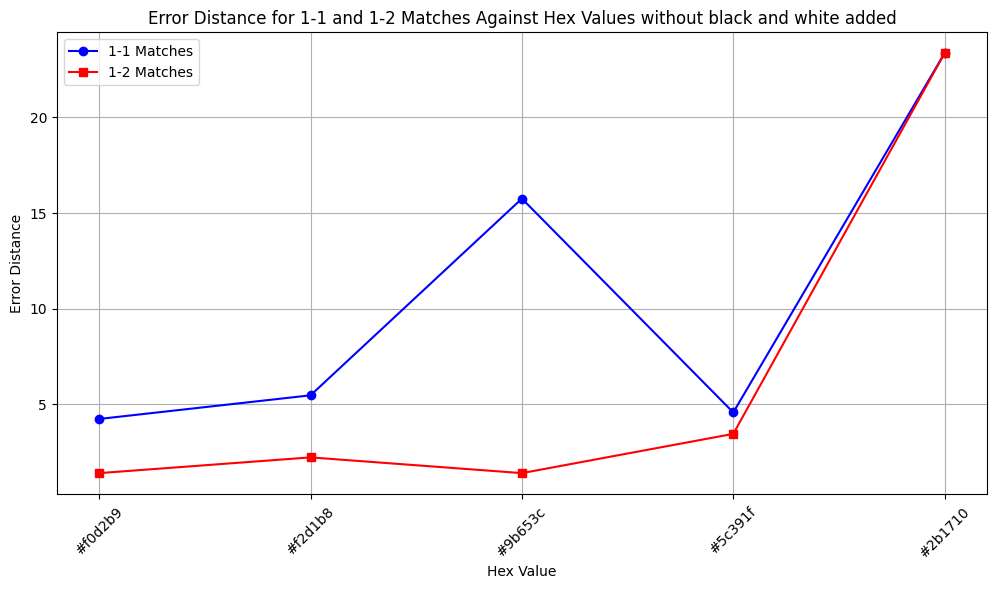

In [ ]:
plt.figure(figsize=(12, 6))
hex_codes = df_results["target_hex"]
matches1_1 = df_results["1-1HexMatch_Distance"]
matches1_2 = df_results["1-2Hex_Distance"]
plt.plot(hex_codes, matches1_1, marker='o', linestyle='-', color='blue', label='1-1 Matches')
plt.plot(hex_codes, matches1_2, marker='s', linestyle='-', color='red', label='1-2 Matches')

plt.xticks(rotation=45)
plt.xlabel('Hex Value')
plt.ylabel('Error Distance')
plt.title('Error Distance for 1-1 and 1-2 Matches Against Hex Values without black and white added')
plt.legend()
plt.grid(True)
plt.show()

Our original results from phase 2, as seen above concluded that using a 1-2 match, though performing with a lower error rate on middle-toned skin tones compared to 1-1 matches, the methodology was still prone to error rate increases as the skin tone shade becomes darker. When taking a closer look at what the matches resulted in, it can be seen that even the 1-2 matching algorithms for hex value '#2b1710' resulted in only a 1-1 match. This seems due to the representation of darker skin tones for this brand is lacking. Due to this, for a darker skin tone, it is not possible to mix two shades to retrieve the closest shade, as there are no darker shades to mix darker than the target shade. This problem may arise for extremely light skin tones, however, it is noted that there are more skin tone shade variations for lighter skin tones than darker skin tones within the colors available in the dataset, which can be seen in the data exploration.

#### Error Distance Trend as Hex Codes Progress to represent Darker Skin Tones for 1-1 matches compared to 1-2 matches WITH black and white added

In [ ]:
current_hex = hex_list
current_hsv = hsv_list

print(current_hex)
print(current_hsv)
# we will add black and white to each
# current_hex.append('#000000')
# current_hex.append('#FFFFFF')
# current_hsv.append((0.0,0.0,0.0))
# current_hsv.append((0.0,0.0,1.0))

# print(current_hex)
# print(current_hsv)

['#f3cfb3', '#ffe3c2', '#ffe0cd', '#ffd3be', '#bd9584', '#eabda6', '#fbd2ad', '#e2b597', '#e4b38e', '#b2856f', '#e8ba8c', '#f3b584', '#f0b996', '#e3b082', '#eab181', '#9d7359', '#e2aa7b', '#d99358', '#9c744f', '#b18b65', '#84583f', '#7d5631', '#c07746', '#643c27', '#edcfb9', '#e1bba7', '#c1a07e', '#d09e7c', '#c7967d', '#c09578', '#9d6f48', '#a86d40', '#7f5c3b', '#735642', '#6b5041', '#7d5c4d', '#5c4433', '#5e3a23', '#5e4638', '#3f2018']
[(26.0, 0.26, 0.95), (32.0, 0.24, 1.0), (23.0, 0.2, 1.0), (19.0, 0.25, 1.0), (18.0, 0.3, 0.74), (20.0, 0.29, 0.92), (28.0, 0.31, 0.98), (24.0, 0.33, 0.89), (26.0, 0.38, 0.89), (20.0, 0.38, 0.7), (30.0, 0.4, 0.91), (26.0, 0.46, 0.95), (23.0, 0.37, 0.94), (28.0, 0.43, 0.89), (27.0, 0.45, 0.92), (23.0, 0.43, 0.62), (27.0, 0.46, 0.89), (27.0, 0.59, 0.85), (29.0, 0.49, 0.61), (30.0, 0.43, 0.69), (22.0, 0.52, 0.52), (29.0, 0.61, 0.49), (24.0, 0.64, 0.75), (21.0, 0.61, 0.39), (25.0, 0.22, 0.93), (21.0, 0.26, 0.88), (30.0, 0.35, 0.76), (24.0, 0.4, 0.82), (20.0,

In [ ]:
df_resultsADD = pd.DataFrame(columns=[
    "target_hex", "target_hsv",
    "1-1HexMatch", "1-1HexMatch_Distance",
    "1-2HexMatch_Color1", "1-2HexMatch_Color2", "1-2Hex_Distance", "1-2HexMatch_OutputColor", "1-2HexMatch_Ratio",
    "1-2LabMatch_Color1", "1-2LabMatch_Color2", "1-2Lab_Distance", "1-2LabMatch_OutputColor", "1-2LabMatch_Ratio"
])

for i in skintones:
  df_resultsADD = runForTarget(i[0], i[1], current_hex, current_hsv, df_resultsADD)

Best mix HEX: ('#ffe3c2', '#edcfb9') at ratio 0.8 to get #f0d3ba
distance away from target color: 1.4142135623730951

Best mix LAB: (array([91.58640045,  4.9249709 , 19.56051343]), array([85.00775513,  7.32538636, 14.73383419])) at ratio 0.7000000000000001 to get [86.10604525  6.34244447 16.52559901]
distance from target color is 0.9764224221858381

(32, 0.24, 1.0) (25, 0.22, 0.93) (27, 0.23, 0.95)
Best Single Match: #edcfb9 at distance 4.242640687119285 to get #f0d2b9
Best mix HEX: ('#ffd3be', '#edcfb9') at ratio 0.7000000000000001 to get #f2d0ba
distance away from target color: 2.23606797749979

Best mix LAB: (array([85.30223639,  8.50324733, 18.22967122]), array([ 1.00000000e+02, -2.45493786e-03,  4.65342115e-03])) at ratio 0.1 to get [86.07607697  7.73814297 16.75814339]
distance from target color is 0.7841005971288919

(26, 0.26, 0.95) (0, 0.0, 1.0) (26, 0.23, 0.96)
Best Single Match: #f3cfb3 at distance 5.477225575051661 to get #f2d1b8
Best mix HEX: ('#d99358', '#5e3a23') at rati

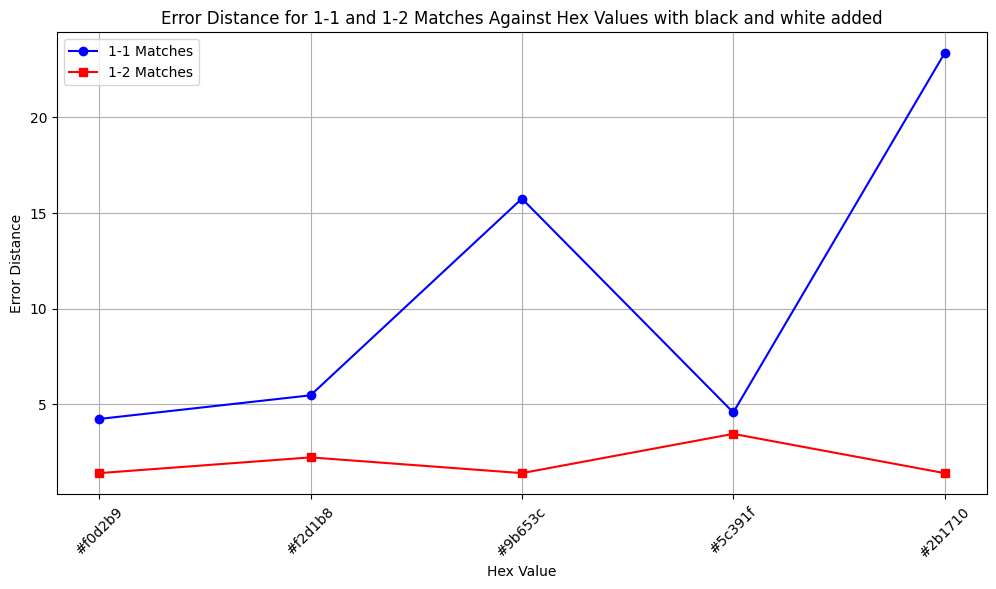

In [ ]:
plt.figure(figsize=(12, 6))
hex_codes = df_resultsADD["target_hex"]
matches1_1 = df_resultsADD["1-1HexMatch_Distance"]
matches1_2 = df_resultsADD["1-2Hex_Distance"]
plt.plot(hex_codes, matches1_1, marker='o', linestyle='-', color='blue', label='1-1 Matches')
plt.plot(hex_codes, matches1_2, marker='s', linestyle='-', color='red', label='1-2 Matches')

plt.xticks(rotation=45)
plt.xlabel('Hex Value')
plt.ylabel('Error Distance')
plt.title('Error Distance for 1-1 and 1-2 Matches Against Hex Values with black and white added')
plt.legend()
plt.grid(True)
plt.show()

# 6. Results

## Section2 1: Computer Visions skin detection, Algorithm1 and Algorithm2

Interpret the results from Section 5.
i. Do your model estimates seem reasonable? Why or why not? (e.g.,
provide examples of some model predictions like “for a 30 year old female
patient, our model predicts x% risk, whereas for a 30 year old male
patient, our model predicts y% risk”)


Results of the Computer Vision based skin detection algorithms show promising results and seem reasonable because as we can see in algorithm 1 that was performed in phase 2 on analysing the above results of detection and matching through the algorithm we observe that out of the 19 face samples we considered 6 of them did not end up with bounding boxes in the region of our interest, thus causing the skin tone detection to be completely off detecting colors like blues and purples possibly becasue the check region was fixed based on hard coding coordinates which was applied to all images which caused misplacement in the bounding box for some images.However, this was rectified in Algorithm two beacuse there was a better canvas of skin and was uniform for all images thus appiximation of skin shades was better or this algorithm, when comparing the error rates algorithm 1 had higher error rate of 7.52247341543291 whereas algorithm 2 has seen a reduction in error at 3.935134806087896, when we compare how the computer detection algorithm did for lighter skin tones vs darker Algorithm 1 saw higher error rate for lighter skin tones (8.18) compared to darker (5.68) but there was also higher error in bounding box detection in darker skin tones when compared to algorithm two we observed the same results but the error rate was significantly lower(4.11 for lighter skin, 3.81 for darker).

ii. What can you say about your model performance (e.g., based on the
evaluation metrics you calculated)?

The model performed significantly well in terms of error rate and improvement from algorithm 1 that was done in phase 2 to algorithm 2 but there is still scope for improvement.

b. How do your results support or reject your hypotheses from Section 1?

The results support most of the hypothesis but rejects the hypothesis that darker skins will peerform worse compared to lighter skin tones because the model results showed the opposite

## Section 2: Hex 1-2 Skin tone to Foundation matching

Our original results from phase 2, as seen above concluded that using a 1-2 match, though performing with a lower error rate on middle-toned skin tones compared to 1-1 matches, the methodology was still prone to error rate increases as the skin tone shade becomes darker. This seemed due to the representation of darker skin tones for this brand is lacking. Due to this, for a darker skin tone, it is not possible to mix two shades to retrieve the closest shade, as there are no darker shades to mix darker than the target shade. To explore the possibility of an accurate match for the darker skin tones and lighter skin tones, we aim to introduce a true black and true white color into the dataset, to show the possibility of brands adding these skin tones, or the possibility of us adding cartridges to a final product to help increase the applicability of the foundation shades within a brand. Therefore, we tested if matching foundation shades in one brand, and adding black and white colors can produce significantly better results across all skin tones compared to a 1-1 match.

 Above, it can be seen that simply adding the colors black and white to the available colors significantly reduces the error rate for a 1-2 match for the darkest skin tone, with a hex value different from the true skin tone being 1.414214, compared to that of a 1-1 match, which was 23.345235. Our results demonstrate that this methodology of foundation matching does outperform the current standard, and also allows for an algorithmic methodology for people to retrieve a better match for a methodology people are already using. Therefore, our results accepts the hypothesis that 1-2 matches with an inclusion of black and white colors delivers a closer foundation match in comparison to a 1-1 match.

# 7. Conclusion and Limitations

Our hypothesis regarding the new algorithm introduced to identify skin tone using computer vision techniques was that the algorithm will produce results better than algorithm 1 (introduced in phase 2) because this algorithm segments out areas like the eyes, eyebrows, lips, hair and background, which can contribute to average color calculation. Based on our results, we are able to accept this hypothesis. Additionally, we hypothesize that darker skin tones will produce a higher error rate than lighter skin tones in the foundation matching and pictures with low lighting will show detection bias. Our results reject the hypothesis that darker skins will perform worse compared to lighter skin tones because the model results showed the opposite. It should be noted that for the purpose of this phase, we excluded the side images from the dataset, as this did not perform well with the newly introduced algorithm, which relies on a front-facing image. For the next phase, we want to explore how we can account for different angles of taking an image. Our analysis is also limited to the small dataset. For the next phase, we hope to collect our own images that may have lighting scores with more metrics than provided in the MST-E dataset, as this data set only provides a metric that divides between bad lighting and acceptable lighting.

When interpreting our results regarding creating 1-2 matches of skin tone to foundations, we hypothesize that introducing a pure white and black color to a dataset of foundations within a brand will result in lower error distance for our darker skin tones compared to our previous results. Based on our results, we are able to accept our hypothesis. Limitations in this analysis include a small number of skin tones that are tested. In the next phase, we hope to combine the resulting shades from section 1 and find the 1-2 foundation matches for those skin tones as well. Additionally, we want to further investigate how applicable these matches are to how foundation appears in real life. In order to do this, we will take the resulting matches in the next phase and investigate in person at sephora if the matches are accurate to the visible eye. Furthermore, by adding black and white as colors, there is an assumption made that it is possible to add these colors without changing the consistency of the foundation brands themselves. We will investigate further how creating our own colors, or purchasing professional makeup mixing colors such as the black and white colors will affect the accessibility of our application in the real world.


# 8. Contribution List

1. Dillanie: Modeling Section 2, Conclusion & Limitations
2. Harshini: Datasheets, Cleaned Data Imports, Modeling Section 1
3. Priyanshi: Summarize the Data
4. Kimia: Introduction, Cleaned Data Imports

# 9. Citations

[1]Buolamwini, J. and Gebru, T. (2018) Gender shades: Intersectional accuracy disparities in commercial gender classification, PMLR. Available at: https://proceedings.mlr.press/v81/buolamwini18a.html?mod=article_inline (Accessed: 15 April 2024).
[2] What is CIELAB Color Space? https://www.hunterlab.com/blog/what-is-cielab-color-space/#:~:text=CIELAB%20or%20CIE%20L*a,change%20humans%20see%20between%20colors.

[3] Colorizer - Color picker and converter (RGB HSL HSB/HSV CMYK HEX LAB): https://colorizer.org/.

[4] OpenCV: Cascade Classifier: https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html.

[5] Facial landmarks with dlib, OpenCV, and Python - PyImageSearch: 2021. https://pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/.

[6] Why are red, yellow, and blue the primary colors in painting but computer screens use red, green, and blue? 2015. https://www.wtamu.edu/~cbaird/sq/2015/01/22/why-are-red-yellow-and-blue-the-primary-colors-in-painting-but-computer-screens-use-red-green-and-blue/#:~:text=For%20additive%20color%20systems%20like,cyan.

[7] Seen vs. Screen - Sherwin-Williams: https://www.sherwin-williams.com/architects-specifiers-designers/education/project-profiles/sw-dir-article-seenscreen.

[8] Pujol, F.A., López, M.P., Jimeno-Morenilla, A. and López, M.P. 2017. Face detection based on skin color segmentation using fuzzy entropy. Entropy. 19, 1 (Jan. 2017), 26. DOI:https://doi.org/10.3390/e19010026.https://www.mdpi.com/1099-4300/19/1/26